In [2]:
from config_path import add_to_sys_path
add_to_sys_path()  # Call the function to add path

import numpy as np
from sympy.physics.wigner import wigner_3j,wigner_6j
import sympy as sy
from numpy import linalg as LA
from IPython.display import Latex,display
import matplotlib.pyplot as plt
from matplotlib import colors
%matplotlib inline
import seaborn as sns
import ujson as uj
sns.set()
sns.set_palette('bright')
from Energy_Levels import MoleculeLevels
from Energy_Levels import branching_ratios, Calculate_TDMs,Calculate_TDM_evecs, Calculate_forbidden_TDM_evecs, Calculate_forbidden_TDMs
from functools import partial
np.set_printoptions(precision=9, suppress=True)
# from tabulate import tabulate
from matplotlib.collections import LineCollection

In [3]:
%matplotlib inline

In [4]:
# X010 = MoleculeLevels.initialize_state('CaOH','40','X010',N_list,M_values = 'custom',I=[0,1/2],S=1/2,round=16,M_range=[1])
X010 = MoleculeLevels.initialize_state('YbOH','174','X010',[1,2,3,4],M_values = 'all',I=[0,0],S=1/2,round=8,P_values=[1/2,3/2])

In [5]:
# X010 = MoleculeLevels.initialize_state('CaOH','40','X010',N_list,M_values = 'custom',I=[0,1/2],S=1/2,round=16,M_range=[1])
# A000 = MoleculeLevels.initialize_state('YbOH','174','A000',[1,2,3,4],M_values = 'all',I=[0,0],S=1/2,round=8,P_values=[1/2,3/2])

In [39]:
# def track_transition_E(state_g,qdict_g,state_e,qdict_e,Ez,B0,dipole='z',parity_g='-',parity_e='+',Debye=1.465):
#     tables = []
#     lines = []
#     g_idx = state_g.select_q(qdict_g,parity=parity_g)
#     e_idx = state_e.select_q(qdict_e,parity=parity_e)
#     for E0 in Ez:
#         print(E0)
#         if dipole=='z': 
#             TDM = Debye*Calculate_TDMs(0,state_g,state_e,E0,B0)
#         elif dipole=='x':
#             TDM = Debye*(-1/np.sqrt(2)*(Calculate_TDMs(1,state_g,state_e,E0,B0) - Calculate_TDMs(-1,state_g,state_e,E0,B0)))
#         elif dipole=='+':
#             TDM = Debye*Calculate_TDMs(1,state_g,state_e,E0,B0)
#         elif dipole=='-':
#             TDM = Debye*Calculate_TDMs(-1,state_g,state_e,E0,B0)
#         elif dipole=='all':
#             TDM = Debye*1/np.sqrt(3)*sum([Calculate_TDMs(p,state_g,state_e,E0,B0) for p in [0,1,-1]])
#         field_lines = []
#         field_table = []
#         for i in g_idx:
#             Eg = state_g.evals0[i]
#             vec_g = state_g.evecs0[i]
#             q_g = abs(vec_g).argmax()
#             for j in e_idx:
#                 Ee = state_e.evals0[j]
#                 vec_e = state_e.evecs0[j]
#                 q_e = abs(vec_e).argmax()
#                 dE = np.round((Ee - Eg)/2,7)
#                 strength = np.round(TDM[j,i],4)
#                 if strength >1e-4:
#                     Ne,Je,Fe,Me = [state_e.q_numbers[_q][q_e] for _q in ['N','J','F','M']]
#                     Pe = {1:'+',-1:'-'}[state_e.parities[j]]
#                     Ng,Jg,Fg,Mg = [state_g.q_numbers[_q][q_g] for _q in ['N','J','F','M']]
#                     Pg = {1:'+',-1:'-'}[state_g.parities[i]]
#                     t_str = '(N={Ng}{Pg},J={Jg},F={Fg},M={Mg})->(N={Ne}{Pe},J={Je},F={Fe},M={Me}))'.format(Ne=Ne,Je=Je,Fe=int(Fe),Me=int(Me),Pe=Pe,Ng=Ng,Jg=Jg,Fg=int(Fg),Mg=int(Mg),Pg=Pg)
#                     e_str = str(dE)
#                     d_str = str(strength)
#                     field_table.append([t_str,e_str,d_str])
#                     field_lines.append(dE)
#         lines.append(sorted(field_lines))
#         tables.append(sorted(field_table,key=lambda x: x[1]))
#     return lines,tables



def get_json_data(file_path,numpy=False,ujson=True):
    if '.json' not in file_path:
        file_path+='.json'
    with open(file_path, 'r') as f:
        if ujson:
            data = uj.load(f)
        else:
            data = json.load(f)
    if numpy:
        data = np.array(data)
    return data

def save_json_data(data,file_path,caujson=True):
    if type(data) is np.ndarray:
        data_save = data.tolist()
    else:
        data_save=data
    if '.json' not in file_path:
        file_path+='.json'
    with open(file_path,'w') as f:
        if ujson:
            uj.dump(data_save,f)
        else:
            json.dump(data_save,f)
    print('Data saved to', file_path)

def transitions_B(state_g,state_e,Bsample,dipole='z',origin=0,Debye=5.24,cm=False,scale=2):
    if state_g.evecs_B is None:
        print('Run ZeemanMap on Ground State')
        return
    if state_e.evecs_B is None or not np.array_equiv(state_e.Bz,state_g.Bz):
        print('Run ZeemanMap on Excited State with same fields as Ground State')
        return
    print('Using E (V/cm) field of',state_g._Ez)
    gBz = state_g.Bz
    TDM_B = np.zeros((len(Bsample),state_e.size,state_g.size))
    dE_B = np.zeros((len(Bsample),state_e.size,state_g.size))
    t_str_B = np.empty_like(dE_B, dtype='object')
    for iB,B0 in enumerate(Bsample):
        idx = np.searchsorted(gBz,B0)
        B0 = gBz[idx]
        print(B0)
        TDM_func = partial(Calculate_forbidden_TDM_evecs,G_evecs=state_g.evecs_B[idx],Ground=state_g,E_evecs = state_e.evecs_B[idx],Excited=state_e,scale=scale)
        TDM_dict = {
            'z': TDM_func(0),
            '+': TDM_func(1),
            '-': TDM_func(-1),
                   }
        if dipole=='z' or dipole=='+' or dipole=='-':
            TDM = TDM_dict[dipole]
        elif 'x' in dipole:
            TDMx = -1/np.sqrt(2)*(TDM_dict['+']-TDM_dict['-'])
            if dipole=='x':
                TDM=TDMx
            elif dipole=='x+z' or dipole=='z+x':
                TDM = 1/np.sqrt(2)*(abs(TDMx)+abs(TDM_dict['z']))
        elif dipole=='all':
            TDM = 1/np.sqrt(3)*(TDM_dict['z']+TDM_dict['+']+TDM_dict['-'])
        else:
            TDM = 1/np.sqrt(3)*(abs(TDM_dict['z'])+abs(TDM_dict['+'])+abs(TDM_dict['-']))
        TDM*=Debye
        TDM_B[iB,:,:] = TDM
        for i in range(state_g.size):
            Eg = state_g.evals_B[idx][i]
            vec_g = state_g.evecs_B[0][i] #correlate with zero field state
            q_g = abs(vec_g).argmax()
            for j in range(state_e.size):
                Ee = state_e.evals_B[idx][j]+origin*(29979.2458)
                vec_e = state_e.evecs_B[0][j]
                q_e = abs(vec_e).argmax()
                dE = (Ee - Eg)
                if cm:
                    dE/=(29979.2458)
                dE_B[iB,j,i] = dE
                Je,Fe,Me = [state_e.q_numbers[_q][q_e] for _q in ['J','F','M']]
                Pe = {1:'+',-1:'-'}[state_e.parities[j]]
                Ng,Jg,Fg,Mg = [state_g.q_numbers[_q][q_g] for _q in ['N','J','F','M']]
                Pg = {1:'+',-1:'-'}[state_g.parities[i]]
                if Me % 1 == 0:
                    Me=int(Me)
                    Mg = int(Mg)
                    Fe = int(Fe)
                    Fg = int(Fg)
                t_str = '(N={Ng}{Pg},J={Jg},F={Fg},M={Mg})->(J={Je}{Pe},F={Fe},M={Me})'.format(Je=Je,Fe=Fe,Me=Me,Pe=Pe,Ng=Ng,Jg=Jg,Fg=Fg,Mg=Mg,Pg=Pg)
                t_str_B[iB,j,i] = t_str
    return TDM_B,dE_B,t_str_B


def transitions_E(state_g,state_e,Esample,origin = 0,dipole='z',Debye=5.24,cm=True,scale=2):
    if state_g.evecs_E is None:
        print('Run StarkMap on Ground State')
        return
    if state_e.evecs_E is None or not np.array_equiv(state_e.Ez,state_g.Ez):
        print('Run StarkMap on Excited State with same fields as Ground State')
        return
    print('Using B (G) field of',state_g._Bz)
    gEz = state_g.Ez
    TDM_E = np.zeros((len(Esample),state_e.size,state_g.size))
    dE_E = np.zeros((len(Esample),state_e.size,state_g.size))
    t_str_E = np.empty_like(dE_E, dtype='object')
    for iE,E0 in enumerate(Esample):
        idx = np.searchsorted(gEz,E0)
        E0 = gEz[idx]
        print(E0)
        TDM_func = partial(Calculate_forbidden_TDM_evecs,G_evecs=state_g.evecs_E[idx],Ground=state_g,E_evecs = state_e.evecs_E[idx],Excited=state_e,scale=scale)
        TDM_dict = {
            'z': TDM_func(0),
            '+': TDM_func(1),
            '-': TDM_func(-1),
                   }
        if dipole=='z' or dipole=='+' or dipole=='-':
            TDM = TDM_dict[dipole]
        elif 'x' in dipole:
            TDMx = -1/np.sqrt(2)*(TDM_dict['+']-TDM_dict['-'])
            if dipole=='x':
                TDM=TDMx
            elif dipole=='x+z' or dipole=='z+x':
                TDM = 1/np.sqrt(2)*(abs(TDMx)+abs(TDM_dict['z']))
        elif dipole=='all':
            TDM = 1/np.sqrt(3)*(TDM_dict['z']+TDM_dict['+']+TDM_dict['-'])
        else:
            TDM = 1/np.sqrt(3)*(abs(TDM_dict['z'])+abs(TDM_dict['+'])+abs(TDM_dict['-']))
        TDM*=Debye
        TDM_E[iE,:,:] = TDM
        for i in range(state_g.size):
            Eg = state_g.evals_E[idx][i]
            vec_g = state_g.evecs_E[0][i] #correlate with zero field state
            q_g = abs(vec_g).argmax()
            for j in range(state_e.size):
                Ee = state_e.evals_E[idx][j]+origin*(29979.2458)
                vec_e = state_e.evecs_E[0][j]
                q_e = abs(vec_e).argmax()
                dE = (Ee - Eg)
                if cm:
                    dE/=(29979.2458)
                dE_E[iE,j,i] = dE
                Je,Fe,Me = [state_e.q_numbers[_q][q_e] for _q in ['J','F','M']]
                Pe = {1:'+',-1:'-'}[state_e.parities[j]]
                Ng,Jg,Fg,Mg = [state_g.q_numbers[_q][q_g] for _q in ['N','J','F','M']]
                Pg = {1:'+',-1:'-'}[state_g.parities[i]]
                if Me % 1 == 0:
                    Me=int(Me)
                    Mg = int(Mg)
                    Fe = int(Fe)
                    Fg = int(Fg)
                t_str = '(N={Ng}{Pg},J={Jg},F={Fg},M={Mg})->(J={Je}{Pe},F={Fe},M={Me})'.format(Je=Je,Fe=Fe,Me=Me,Pe=Pe,Ng=Ng,Jg=Jg,Fg=Fg,Mg=Mg,Pg=Pg)
                t_str_E[iE,j,i] = t_str
    return TDM_E,dE_E,t_str_E

def lorentzian(f,f0,g,N):
    return N*(g/2)**2 /((f-f0)**2 + (g/2)**2)

def simulate_spectra_E(TDM_E,dE_E,g_idx,e_idx,Esample,E0=0,g=7.9/(29979.2458),cut=True,dip=False,thresh = 0.001,dipole='z'):
    header = ['Transition','Estimated Frequency (cm-1)','Dipole Moment (D)']
    all_param = []
    flist = []
    TDMlist = []
    iE = np.searchsorted(Esample,E0)
    E0 = Esample[iE]
    for i in g_idx:
            for j in e_idx:
                _TDM = TDM_E[iE,j,i]
                _dE = dE_E[iE,j,i]
                if _dE<0:
                    continue
                flist.append(_dE)
                all_param.append([_dE,g,_TDM])
                TDMlist.append(_TDM)
    fmin = min(flist)-5*g
    fmax = max(flist)+5*g
    freq = np.linspace(fmin,fmax,1000)
    plt.figure()
    tot_lor = np.zeros(1000)
    for param in all_param:
        tot_lor+=lorentzian(freq,*param)
    if dip:
        tot_lor*=-1
    plt.plot(freq,tot_lor)
    return flist,tot_lor,TDMlist

def print_table_E(Evals,TDM_E,dE_E,t_str_E,g_idx,e_idx,cut=True,thresh = 0.001,dipole='z'):
    header = ['Transition','Estimated Frequency','Dipole Moment (D)']
    all_table = []
    for iE in range(len(Evals)):
        print('\nE (V/cm) =',Evals[iE])
        print('Pol =',dipole)
        E_table = []
        for i in g_idx:
            for j in e_idx:
                _TDM = TDM_E[iE,j,i]
                _dE = dE_E[iE,j,i]
                _t_str = t_str_E[iE,j,i]
                if _dE<=0:
                    continue
                if abs(_TDM)<thresh and cut:
                    continue
                E_table.append([_t_str,str(_dE),str(_TDM)])
        E_table = sorted(E_table,key=lambda x: float(x[1]))
        print(tabulate(E_table,headers=header,floatfmt=('','.5f','.5f')))
        all_table.append(E_table)
    return all_table

def print_table_B(Bvals,TDM_B,dE_B,t_str_B,g_idx,e_idx,cut=True,thresh = 0.001,dipole='z'):
    header = ['Transition','Estimated Frequency','Dipole Moment (D)']
    all_table = []
    for iB in range(len(Bvals)):
        print('\nB (G) =',Bvals[iB])
        print('Pol =',dipole)
        B_table = []
        for i in g_idx:
            for j in e_idx:
                _TDM = TDM_B[iB,j,i]
                _dE = dE_B[iB,j,i]
                _t_str = t_str_B[iB,j,i]
                if _dE<=0:
                    continue
                if abs(_TDM)<thresh and cut:
                    continue
                B_table.append([_t_str,str(_dE),str(_TDM)])
        B_table = sorted(B_table,key=lambda x: float(x[1]))
        print(tabulate(B_table,headers=header,floatfmt=('','.5f','.5f')))
        all_table.append(B_table)
    return all_table

def plot_B(Bvals,TDM_B,dE_B,g_idx=None,e_idx=None,Debye=2,thresh = 0.001,title=None,linescale=None,figure=None,**kwargs):
    if g_idx is None:
        g_idx = np.arange(0,TDM_B.shape[2])
    if e_idx is None:
        e_idx = np.arange(0,TDM_B.shape[1])
    if figure is None:
        fig,a = plt.subplots(figsize=(8,6))
    else:
        fig = figure
        a = fig.axes[0]
    for i in g_idx:
        for j in e_idx:
            linestyle='solid'
            _TDM = TDM_B[:,j,i]
            _dE = dE_B[:,j,i]
            if _dE[0]<=0:
                continue
            if abs(_TDM).mean()<thresh:
                continue
            if abs(_TDM).mean()<0.001:
                pass
#                 linestyle='dotted'
            scale_mean=np.square(_TDM).mean()/Debye
            scale = 0.5*(np.square(_TDM[1:])+np.square(_TDM[:-1]))/Debye
            if linescale is None:
                a.plot(Bvals,_dE,linestyle=linestyle,**kwargs)
            else:
                filterByKey = lambda keys: {x: kwargs[x] for x in keys}
                pt_keys = ['marker','mfc','color']
                lc_keys = ['color']
                pt_kwargs = filterByKey(pt_keys)
                lc_kwargs = filterByKey(lc_keys)
                x = Bvals
                y = _dE
                lwidths = scale*linescale
                points = np.array([x, y]).T.reshape(-1, 1, 2)
                segments = np.concatenate([points[:-1], points[1:]], axis=1)
                lc = LineCollection(segments, linewidths=lwidths,**lc_kwargs)
                a.add_collection(lc)
                a.plot(Bvals,_dE,linestyle='None',**pt_kwargs)
    plt.xlabel('Magnetic Field (G)',fontsize=14)
    plt.ylabel('Transition Frequency (MHz/2)',fontsize=14)
#     if title is None:
#         title = 'CaOH Microwave Transitions'
#     plt.title(title,fontsize=18)
    plt.ticklabel_format(useOffset=False, style='plain')
    return

def plot_E(Evals,TDM_E,dE_E,g_idx=None,e_idx=None,Debye=2,thresh = 0.001,title=None,linescale=None,figure=None,**kwargs):
    if g_idx is None:
        g_idx = np.arange(0,TDM_E.shape[2])
    if e_idx is None:
        e_idx = np.arange(0,TDM_E.shape[1])
    if figure is None:
        fig,a = plt.subplots(figsize=(8,6))
    else:
        fig = figure
        a = fig.axes[0]
    for i in g_idx:
        for j in e_idx:
            linestyle='solid'
            _TDM = TDM_E[:,j,i]
            _dE = dE_E[:,j,i]
            if _dE[0]<=0:
                continue
            if abs(_TDM).mean()<thresh:
                continue
            if abs(_TDM).mean()<0.001:
                pass
#                 linestyle='dotted'
            scale_mean=np.square(_TDM).mean()/Debye
            scale = 0.5*(np.square(_TDM[1:])+np.square(_TDM[:-1]))
            if linescale is None:
                a.plot(Evals,_dE,linestyle=linestyle,**kwargs)
            else:
                filterByKey = lambda keys: {x: kwargs[x] for x in keys}
                pt_keys = ['marker','mfc','color']
                lc_keys = ['color']
                pt_kwargs = filterByKey(pt_keys)
                lc_kwargs = filterByKey(lc_keys)
                x = Evals
                y = _dE
                lwidths = scale*linescale
                points = np.array([x, y]).T.reshape(-1, 1, 2)
                segments = np.concatenate([points[:-1], points[1:]], axis=1)
                lc = LineCollection(segments, linewidths=lwidths,**lc_kwargs)
                a.add_collection(lc)
                a.plot(Evals,_dE,linestyle='None',**pt_kwargs)
    plt.xlabel('Electric Field (V/cm)',fontsize=14)
    plt.ylabel('Transition Frequency (MHz/2)',fontsize=14)
#     if title is None:
#         title = 'CaOH Microwave Transitions'
#     plt.title(title,fontsize=18)
    plt.ticklabel_format(useOffset=False, style='plain')
    return

def simulate_Escan(Ez,TDM_E,dE_E,e,g,g_idx=None,e_idx=None,Debye=5.24,thresh = 0.001,title=None,linescale=None,figure=None,**kwargs):
    if g_idx is None:
        g_idx = np.arange(0,TDM_E.shape[2])
    if e_idx is None:
        e_idx = np.arange(0,TDM_E.shape[1])
    if figure is None:
        fig,a = plt.subplots(figsize=(8,6))
    else:
        fig = figure
        a = fig.axes[0]
    for i in g_idx:
        for j in e_idx:
            linestyle='solid'
            _TDM = TDM_E[:,j,i]
            _dE = dE_E[:,j,i]
            if _dE[0]<=0:
                continue
            if abs(_TDM).mean()<thresh:
                continue
            if abs(_TDM).mean()<0.001:
                pass
#                 linestyle='dotted'
            scale_mean=np.square(_TDM).mean()/Debye
            scale = 0.5*(np.square(_TDM[1:])+np.square(_TDM[:-1]))
            a.plot(Ez,)
            if linescale is None:
                a.plot(Evals,_dE,linestyle=linestyle,**kwargs)
            else:
                filterByKey = lambda keys: {x: kwargs[x] for x in keys}
                pt_keys = ['marker','mfc','color']
                lc_keys = ['color']
                pt_kwargs = filterByKey(pt_keys)
                lc_kwargs = filterByKey(lc_keys)
                x = Evals
                y = _dE
                lwidths = scale*linescale
                points = np.array([x, y]).T.reshape(-1, 1, 2)
                segments = np.concatenate([points[:-1], points[1:]], axis=1)
                lc = LineCollection(segments, linewidths=lwidths,**lc_kwargs)
                a.add_collection(lc)
                a.plot(Evals,_dE,linestyle='None',**pt_kwargs)
    plt.xlabel('Electric Field (V/cm)',fontsize=14)
    plt.ylabel('Transition Frequency (MHz/2)',fontsize=14)
#     if title is None:
#         title = 'CaOH Microwave Transitions'
#     plt.title(title,fontsize=18)
    plt.ticklabel_format(useOffset=False, style='plain')
    return

def Lorentzian(x,x0,g,N):
    return N*(g/2)**2/((x-x0)**2 + (g/2)**2)

def TwoLorentzians(x,g1,g2,x01,x02,N1,N2):
    return Lorentzian(x,x01,g1,N1) + Lorentzian(x,x02,g2,N2)

def fitLorentzian(xscale, data,guess,sigma=None,plot=True,verbose=False):
    if verbose:
        print(guess)
    function = Lorentzian
    params,error,residuals = fitFunction(xscale,data,function,guess,sigma,plot)
    if verbose:
        print('\n')
        print('Fit error = ',error)
        print('FIT PARAMS = ',params)
        mean = params[1]
        mean_err = error[1]
        fwhm = params[0]
        fwhm_err = error[0]
        print('Mean = {} +/- {}, FWHM = {} +/- {}'.format(mean,mean_err,fwhm,fwhm_err))
    return [params,error,residuals]

def fit2Lorentzians(xscale, data,mean_guess,fwhm_guess,norm_guess,sigma=None,plot=True,verbose=False):
    guess = list(fwhm_guess) + list(mean_guess) + list(norm_guess)
    if verbose:
        print(guess)
    function = TwoLorentzians
    params,error,residuals = fitFunction(xscale,data,function,guess,sigma,plot)
    if verbose:
        print('\n')
        print('Fit error = ',error)
        print('FIT PARAMS = ',params)
        for i in range(2):
            peaknum = i+1
            mean = params[2+i]
            mean_err = error[2+i]
            fwhm = params[i]
            fwhm_err = error[i]
            print('Mean {} = {} +/- {}, FWHM {} = {} +/- {}'.format(peaknum,mean,mean_err,peaknum,fwhm,fwhm_err))
    return [params,error,residuals]

# def track_transition_B(state_g,qdict_g,state_e,qdict_e,Bscan,dipole='z',parity_g='-',parity_e='+',Debye=1.465):
#     tables = []
#     lines = []
#     g_idx = state_g.select_q(qdict_g,parity=parity_g)
#     e_idx = state_e.select_q(qdict_e,parity=parity_e)
#     if state_g.evecs_B is None:
#         print('Run ZeemanMap on Ground State')
#         return
#     if state_e.evecs_B is None:
#         print('Run ZeemanMap on Excited State')
#         return
#     for B0 in Bscan:
#         idx = np.searchsorted(Bz,B0)
#         B0 = Bz[idx]
#         print(B0)
#         if dipole=='z': 
#             TDM = Debye*Calculate_TDM_evecs(0,state_g.evecs_B[idx],state_g,state_e.evecs_B[idx],state_e)
#         elif dipole=='x':
#             TDM = Debye*(-1/np.sqrt(2)*sum([p*Calculate_TDM_evecs(p,state_g.evecs_B[idx],state_g,state_e.evecs_B[idx],state_e) for p in [-1,1]]))
#         elif dipole=='+':
#             TDM = Debye**Calculate_TDM_evecs(1,state_g.evecs_B[idx],state_g,state_e.evecs_B[idx],state_e)
#         elif dipole=='-':
#             TDM = Debye**Calculate_TDM_evecs(-1,state_g.evecs_B[idx],state_g,state_e.evecs_B[idx],state_e)
#         elif dipole=='all':
#             TDM = Debye*1/np.sqrt(3)*sum([(-1)**p*Calculate_TDM_evecs(p,state_g.evecs_B[idx],state_g,state_e.evecs_B[idx],state_e) for p in [0,1,-1]])
#         else:
#             TDM = Debye*1/np.sqrt(3)*sum([abs(Calculate_TDM_evecs(p,state_g.evecs_B[idx],state_g,state_e.evecs_B[idx],state_e)) for p in [0,1,-1]])
#         field_lines = []
#         field_table = []
#         for i in g_idx:
#             Eg = state_g.evals_B[idx][i]
#             vec_g = state_g.evecs_B[idx][i]
#             q_g = abs(vec_g).argmax()
#             for j in e_idx:
#                 Ee = state_e.evals_B[idx][j]
#                 vec_e = state_e.evecs_B[idx][j]
#                 q_e = abs(vec_e).argmax()
#                 dE = np.round((Ee - Eg)/2,7)
#                 strength = np.round(TDM[j,i],5)
#                 if abs(strength) >1e-5:
#                     Ne,Je,Fe,Me = [state_e.q_numbers[_q][q_e] for _q in ['N','J','F','M']]
#                     Pe = {1:'+',-1:'-'}[state_e.parities[j]]
#                     Ng,Jg,Fg,Mg = [state_g.q_numbers[_q][q_g] for _q in ['N','J','F','M']]
#                     Pg = {1:'+',-1:'-'}[state_g.parities[i]]
#                     t_str = '(N={Ng}{Pg},J={Jg},F={Fg},M={Mg})->(N={Ne}{Pe},J={Je},F={Fe},M={Me})'.format(Ne=Ne,Je=Je,Fe=int(Fe),Me=int(Me),Pe=Pe,Ng=Ng,Jg=Jg,Fg=int(Fg),Mg=int(Mg),Pg=Pg)
#                     e_str = str(dE)
#                     d_str = str(strength)
#                     field_table.append([t_str,e_str,d_str])
#                     field_lines.append(dE)
#         lines.append(field_lines)
#         tables.append(sorted(field_table,key=lambda x: x[1]))
#     return lines,tables

# def all_B_tracking(state,g_q,e_q,Bvals,dipole='z',reorder_missing=True,plot=True):
#     B_lines,B_tables = track_transition_B(state,g_q,state,e_q,Bvals,dipole)
#     header = ['Transition','Estimated Frequency (MHz/2)','Dipole Moment (D)']
#     for i in range(len(Bvals)):
#         print('\nB (G) =',Bvals[i])
#         print('Pol =',dipole)
#         print(tabulate(B_tables[i],headers=header,floatfmt=('','.6f','.4f')))
#     for i,B in enumerate(B_lines):
#         print('Number of lines:',len(B))
#     if plot:   
#         B_linesT = plot_B_tracking(Bvals,B_lines,dipole,reorder_missing)
#         return B_lines,B_tables,B_linesT
#     else:
#         return B_lines,B_tables

# def plot_B_tracking(Bvals,B_lines,B_tables=None,dipole='z',reorder_missing=True,title=None,figure=None,color=None,marker='o'):
#     nlast = len(B_lines[-1])
#     for i,B in enumerate(B_lines):
#         while len(B)<nlast:
#             if reorder_missing:
#                 B_lines[i].append(B_lines[i][-1])
#             else:
#                 nlast=len(B)
#     BT = list(zip(*B_lines))
#     if figure is None:
#         plt.figure(figsize=(8,6))
#     else:
#         plt.figure(figure)
#     for i,line in enumerate(BT):
#         linestyle='solid'
#         if B_tables is not None:
#             strength = [float(B_tables[b][i][-1]) for b in range(1,len(B_tables))]
#             strength_avg = sum(strength)/(len(strength))
#             if strength_avg<0.05:
#                 linestyle='dotted'
#         if color is None:
#             plt.plot(Bvals,line,marker=marker,mfc='white',linestyle=linestyle)
#         else:
#             plt.plot(Bvals,line,marker=marker,mfc='white',linestyle=linestyle,color=color)
#     plt.xlabel('Magnetic Field (G)',fontsize=14)
#     plt.ylabel('Transition Frequency (MHz/2)',fontsize=14)
#     if title is None:
#         title = 'CaOH Microwave Transitions, {} Pol'.format(dipole)
#     plt.title(title,fontsize=18)
#     plt.ticklabel_format(useOffset=False, style='plain')
#     return BT

# def Forbidden_TDM_b2a(p,Ground,Excited,coeffs = [0.852, 0.087, 0.516],dA=2.32,dB=1.87): #uA010,kA010,B010
#     G_qn = Ground.q_numbers
#     E_qn = Excited.q_numbers
    
#     G_qnA = Ground.alt_q_numbers['aBJ']
#     G_b2a = Ground.library.basis_changers['a_bBJ'](G_qn,G_qnA)
#     G_qnA_v = Ground.alt_q_numbers['vibronic']
#     G_vibronic = Ground.library.basis_changers['X010_vibronic'](G_qnA,G_qnA_v)
    
#     E_qnA = E_qn
#     E_qnA_v = Excited.alt_q_numbers['vibronic']
#     uA010_qn = Excited.alt_q_numbers['uA010']
#     kA010_qn = Excited.alt_q_numbers['kA010']
#     B010_qn = Excited.alt_q_numbers['B010']
#     E_vibronic = Excited.library.basis_changers['A000_vibronic'](E_qnA,E_qnA_v)
#     uA010_mixing = Excited.library.basis_changers['A000_uA010'](E_qnA_v,uA010_qn) 
#     kA010_mixing = Excited.library.basis_changers['A000_kA010'](E_qnA_v,kA010_qn)
#     B010_mixing = Excited.library.basis_changers['A000_B010'](E_qnA_v,B010_qn)
    
#     TDM_u = dA*Excited.library.TDM_p_forbidden_builders[Excited.iso_state](p,G_qnA_v,uA010_qn)
#     TDM_k = dA*Excited.library.TDM_p_forbidden_builders[Excited.iso_state](p,G_qnA_v,kA010_qn)
#     TDM_B = dB* Excited.library.TDM_p_forbidden_builders[Excited.iso_state](p,G_qnA_v,B010_qn)
    
#     TDM_p = E_vibronic.T@(coeffs[0]*uA010_mixing.T@TDM_u + coeffs[1]*kA010_mixing.T@TDM_k + coeffs[2]*B010_mixing.T@TDM_B)@G_vibronic@G_b2a
#     return TDM_p

def Forbidden_TDM_b2a(p,Ground,Excited,coeffs = [0.5, 0.5, -0.5]): #uA010,kA010,B010
    G_qn = Ground.q_numbers
    E_qn = Excited.q_numbers
    
    G_qnA = Ground.alt_q_numbers['aBJ']
    G_b2a = Ground.library.basis_changers['a_bBJ'](G_qn,G_qnA)
#     G_qnA_v = Ground.alt_q_numbers['vibronic']
    
    E_qnA = E_qn
    
    TDM_u = Excited.library.TDM_p_forbidden_builders['uA010'](p,G_qnA,E_qnA)
    TDM_k = Excited.library.TDM_p_forbidden_builders['kA010'](p,G_qnA,E_qnA)
    TDM_B = Excited.library.TDM_p_forbidden_builders['B010'](p,G_qnA,E_qnA)
    
    TDM_p = (coeffs[0]*TDM_u + coeffs[1]*TDM_k + coeffs[2]*TDM_B)@G_b2a
    return TDM_p

def Forbidden_TDM_kuB(p,Ground,Excited): #uA010,kA010,B010
    G_qn = Ground.q_numbers
    E_qn = Excited.q_numbers
    
    G_qnA = Ground.alt_q_numbers['aBJ']
    G_b2a = Ground.library.basis_changers['a_bBJ'](G_qn,G_qnA)
    G_qnA_v = Ground.alt_q_numbers['vibronic']
    
    E_qnA = E_qn
    
    TDM_u = Excited.library.TDM_p_forbidden_builders['uA010'](p,G_qnA,E_qnA)
    TDM_k = Excited.library.TDM_p_forbidden_builders['kA010'](p,G_qnA,E_qnA)
    TDM_B = Excited.library.TDM_p_forbidden_builders['B010'](p,G_qnA,E_qnA)
    
    TDM_p_u = TDM_u@G_b2a
    TDM_p_k = TDM_k@G_b2a
    TDM_p_B = TDM_B@G_b2a
    return np.array([TDM_p_u,TDM_p_k,TDM_p_B])

# def Forbidden_TDM_kuB(p,Ground,Excited):
#     G_qn = Ground.q_numbers
#     E_qn = Excited.q_numbers
    
#     G_qnA = Ground.alt_q_numbers['aBJ']
#     G_b2a = Ground.library.basis_changers['a_bBJ'](G_qn,G_qnA)
#     G_qnA_v = Ground.alt_q_numbers['vibronic']
#     G_vibronic = Ground.library.basis_changers['X010_vibronic'](G_qnA,G_qnA_v)
    
#     E_qnA = E_qn
#     E_qnA_v = Excited.alt_q_numbers['vibronic']
#     uA010_qn = Excited.alt_q_numbers['uA010']
#     kA010_qn = Excited.alt_q_numbers['kA010']
#     B010_qn = Excited.alt_q_numbers['B010']
#     E_vibronic = Excited.library.basis_changers['A000_vibronic'](E_qnA,E_qnA_v)
#     uA010_mixing = Excited.library.basis_changers['A000_uA010'](E_qnA_v,uA010_qn) 
#     kA010_mixing = Excited.library.basis_changers['A000_kA010'](E_qnA_v,kA010_qn)
#     B010_mixing = Excited.library.basis_changers['A000_B010'](E_qnA_v,B010_qn)
    
#     TDM_u = dA*Excited.library.TDM_p_forbidden_builders[Excited.iso_state](p,G_qnA_v,uA010_qn)
#     TDM_k = dA*Excited.library.TDM_p_forbidden_builders[Excited.iso_state](p,G_qnA_v,kA010_qn)
#     TDM_B = dB* Excited.library.TDM_p_forbidden_builders[Excited.iso_state](p,G_qnA_v,B010_qn)
    
#     TDM_p_u = E_vibronic.T@uA010_mixing.T@TDM_u@G_vibronic@G_b2a
#     TDM_p_k = E_vibronic.T@kA010_mixing.T@TDM_k@G_vibronic@G_b2a
#     TDM_p_B = E_vibronic.T@B010_mixing.T@TDM_B@G_vibronic@G_b2a
#     return np.array([TDM_p_u,TDM_p_k,TDM_p_B])

def select_dipole(dipole,TDM_func):
    if dipole == 'z':
        TDM = TDM_func(0)
    elif dipole == '+':
        TDM = TDM_func(1)
    elif dipole == '-':
        TDM = TDM_func(1)
    elif 'x' in dipole:
        TDMx = -1/np.sqrt(2)*(TDM_func(1)-TDM_func(-1))
        if dipole=='x':
            TDM=TDMx
        elif dipole=='x+z' or dipole=='z+x':
            TDM = 1/np.sqrt(2)*(abs(TDMx)+abs(TDM_func(0)))
    else:
        TDM = 1/np.sqrt(3)*(abs(TDM_func(-1))+abs(TDM_func(0))+abs(TDM_func(1)))
    return TDM
    


def simulate_transitions(field_vals,state_g,state_e,E_or_B='E',origin = 0,dipole='z',Debye=5.24,cm=True,coeffs = [0.852, 0.087, 0.516]):
    if E_or_B=='E':
        if state_g.evecs_E is None:
            print('Run StarkMap on Ground State')
            return
        if state_e.evecs_E is None or not np.array_equiv(state_e.Ez,state_g.Ez):
            print('Run StarkMap on Excited State with same fields as Ground State')
            return
        print('Using B (G) field of',state_g._Bz)
        g_field = state_g.Ez
    TDM_vs_field = np.zeros((len(field_vals),state_e.size,state_g.size))
    dE_vs_field = np.zeros((len(field_vals),state_e.size,state_g.size))
    t_str_vs_field = np.empty_like(dE_vs_field, dtype='object')
    TDM_func = partial(Forbidden_TDM_b2a,Ground=state_g,Excited=state_e,coeffs=coeffs)
    TDM = select_dipole(dipole,TDM_func)
    f_idx = np.searchsorted(g_field,field_vals)
    if E_or_B == 'E':
        E_evecs = state_e.evecs_E[f_idx,:,:]
        G_evecs = state_g.evecs_E[f_idx,:,:]
        E_evals = state_e.evals_E[f_idx,:]
        G_evals = state_g.evals_E[f_idx,:]
    if cm:
        E_evals/=29979.2458
        G_evals/=29979.2458
    E_evals+= origin
    TDM_vs_field = np.matmul(E_evecs,np.matmul(TDM,np.transpose(G_evecs,axes=[0,2,1])))
    dE_vs_field = np.array([np.subtract.outer(E_e, E_g) for E_e,E_g in zip(E_evals,G_evals)])
    return TDM_vs_field,dE_vs_field

def gen_t_str(field_vals,state_g,state_e,TDM_vs_field, dE_vs_field,E_or_B='E',dipole='z'):
    t_str_vs_field = np.empty_like(np.zeros((len(field_vals),state_e.size,state_g.size)), dtype='object')
    g_field = state_g.Ez
    f_idx = np.searchsorted(g_field,field_vals)
    if E_or_B == 'E':
        E_evecs = state_e.evecs_E[f_idx,:,:]
        G_evecs = state_g.evecs_E[f_idx,:,:]
    for i in range(state_g.size):
        vec_g = G_evecs[0,i,:]
        q_g = abs(vec_g).argmax()
        for j in range(state_e.size):
            vec_e = E_evecs[0,j,:]
            q_e = abs(vec_e).argmax()
            for k in range(len(f_idx)):
                dE = dE_vs_field[k,j,i]
                TDM = TDM_vs_field[k,j,i]
                Je,Fe,Me = [state_e.q_numbers[_q][q_e] for _q in ['J','F','M']]
                Pe = {1:'+',-1:'-'}[state_e.parities[j]]
                Ng,Jg,Fg,Mg = [state_g.q_numbers[_q][q_g] for _q in ['N','J','F','M']]
                Pg = {1:'+',-1:'-'}[state_g.parities[i]]
                if Me % 1 == 0:
                    Me=int(Me)
                    Mg = int(Mg)
                    Fe = int(Fe)
                    Fg = int(Fg)
                t_str = '(N={Ng}{Pg},J={Jg},F={Fg},M={Mg})->(J={Je}{Pe},F={Fe},M={Me})'.format(Je=Je,Fe=Fe,Me=Me,Pe=Pe,Ng=Ng,Jg=Jg,Fg=Fg,Mg=Mg,Pg=Pg)
                t_str_vs_field[k,j,i] = t_str
    return t_str_vs_field

def plot_vs_field(field_vals,TDM_vs_field,dE_vs_field,g_idx=None,e_idx=None,Debye=2,thresh = 0.001,title=None,linescale=None,figure=None,**kwargs):
    if g_idx is None:
        g_idx = np.arange(0,TDM_E.shape[2])
    if e_idx is None:
        e_idx = np.arange(0,TDM_E.shape[1])
    if figure is None:
        fig,a = plt.subplots(figsize=(8,6))
    else:
        fig = figure
        a = fig.axes[0]
    for i in g_idx:
        for j in e_idx:
            linestyle='solid'
            _TDM = TDM_vs_field[:,j,i]
            _dE = dE_vs_field[:,j,i]
            if _dE[0]<=0:
                print('low',_dE[0])
                continue
            if abs(_TDM).mean()<thresh:
                continue
            if abs(_TDM).mean()<0.001:
                pass
#                 linestyle='dotted'
            scale_mean=np.square(_TDM).mean()
            scale = 0.5*(np.square(_TDM[1:])+np.square(_TDM[:-1]))
            if linescale is None:
                a.plot(field_vals,_dE,linestyle=linestyle,**kwargs)
            else:
                filterByKey = lambda keys: {x: kwargs[x] for x in keys}
                pt_keys = ['marker','mfc','color']
                lc_keys = ['color']
                pt_kwargs = filterByKey(pt_keys)
                lc_kwargs = filterByKey(lc_keys)
                x = field_vals
                y = _dE
                lwidths = scale*linescale
                points = np.array([x, y]).T.reshape(-1, 1, 2)
                segments = np.concatenate([points[:-1], points[1:]], axis=1)
                lc = LineCollection(segments, linewidths=lwidths,**lc_kwargs)
                a.add_collection(lc)
                a.plot(field_vals,_dE,linestyle='None',**pt_kwargs)
    plt.xlabel('Electric Field (V/cm)',fontsize=14)
    plt.ylabel('Transition Frequency (MHz/2)',fontsize=14)
#     if title is None:
#         title = 'CaOH Microwave Transitions'
#     plt.title(title,fontsize=18)
    plt.ticklabel_format(useOffset=False, style='plain')
    return

from scipy.optimize import curve_fit
from functools import partial

def fitFunction(xscale,data,function,guess,sigma,plot,bounds=None):
    xscale = np.array(xscale)
    data = np.array(data)
    guess = np.array(guess).astype(float)
    if bounds==None:
        bounds = (-np.inf,np.inf)
    try:
        popt,pcov = curve_fit(function,xscale,data,p0=guess,sigma=sigma,bounds=bounds)
        perr = np.round(np.sqrt((np.diag(pcov))),decimals=6)
        params = np.round(popt,decimals=6)
        fit = function(xscale,*popt)
        residuals = data - fit
        if plot:
            plotFitComparison(xscale,data,function,params,sigma)
            plotFitResiduals(xscale,residuals,sigma)
    except RuntimeError:
        print("Error - curve_fit failed")
        print(guess)
        plt.figure()
        plt.plot(xscale,data)
        plt.plot(xscale,function(xscale,*guess))
        params = []
        perr = []
        residuals = []
    return [params,perr,residuals]

def fit_intensities(xscale,data,state_g,state_e,field_EB,eg_idx_pairs,guess=[1.24,-0.1,-0.5],sigma=None,bounds=None,plot=True,verbose=False,dipole='z'):
    E0, B0 = field_EB
    G_evals,G_evecs = state_g.eigensystem(E0,B0)
    E_evals,E_evecs = state_e.eigensystem(E0,B0)
    TDM_func = partial(Forbidden_TDM_kuB,Ground=state_g,Excited=state_e)
    TDM_mats = select_dipole(dipole,TDM_func)
    function = partial(simulate_missing,TDM_u=TDM_mats[0],TDM_k=TDM_mats[1],TDM_B=TDM_mats[2],G_evals=G_evals,G_evecs=G_evecs,E_evals=E_evals,E_evecs=E_evecs,eg_idx_pairs=eg_idx_pairs)
    params,error,residuals = fitFunction(xscale,data,function,guess,sigma,plot,bounds=bounds)
    if verbose:
        print('Fit error = ',error)
        print('FIT PARAMS = ',params)
        print('\n')
    return [params,error,residuals]

def simulate_missing(xscale,u_coeff,k_coeff,B_coeff,TDM_u,TDM_k,TDM_B,G_evals,G_evecs,E_evals,E_evecs,eg_idx_pairs,origin =17998.5875-319.908907,square=True,cm=True,thresh=1e-3,g=10/(29979.2458)):
    TDM_EB = E_evecs@(u_coeff*TDM_u+k_coeff*TDM_k+B_coeff*TDM_B)@G_evecs.T
    if cm:
        E_evals/=29979.2458
        G_evals/=29979.2458
    E_evals+= origin
    dE_EB = np.subtract.outer(E_evals, G_evals)
    TDM_peaks = np.zeros(len(eg_idx_pairs))
    for k,(e_idx,g_idx) in enumerate(eg_idx_pairs):
        all_param = []
        flist = []
        for i in g_idx:
            for j in e_idx:
                _TDM = TDM_EB[j,i]
                _dE = dE_EB[j,i]
                if _dE<0:
                    continue
                if abs(_TDM) < thresh:
                    continue
                if square:
                    _TDM = np.square(_TDM)
                all_param.append([_dE,g,_TDM])
                flist.append(_dE)
        fmin = min(flist)-10*g
        fmax = max(flist)+10*g
        n=int((fmax-fmin)/(g/20))
        freq = np.linspace(fmin,fmax,n)
        tot_lor = np.zeros(n)
        for param in all_param:
            tot_lor+=lorentzian(freq,*param)
        TDM_peaks[k] = tot_lor.max()
    return TDM_peaks

# def prepare_TDM_info(field_EB, 

# def simulate_spectra_evecs(G_evecs,G_evals,E_evecs,E_evals,T=4,origin = 0,square=True,pad=10,dipole='z',cm=True,coeffs = [0.852, 0.087, 0.516],thresh=1e-3,g=7.9/(29979.2458),dip=False,plot=True):

import copy

def simulate_spectra_precompute(state_g,state_e,g_idx,e_idx,freq_array=None,T=4,origin = 0,P_adjust=False,square=True,pad=10,dipole='z',cm=True,coeffs = [0.852, 0.087, 0.516],thresh=1e-3,g=7.9/(29979.2458),dip=False,plot=True):
    G_evals,G_evecs = copy.deepcopy(state_g.evals0),copy.deepcopy(state_g.evecs0)
    E_evals,E_evecs = state_e.eigensystem(E0,B0)
    TDM_func = partial(Forbidden_TDM_b2a,Ground=state_g,Excited=state_e,coeffs = coeffs)
    TDM_mat = select_dipole(dipole,TDM_func)
    TDM_EB = E_evecs@TDM_mat@G_evecs.T

def simulate_spectra(field_EB,state_g,state_e,g_idx,e_idx,ret_str =False,Remove_Q5=False,freq_array=None,diagonalize=False,T=4,origin = 0,P_adjust=False,square=True,pad=10,dipole='z',cm=True,coeffs = [0.852, 0.087, 0.516],thresh=1e-3,g=7.9/(29979.2458),dip=False,make_lorentzians=True,plot=True):
    E0, B0 = field_EB
    if diagonalize:
        G_evals,G_evecs = copy.deepcopy(state_g.eigensystem(E0,B0))
        E_evals,E_evecs = copy.deepcopy(state_e.eigensystem(E0,B0))
    else:
        G_evals,G_evecs = copy.deepcopy(state_g.evals0),copy.deepcopy(state_g.evecs0)
        E_evals,E_evecs = copy.deepcopy(state_e.evals0),copy.deepcopy(state_e.evecs0)
    TDM_func = partial(Forbidden_TDM_b2a,Ground=state_g,Excited=state_e,coeffs = coeffs)
    TDM_mat = select_dipole(dipole,TDM_func)
    TDM_EB = E_evecs@TDM_mat@G_evecs.T
    if cm:
        E_evals/=29979.2458
        G_evals/=29979.2458
    E_evals+= origin
    dE_EB = np.subtract.outer(E_evals, G_evals)
    
    all_param = []
    flist = []
    TDMlist = []
    t_str_list = []
    for i in g_idx:
        vec_g = G_evecs[i,:]
        q_g = abs(vec_g).argmax()
        for j in e_idx:
            vec_e = E_evecs[j,:]
            q_e = abs(vec_e).argmax()
            Je,Me = [state_e.q_numbers[_q][q_e] for _q in ['J','M']]
            Pe = {1:'+',-1:'-'}[state_e.parities[j]]
            Ng,Jg,Mg = [state_g.q_numbers[_q][q_g] for _q in ['N','J','M']]
            Pg = {1:'+',-1:'-'}[state_g.parities[i]]
            if Me % 1 == 0:
                Me=int(Me)
                Mg = int(Mg)
#                 if N==1:
#                     boltz=1
#                 else:
#                     boltz = np.exp(-(0.352*(N*(N+1)-2)/T))
            if cm:
                boltz = np.exp(-G_evals[i]*1.439/T)
            else:
                boltz = np.exp(-4.799e-5*G_evals[i]/T)
            _TDM = TDM_EB[j,i]
            _dE = dE_EB[j,i]
            if _dE<0:
                continue
            if abs(_TDM) < thresh:
                continue
            if Remove_Q5 and (Je==4.5 and Jg==4.5 and Pg=='-' and Ng==5):
                continue
            flist.append(_dE)
            if square:
                _TDM = np.square(_TDM)
            _TDM*= boltz
            if Jg>Je and P_adjust:
                _TDM*=(2*Je+1)/(2*Jg+1)
            all_param.append([_dE,g,_TDM])
            TDMlist.append(_TDM)
            with_F = False
            if ret_str:
                if with_F:
                    t_str = '(N={Ng}{Pg},J={Jg},F={Fg},M={Mg})->(J={Je}{Pe},F={Fe},M={Me})'.format(Je=Je,Fe=Fe,Me=Me,Pe=Pe,Ng=Ng,Jg=Jg,Fg=Fg,Mg=Mg,Pg=Pg)
                else:
                    dJ = Je-Jg
                    PQR_J = {-1:'P', 0:'Q', 1:'R'}[dJ]
                    dJN = Jg - Ng
                    dN = (Je-0.5) - Ng
                    PQR_N = {-2:'O',-1:'P', 0:'Q', 1:'R'}[dN]
                    F12 = {0.5:'1',-0.5:'2'}[dJN]
                    full_str = []
                    pqr_str = r'$^{{{pqr_n}}} {{{pqr_j}}}_{{1{{{fi}}}}}({{{Ng}}}^{{{{{Pg}}}}})$'.format(pqr_n=PQR_N,pqr_j=PQR_J,fi=F12,Ng=Ng,Pg=Pg)
                    full_str.append(pqr_str)
                    qn_str = ['{Ng}, {Jg2}/2'.format(Ng=Ng,Jg2=int(Jg*2)),'{Je2}/2'.format(Je2=int(Je*2))]
                    full_str.extend(qn_str)
                    freq_str = ['{}'.format(np.round(_dE,4))]
                    full_str.extend(freq_str)
#                     '\t' + r'$N={{{Ng}}}^{{{{{Pg}}}}},J={{{Jg}}},M={{{Mg}}} \rightarrow J={{{Je}}}^{{{{{Pe}}}}},M={{{Me}}}$'.format(Je=Je,Me=Me,Pe=Pe,Ng=Ng,Jg=Jg,Mg=Mg,Pg=Pg)
                t_str_list.append(full_str)
    if flist==[]:
        flist.append(0)
        all_param.append([0,g,0])
        TDMlist.append(0)
    if make_lorentzians:
        if freq_array is None:
            fmin = min(flist)-pad*g
            fmax = max(flist)+pad*g
            n=int((fmax-fmin)/(g/20))
            freq = np.linspace(fmin,fmax,n)
        else:
            freq = freq_array
            n = len(freq_array)
        tot_lor = np.zeros(n)
        for param in all_param:
            tot_lor+=lorentzian(freq,*param)
        if dip:
            tot_lor*=-1
        if plot:
            plt.figure()
            plt.plot(freq,tot_lor)
        if ret_str:
            return flist,(freq,tot_lor),TDMlist,t_str_list
        else:
            return flist,(freq,tot_lor),TDMlist
    else:
        if ret_str:
            return flist,TDMlist,t_str_list
        else:
            return flist,TDMlist

def plotFitComparison(xscale,data,function,params,sigma,xlabel=None,ylabel=None):
    plt.figure()
    plt.title('Fit vs Data')
    if sigma is None:
        plt.plot(xscale,data,label='Data',marker='o')
    else:
        plt.errorbar(xscale,data,yerr=sigma,label='Data',marker='o',linestyle='None')
    plt.plot(xscale,function(xscale,*params),label='Fit')
    return

def plotFitResiduals(xscale,residuals,sigma):
    plt.figure()
    plt.title('Fit Residuals')
    if sigma is None:
        plt.plot(xscale,residuals,'o',linestyle='None')
    else:
        plt.errorbar(xscale,residuals,yerr=sigma,marker='o',linestyle='None')
    plt.plot(xscale,np.zeros(len(xscale)),linestyle='--')
    return

from lmfit import minimize, Parameters
import time

def freefield_intensity_residual(params, lines,freq_arr,data,heights_only=False,P_adjust=False,thresh = 7/29979.2458,no_uncert=False):
    c1 = params['d_mu']
    c2 = params['d_kappa']
    c3 = params['d_B']
    T = params['Temp']
    v = [c1,c2,c3]
    print(v)
    if heights_only:
        data_heights = np.array([data[np.searchsorted(freq_arr,line)] for line in lines])
        norm_heights = data_heights/data_heights.max()
        height_uncertainty = norm_heights*0.05
        model_lines,tdms = simulate_spectra([0,1e-3],g,e,gidx,eidx,diagonalize=False,freq_array =freq_arr,origin = 17998.5875-319.908907,P_adjust=P_adjust,pad=100,T=T,square=True,dipole='z',cm=True,coeffs=v,thresh=1e-4,g=16/(29979.2458),make_lorentzians=False,plot=False)
        model_unique,idx_unique = np.unique(model_lines,return_index=True)
        tdms = np.array(tdms)
        tdm_unique = tdms[idx_unique]
        idx_sort = np.argsort(model_unique)
        model_lines = model_unique[idx_sort]
        tdm_lines = tdm_unique[idx_sort]
        line_diffs = model_lines[1:] - model_lines[:-1]
        line_group = [model_lines[0]]
        tdm_group = [tdm_lines[0]]
        line_avgs = []
        tdm_sums = []
        for i,ld in enumerate(line_diffs):
            if ld<=thresh:
                line_group.append(model_lines[i+1])
                tdm_group.append(tdm_lines[i+1])
            else:
                line_avgs.append(sum(line_group)/len(line_group))
                tdm_sums.append(sum(tdm_group))
                line_group = [model_lines[i+1]]
                tdm_group = [tdm_lines[i+1]]
        line_avgs.append(sum(line_group)/len(line_group))
        tdm_sums.append(sum(tdm_group))
        model_avgs = np.array(line_avgs)
        model_tdms = np.array(tdm_sums)
        model_tdms/=model_tdms.max()
        if len(model_avgs)>len(lines):
            diff_array = np.subtract.outer(lines, model_avgs)
            model_avgs = np.array([model_avgs[np.argmin(abs(_diff))] for _diff in diff_array])
            model_tdms = np.array([model_tdms[np.argmin(abs(_diff))] for _diff in diff_array])
        elif len(model_avgs)<len(lines):
            print('More lines fit ({}) than predicted ({}). Choosing nearest data lines'.format(len(lines),len(model_avgs)))
            diff_array = np.subtract.outer(model_avgs,lines)
            norm_heights = np.array([norm_heights[np.argmin(abs(_diff))] for _diff in diff_array])
            height_uncertainty = np.array([height_uncertainty[np.argmin(abs(_diff))] for _diff in diff_array])
        if no_uncert:
            height_uncertainty/=height_uncertainty
        total_diff=(norm_heights - model_tdms)/height_uncertainty
    else:
        data_norm = data/data.max()
        model_lines,[freq_out,tot_lor],tdms = simulate_spectra([0,1e-3],g,e,gidx,eidx,diagonalize=False,freq_array =freq_arr,origin = 17998.5875-319.908907,P_adjust=P_adjust,pad=100,T=T,square=True,dipole='z',cm=True,coeffs=v,thresh=1e-4,make_lorentzians=True,g=16/(29979.2458),plot=False)
        tot_lor_norm = tot_lor/tot_lor.max()
        total_diff = data_norm - tot_lor_norm
    return total_diff

def freefield_line_residual_update_params(params, data_lines,update_params,thresh = 6/29979.2458,no_uncert=False,data_error=None,Remove_Q5=False):
        c1 = params['d_mu']
        c2 = params['d_kappa']
        c3 = params['d_B']
        T = params['Temp']
        v = [c1,c2,c3]
        X_origin = params['T0_X']
        total_diff = []
#         print(D)
#         print(glp)
#         print(gS)
        X_update = {}
        A_update = {}
        for p_str in update_params:
            if '_A' in p_str:
                p_name = p_str[:-2]
                A_update[p_name] = params[p_str].value
            elif '_X' in p_str:
                p_name = p_str[:-2]
                X_update[p_name] = params[p_str].value
        if X_update != {}:
            g.update_params(X_update)
        if A_update != {}:
            e.update_params(A_update)
        E,B = [0,1e-3]
        if data_error is None:
            data_uncertainty = np.zeros(len(data_lines))+0.0003
        else:
            data_uncertainty = data_error
        model_lines,tdms = simulate_spectra([E,B],g,e,gidx,eidx,Remove_Q5=Remove_Q5,diagonalize=True,freq_array =None,origin = 17998.5875-X_origin,P_adjust=False,pad=100,T=T,square=True,dipole='z',cm=True,coeffs=v,thresh=1e-4,g=16/(29979.2458),make_lorentzians=False,plot=False)
        model_lines=np.sort(model_lines)
        line_diffs = model_lines[1:] - model_lines[:-1]
        line_group = [model_lines[0]]
        line_avgs = []
        for i,ld in enumerate(line_diffs):
            if ld<=thresh and model_lines[i+1] - line_group[0] < thresh*1.5:
                line_group.append(model_lines[i+1])
            else:
                line_avgs.append(sum(line_group)/len(line_group))
                line_group = [model_lines[i+1]]
        line_avgs.append(sum(line_group)/len(line_group))
        model_avgs = np.array(line_avgs)
        if len(model_avgs)>len(data_lines):
            diff_array = np.subtract.outer(data_lines, model_avgs)
            model_avgs = np.array([model_avgs[np.argmin(abs(_diff))] for _diff in diff_array])
        elif len(model_avgs)<len(data_lines):
            print('More lines fit ({}) than predicted ({}). Choosing nearest data lines'.format(len(data_lines),len(model_avgs)))
            diff_array = np.subtract.outer(model_avgs,data_lines)
            data_lines = np.array([data_lines[np.argmin(abs(_diff))] for _diff in diff_array])
            data_uncertainty = np.array([data_uncertainty[np.argmin(abs(_diff))] for _diff in diff_array])
        if no_uncert:
            data_uncertainty=1
        total_diff=(data_lines - model_avgs)/data_uncertainty
        return total_diff
    
def freefield_line_residual_update_params_wN1(params, data_lines,update_params,thresh = 6/29979.2458,no_uncert=False,data_error=None,Remove_Q5=False):
        c1 = params['d_mu']
        c2 = params['d_kappa']
        c3 = params['d_B']
        T = params['Temp']
        v = [c1,c2,c3]
        X_origin = params['T0_X']
        total_diff = []
#         print(D)
#         print(glp)
#         print(gS)
        X_update = {}
        A_update = {}
        for p_str in update_params:
            if '_A' in p_str:
                p_name = p_str[:-2]
                A_update[p_name] = params[p_str].value
            elif '_X' in p_str:
                p_name = p_str[:-2]
                X_update[p_name] = params[p_str].value
        if X_update != {}:
            g.update_params(X_update)
        if A_update != {}:
            e.update_params(A_update)
        E,B = [0,1e-3]
        if data_error is None:
            data_uncertainty = np.zeros(len(data_lines))+0.0002
        else:
            data_uncertainty = data_error
        model_lines,tdms = simulate_spectra([E,B],g,e,gidx,eidx,Remove_Q5=Remove_Q5,diagonalize=True,freq_array =None,origin = 17998.5875-X_origin,P_adjust=False,pad=100,T=T,square=True,dipole='z',cm=True,coeffs=v,thresh=1e-4,g=16/(29979.2458),make_lorentzians=False,plot=False)
        model_lines=np.sort(model_lines)
        line_diffs = model_lines[1:] - model_lines[:-1]
        line_group = [model_lines[0]]
        line_avgs = []
        for i,ld in enumerate(line_diffs):
            if ld<=thresh and model_lines[i+1] - line_group[0] < thresh*1.5:
                line_group.append(model_lines[i+1])
            else:
                line_avgs.append(sum(line_group)/len(line_group))
                line_group = [model_lines[i+1]]
        line_avgs.append(sum(line_group)/len(line_group))
        model_avgs = np.array(line_avgs)
        full_data = data_lines
#         data_lines = data_lines[:-2]
        data_lines = data_lines[:-1]
        if len(model_avgs)>len(data_lines):
            diff_array = np.subtract.outer(data_lines, model_avgs)
            model_avgs = np.array([model_avgs[np.argmin(abs(_diff))] for _diff in diff_array])
        elif len(model_avgs)<len(data_lines):
            print('More lines fit ({}) than predicted ({}). Choosing nearest data lines'.format(len(data_lines),len(model_avgs)))
            diff_array = np.subtract.outer(model_avgs,data_lines)
            data_lines = np.array([data_lines[np.argmin(abs(_diff))] for _diff in diff_array])
            data_uncertainty = np.array([data_uncertainty[np.argmin(abs(_diff))] for _diff in diff_array])
        if no_uncert:
            data_uncertainty=1
        N1pQ = model_avgs[abs(model_avgs - 17004.88456).argmin()]
        N2pQ = model_avgs[abs(model_avgs - 17004.882394).argmin()]
#         N1mP = model_avgs[abs(model_avgs - 17003.90697).argmin()]
#         N2mP = model_avgs[abs(model_avgs - 17003.905289).argmin()]
#         N1mQ = model_avgs[abs(model_avgs - 17004.009148).argmin()]
#         N2mQ = model_avgs[abs(model_avgs - 17004.007648).argmin()]
#         diffm = np.mean([N1mP-N2mP,N1mQ-N2mQ])
#         diff = np.array([N1pQ-N2pQ,diffm])
        diff = np.array([N1pQ-N2pQ])
        model_avgs = np.concatenate((model_avgs,diff))
        total_diff=(full_data - model_avgs)/data_uncertainty
        return total_diff

In [7]:
# g = MoleculeLevels.initialize_state('YbOH','174','X010',[1,2,3,4],M_values = 'all',I=[0,0],S=1/2,round=8,P_values=[1/2,3/2])
# e = MoleculeLevels.initialize_state('YbOH','174','A000',[1,2,3,4,5,6],M_values = 'all',I=[0,0],S=1/2,round=8,P_values=[1/2,3/2])
# Bz = np.linspace(1e-3,70,1001)
# Ez = np.linspace(0,300,1001)
# g.ZeemanMap(Bz,0,idx=g.select_q({'N':1}))
# e.ZeemanMap(Bz,0,idx=e.select_q({'J':1.5,'P':1/2},parity='-'))
# g.StarkMap(Ez,1e-4,idx=g.select_q({'N':1}))
# e.StarkMap(Ez,1e-4,idx=e.select_q({'J':1.5,'P':1/2},parity='-'))

In [8]:
#Yuiki data (unnormalized)
data = get_json_data('All_removeOverlap_3-7ms_fluor',numpy=True)[1:-4]
freq = get_json_data('All_removeOverlap_freq_i2_corrected',numpy=True)[1:-4]

In [9]:
# # Arian data (normalized)
# data = get_json_data('norm_fluor_X010_A000_smooth50',numpy=True)
# freq = get_json_data('i2cal_freq_X010_A000',numpy=True)

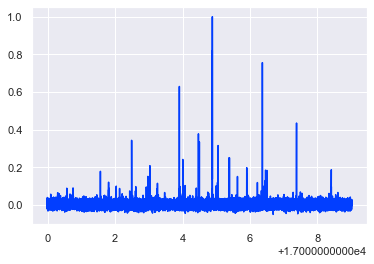

In [10]:
data_n = data/data.max()
plt.plot(freq,data_n)

In [11]:
g = MoleculeLevels.initialize_state('YbOH','174','X010',[1,2,3,4,5],M_values = 'pos',I=[0,0],S=1/2,round=8,P_values=[1/2,3/2])
e = MoleculeLevels.initialize_state('YbOH','174','A000',[1,2,3,4,5,6,7],M_values = 'pos',I=[0,0],S=1/2,round=8,P_values=[1/2,3/2])
g.eigensystem(0,1e-3)
e.eigensystem(0,1e-3)
gidx = g.select_q({'N':[1,2,3,4,5]})
eidx = e.select_q({'J':[0.5,1.5,2.5,3.5,4.5,5.5,6.5],'P':[1/2,-1/2]})

In [36]:
data_lines = get_json_data('20221027_X010_unnormalized_lines_errors',numpy=True)
extra = get_json_data('20221028_X010_R4_R5_unnorm_lines',numpy=True)
all_lines = np.concatenate((data_lines[0],extra[0]))
all_errors = np.concatenate((data_lines[1],extra[1]))
all_errors = np.sqrt(all_errors**2+0.0002**2)
data_lines = np.array([all_lines,all_errors])
idx = all_lines.searchsorted(17004.007648)
data_lines[1][idx] = 0.0005
print(data_lines.shape)

(2, 38)


In [37]:
# all_data = np.append(data_lines,[[0.002061,0.001491],[6.6e-5,1e-4]],axis=1)
all_data = np.append(data_lines,[[0.002061],[6.6e-5]],axis=1)

Text(0.5, 1.0, 'Prior stdev = 0.006974128470122221')

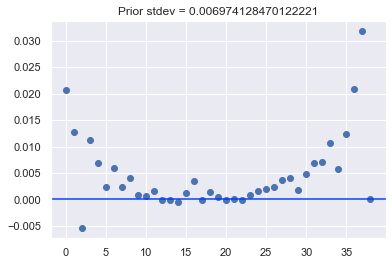

In [49]:
# dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=0.32,min=-10,max=10,vary=False)
params.add('d_kappa', value=-0.47,min=-10,max=10,vary=False)
params.add('d_B', value=0.82,min=-10,max=10,vary=False)
params.add('Temp', value=1.68,min=1,max=10,vary=False)
params.add('Be_X',value=7350+0*7328.708,min=7200,max=7500,vary=True)
params.add('Gamma_SR_X',value=-80+-90*0,min=-50,max=-150,vary=True)
params.add('Gamma_Prime_X',value=16*0,min=-100,max=100,vary=True)
params.add('q_lD_X',value=-12.05*0+10,min=-100,max=100,vary=True)
params.add('p_lD_X',value=-10.9*0,min=-100,max=100,vary=True)
params.add('T0_X',value=319.9090,min=319.8,max=320,vary=True)
update_params = ['Be_X','Gamma_SR_X','Gamma_Prime_X','q_lD_X','p_lD_X']
initial_resid = freefield_line_residual_update_params_wN1(params,all_data[0],update_params,no_uncert=True,data_error=all_data[1])
plt.figure()
plt.plot(initial_resid, 'bo')
plt.axhline(y=0)
plt.title('Prior stdev = '+ str(initial_resid.std()))

Name              Value      Min      Max   Stderr     Vary     Expr Brute_Step
Be_X               7329     7200     7500     None     True     None     None
Gamma_Prime_X     9.324     -100      100     None     True     None     None
Gamma_SR_X       -87.41     -150      -50     None     True     None     None
T0_X              319.9    319.8      320     None     True     None     None
Temp               1.68        1       10     None    False     None     None
d_B                0.82      -10       10     None    False     None     None
d_kappa           -0.47      -10       10     None    False     None     None
d_mu               0.32      -10       10     None    False     None     None
p_lD_X           -11.33     -100      100     None     True     None     None
q_lD_X           -12.11     -100      100     None     True     None     None


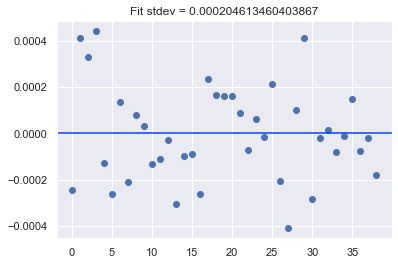

2790.5589010715485 sec


In [50]:
t1 = time.time()
out = minimize(freefield_line_residual_update_params_wN1, params, args=([all_data[0],update_params]),kws={'data_error':all_data[1]},method='nelder')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out.params.pretty_print()
final_resid = freefield_line_residual_update_params_wN1(out.params,all_data[0],update_params,no_uncert=True,data_error=all_data[1])
plt.figure()
plt.plot(final_resid, 'bo')
plt.axhline(y=0)
plt.title('Fit stdev = '+ str(final_resid.std()))
plt.show()
print(t2-t1,'sec')

out_nelder_wgp = out

In [51]:
out_nelder_wgp = out
out

Name              Value      Min      Max   Stderr     Vary     Expr Brute_Step
Be_X               7329     7200     7500   0.1388     True     None     None
Gamma_Prime_X      14.7     -100      100      2.7     True     None     None
Gamma_SR_X       -88.29     -150      -50   0.8716     True     None     None
T0_X              319.9    319.8      320 6.196e-05     True     None     None
Temp               1.68        1       10        0    False     None     None
d_B                0.82      -10       10        0    False     None     None
d_kappa           -0.47      -10       10        0    False     None     None
d_mu               0.32      -10       10        0    False     None     None
p_lD_X           -11.01     -100      100    1.227     True     None     None
q_lD_X           -12.09     -100      100   0.1641     True     None     None


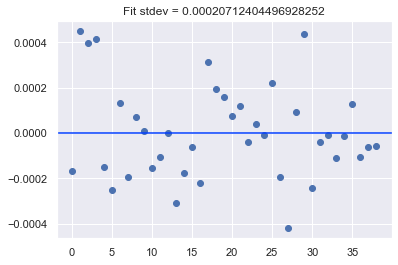

188.2547571659088 sec


In [52]:
t1 = time.time()
# out = minimize(freefield_line_residual_update_params_wN1, params, args=([all_data[0],update_params]),kws={'data_error':all_data[1]},method='least_squares')#,kws={'flist':True})#,method='least_squares')
out = minimize(freefield_line_residual_update_params_wN1, out_nelder_wgp.params, args=([all_data[0],update_params]),kws={'data_error':all_data[1]},method='least_squares')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out.params.pretty_print()
final_resid = freefield_line_residual_update_params_wN1(out.params,all_data[0],update_params,no_uncert=True,data_error=all_data[1])
plt.figure()
plt.plot(final_resid, 'bo')
plt.axhline(y=0)
plt.title('Fit stdev = '+ str(final_resid.std()))
plt.show()
print(t2-t1,'sec')

In [53]:
out_least_wgp = out
out

Name              Value      Min      Max   Stderr     Vary     Expr Brute_Step
Be_X               7329     7200     7500   0.1338     True     None     None
Gamma_Prime_X     14.37     -100      100    3.133     True     None     None
Gamma_SR_X       -88.19     -150      -50   0.7304     True     None     None
T0_X              319.9    319.8      320 5.79e-05     True     None     None
Temp               1.68        1       10        0    False     None     None
d_B                0.82      -10       10        0    False     None     None
d_kappa           -0.47      -10       10        0    False     None     None
d_mu               0.32      -10       10        0    False     None     None
p_lD_X           -11.12     -100      100    1.433     True     None     None
q_lD_X           -12.09     -100      100   0.1619     True     None     None


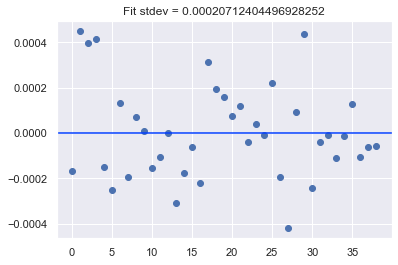

333.78783988952637 sec


In [54]:
t1 = time.time()
# out2 = minimize(freefield_line_residual_update_params_wN1, params, args=([all_data[0],update_params]),kws={'data_error':all_data[1]},method='leastsq')#,kws={'flist':True})#,method='least_squares')
out2 = minimize(freefield_line_residual_update_params_wN1, out_nelder_wgp.params, args=([all_data[0],update_params]),kws={'data_error':all_data[1]},method='leastsq')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out2.params.pretty_print()
final_resid2 = freefield_line_residual_update_params_wN1(out.params,all_data[0],update_params,no_uncert=True,data_error=all_data[1])
plt.figure()
plt.plot(final_resid2, 'bo')
plt.axhline(y=0)
plt.title('Fit stdev = '+ str(final_resid2.std()))
plt.show()
print(t2-t1,'sec')
out_lsq_wgp = out2

In [55]:
out2

In [68]:
e.parameters

{'Be': 7586.3,
 'ASO': 40471981.8,
 'a': 0,
 'bF': 0.06985,
 'c': 0.1799,
 'p+2q': -13133.0,
 'q': 0,
 'D': 0.006952,
 'p2q_D': 0.1139,
 'g_lp': -0.651,
 'muE': 0.21646716,
 'mu_B': 1.399624494,
 'g_S': 2.0023,
 'g_L': 1,
 '2_e0c': 75346062800.0}

In [1]:
g.parameters

NameError: name 'g' is not defined

In [34]:
print([out_least_wgp.params[k].value/(29979.2458) for k in ['Be_X','Gamma_SR_X','Gamma_Prime_X','q_lD_X','p_lD_X']])
print([out_least_wgp.params[k].stderr/(29979.2458) for k in ['Be_X','Gamma_SR_X','Gamma_Prime_X','q_lD_X','p_lD_X']])

[0.24445735076388028, -0.0029574152291417296, 0.0005535064525939074, -0.00040162189007706604, -0.0003690518849325081]
[4.575897272203749e-06, 2.6537702458853103e-05, 8.623273989789779e-05, 5.47170328247812e-06, 3.8994230598623414e-05]


In [38]:
print([out_lsq_wgp.params[k].value/(29979.2458) for k in ['Be_X','Gamma_SR_X','Gamma_Prime_X','q_lD_X','p_lD_X']])
print([out_lsq_wgp.params[k].stderr/(29979.2458) for k in ['Be_X','Gamma_SR_X','Gamma_Prime_X','q_lD_X','p_lD_X']])

[0.24445735098040783, -0.002957412975492293, 0.0005535200834739475, -0.0004016223736461449, -0.00036905810012498287]
[4.572035290642459e-06, 2.737029160557296e-05, 8.082740930617952e-05, 5.55863435768273e-06, 3.487714782977715e-05]


In [39]:
import lmfit
mini = lmfit.Minimizer(freefield_line_residual_update_params_wN1, params,fcn_args=[all_data[0],update_params],fcn_kws={'data_error':all_data[1]})

In [40]:
ci = lmfit.conf_interval(mini, out_least_wgp,p_names=['Gamma_Prime_X','p_lD_X'],sigmas=[1,2,3,5])
lmfit.printfuncs.report_ci(ci)

C:\ProgramData\Anaconda3\lib\site-packages\lmfit\confidence.py:330: UserWarning: rel_change=7.707771041519124e-07 < 1e-05 at iteration 8 and prob(Gamma_Prime_X=-4.08783404905356) = 0.999999950293642 < max(sigmas)
  warn(errmsg)
C:\ProgramData\Anaconda3\lib\site-packages\lmfit\confidence.py:330: UserWarning: rel_change=6.278153369973222e-06 < 1e-05 at iteration 6 and prob(Gamma_Prime_X=32.10486102663807) = 0.9999997305472057 < max(sigmas)
  warn(errmsg)
C:\ProgramData\Anaconda3\lib\site-packages\lmfit\confidence.py:330: UserWarning: rel_change=1.0094376530055071e-06 < 1e-05 at iteration 7 and prob(p_lD_X=-19.24702053863107) = 0.9999999539321155 < max(sigmas)
  warn(errmsg)
C:\ProgramData\Anaconda3\lib\site-packages\lmfit\confidence.py:330: UserWarning: rel_change=9.869782986477088e-07 < 1e-05 at iteration 7 and prob(p_lD_X=-2.8807738040588884) = 0.9999999406039923 < max(sigmas)
  warn(errmsg)


                 100.00%    99.73%    95.45%    68.27%    _BEST_    68.27%    95.45%    99.73%   100.00%
 Gamma_Prime_X: -18.42480 -10.06570  -6.52251  -3.30760  16.59371  +2.30940  +4.93934  +7.76538 +14.96309
 p_lD_X       :  -7.22428  -3.98665  -2.58771  -1.40965 -11.06390  +1.08298  +2.28218  +3.76087  +7.24259


Text(0.5, 1.0, 'Prior stdev = 0.0007243546350824974')

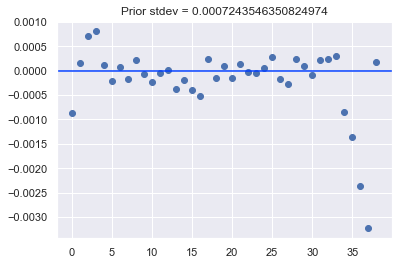

In [371]:
# dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=0.20,min=-10,max=10,vary=False)
params.add('d_kappa', value=0.4,min=-10,max=10,vary=False)
params.add('d_B', value=0.89,min=-10,max=10,vary=False)
params.add('Temp', value=2.0,min=1,max=10,vary=False)
params.add('Be_X',value=7327.708,min=7200,max=7500,vary=True)
params.add('Gamma_SR_X',value=-93.593,min=-50,max=-150,vary=True)
params.add('Gamma_Prime_X',value=0,min=-100,max=100,vary=False)
params.add('q_lD_X',value=14.7525,min=-100,max=100,vary=True)
params.add('p_lD_X',value=0,min=-100,max=100,vary=True)
params.add('T0_X',value=319.908907,min=319.8,max=320,vary=True)
update_params = ['Be_X','Gamma_SR_X','Gamma_Prime','q_lD_X','p_lD_X']
initial_resid_old = freefield_line_residual_update_params_wN1(params,all_data[0],update_params,no_uncert=True,data_error=all_data[1])
plt.figure()
plt.plot(initial_resid_old, 'bo')
plt.axhline(y=0)
plt.title('Prior stdev = '+ str(initial_resid_old.std()))

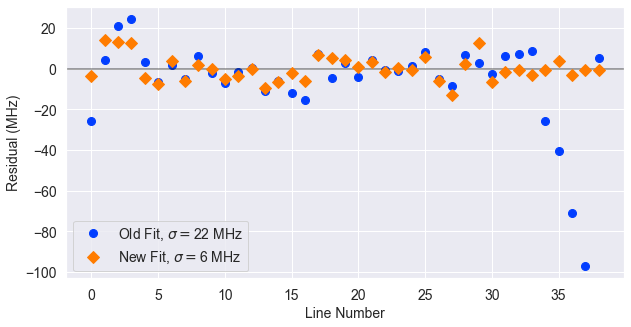

In [377]:
plt.figure(figsize=(10,5))
plt.plot(initial_resid_old*29979.2458,marker='o',color='C0',markersize=8,linestyle='None',label=r'Old Fit, $\sigma=$22 MHz')
plt.axhline(y=0,linestyle='-',color='k',alpha=0.5)
# plt.axhline(y=3,linestyle='--',color='k',alpha=0.25)
# plt.axhline(y=-3,linestyle='--',color='k',alpha=0.25)
plt.plot(final_resid2*29979.2458, marker='D',color='C1',markersize=8,linestyle='None',label=r'New Fit, $\sigma=$6 MHz')
plt.ylabel('Residual (MHz)',fontsize=14)
plt.xlabel('Line Number',fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(loc='lower left',fontsize=14);
# plt.ylim(-32,32)

Text(0.5, 1.0, 'Prior stdev = 0.0002745575314572421')

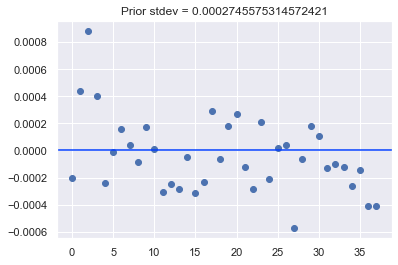

In [297]:
# dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=0.20,min=-10,max=10,vary=False)
params.add('d_kappa', value=0.4,min=-10,max=10,vary=False)
params.add('d_B', value=0.89,min=-10,max=10,vary=False)
params.add('Temp', value=2.0,min=1,max=10,vary=False)
params.add('Be_X',value=7328.708,min=7200,max=7500,vary=True)
params.add('Gamma_SR_X',value=-90,min=-50,max=-150,vary=True)
params.add('Gamma_Prime_X',value=0,min=-100,max=100,vary=False)
params.add('q_lD_X',value=12.525,min=-100,max=100,vary=True)
params.add('p_lD_X',value=12.15,min=-100,max=100,vary=True)
params.add('T0_X',value=319.908907,min=319.8,max=320,vary=True)
update_params = ['Be_X','Gamma_SR_X','q_lD_X','p_lD_X']
initial_resid = freefield_line_residual_update_params(params,data_lines[0],update_params,no_uncert=True,data_error=data_lines[1])
plt.figure()
plt.plot(initial_resid, 'bo')
plt.axhline(y=0)
plt.title('Prior stdev = '+ str(initial_resid.std()))

Name              Value      Min      Max   Stderr     Vary     Expr Brute_Step
Be_X               7329     7200     7500     None     True     None     None
Gamma_Prime_X         0     -100      100     None    False     None     None
Gamma_SR_X        -86.8     -150      -50     None     True     None     None
T0_X              319.9    319.8      320     None     True     None     None
Temp                  2        1       10     None    False     None     None
d_B                0.89      -10       10     None    False     None     None
d_kappa             0.4      -10       10     None    False     None     None
d_mu                0.2      -10       10     None    False     None     None
p_lD_X            11.96     -100      100     None     True     None     None
q_lD_X            12.16     -100      100     None     True     None     None


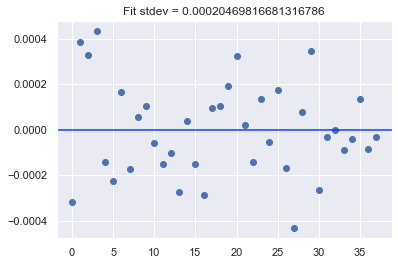

1239.3965435028076 sec


In [298]:
t1 = time.time()
out = minimize(freefield_line_residual_update_params, params, args=([data_lines[0],update_params]),kws={'data_error':np.sqrt(0.0002**2+data_lines[1]**2)},method='nelder')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out.params.pretty_print()
final_resid = freefield_line_residual_update_params(out.params,data_lines[0],update_params,no_uncert=True,data_error=np.sqrt(0.0002**2+data_lines[1]**2))
plt.figure()
plt.plot(final_resid, 'bo')
plt.axhline(y=0)
plt.title('Fit stdev = '+ str(final_resid.std()))
plt.show()
print(t2-t1,'sec')

out_nelder_nogp = out

In [299]:
out_nelder_nogp

Name              Value      Min      Max   Stderr     Vary     Expr Brute_Step
Be_X               7329     7200     7500   0.1176     True     None     None
Gamma_Prime_X         0     -100      100        0    False     None     None
Gamma_SR_X        -86.8     -150      -50   0.6755     True     None     None
T0_X              319.9    319.8      320 5.48e-05     True     None     None
Temp                  2        1       10        0    False     None     None
d_B                0.89      -10       10        0    False     None     None
d_kappa             0.4      -10       10        0    False     None     None
d_mu                0.2      -10       10        0    False     None     None
p_lD_X            11.96     -100      100    1.245     True     None     None
q_lD_X            12.16     -100      100   0.1471     True     None     None


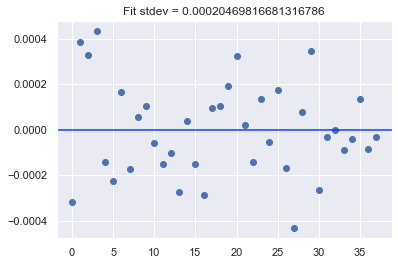

67.46977686882019 sec


In [300]:
t1 = time.time()
out = minimize(freefield_line_residual_update_params, out_nelder_nogp.params, args=([data_lines[0],update_params]),kws={'data_error':np.sqrt(0.0002**2+data_lines[1]**2)},method='least_squares')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out.params.pretty_print()
final_resid = freefield_line_residual_update_params(out.params,data_lines[0],update_params,no_uncert=True,data_error=np.sqrt(0.0002**2+data_lines[1]**2))
plt.figure()
plt.plot(final_resid, 'bo')
plt.axhline(y=0)
plt.title('Fit stdev = '+ str(final_resid.std()))
plt.show()
print(t2-t1,'sec')

In [301]:
out_least_nogp = out
out_least_nogp

Name              Value      Min      Max   Stderr     Vary     Expr Brute_Step
Be_X               7329     7200     7500    0.117     True     None     None
Gamma_Prime_X         0     -100      100        0    False     None     None
Gamma_SR_X        -86.8     -150      -50   0.6485     True     None     None
T0_X              319.9    319.8      320 5.419e-05     True     None     None
Temp                  2        1       10        0    False     None     None
d_B                0.89      -10       10        0    False     None     None
d_kappa             0.4      -10       10        0    False     None     None
d_mu                0.2      -10       10        0    False     None     None
p_lD_X            11.96     -100      100    1.276     True     None     None
q_lD_X            12.16     -100      100   0.1478     True     None     None


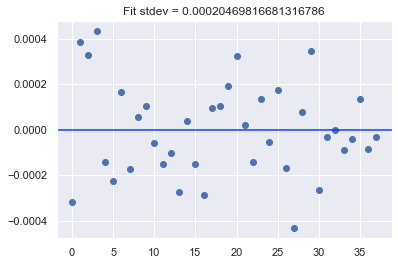

109.78607559204102 sec


In [302]:
t1 = time.time()
out2 = minimize(freefield_line_residual_update_params, out_nelder_nogp.params, args=([data_lines[0],update_params]),kws={'data_error':np.sqrt(0.0002**2+data_lines[1]**2)},method='leastsq')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out2.params.pretty_print()
final_resid2 = freefield_line_residual_update_params(out2.params,data_lines[0],update_params,no_uncert=True,data_error=np.sqrt(0.0002**2+data_lines[1]**2))
plt.figure()
plt.plot(final_resid, 'bo')
plt.axhline(y=0)
plt.title('Fit stdev = '+ str(final_resid.std()))
plt.show()
print(t2-t1,'sec')

Name              Value      Min      Max   Stderr     Vary     Expr Brute_Step
Be_X               7329     7200     7500   0.1173     True     None     None
Gamma_Prime_X         0     -100      100        0    False     None     None
Gamma_SR_X       -87.37     -150      -50   0.6806     True     None     None
T0_X              319.9    319.8      320 5.433e-05     True     None     None
Temp                  2        1       10        0    False     None     None
d_B                0.89      -10       10        0    False     None     None
d_kappa             0.4      -10       10        0    False     None     None
d_mu                0.2      -10       10        0    False     None     None
p_lD_X            12.06     -100      100    1.059     True     None     None
q_lD_X            12.16     -100      100   0.1468     True     None     None


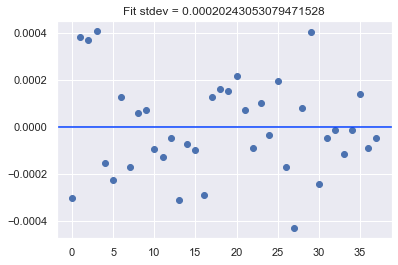

182.8599944114685 sec


In [264]:
t1 = time.time()
out = minimize(freefield_line_residual_update_params, params, args=([data_lines[0],update_params]),kws={'data_error':np.sqrt(0.0002**2+data_lines[1]**2)},method='least_squares')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out.params.pretty_print()
final_resid = freefield_line_residual_update_params(out.params,data_lines[0],update_params,no_uncert=True,data_error=np.sqrt(0.0002**2+data_lines[1]**2))
plt.figure()
plt.plot(final_resid, 'bo')
plt.axhline(y=0)
plt.title('Fit stdev = '+ str(final_resid.std()))
plt.show()
print(t2-t1,'sec')

In [265]:
out_nogp = out
out

Text(0.5, 1.0, 'Prior stdev = 0.00022962425931951104')

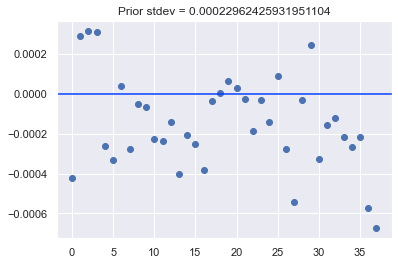

In [266]:
# dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=0.20,min=-10,max=10,vary=False)
params.add('d_kappa', value=0.4,min=-10,max=10,vary=False)
params.add('d_B', value=0.89,min=-10,max=10,vary=False)
params.add('Temp', value=2.0,min=1,max=10,vary=False)
params.add('Be_X',value=7328.4,min=7200,max=7500,vary=True)
params.add('Gamma_SR_X',value=-88.9,min=-50,max=-150,vary=True)
params.add('Gamma_Prime_X',value=10,min=-100,max=100,vary=True)
params.add('q_lD_X',value=12.5,min=-100,max=100,vary=True)
params.add('p_lD_X',value=9.8,min=-100,max=100,vary=True)
params.add('T0_X',value=319.908907,min=319.8,max=320,vary=True)
update_params = ['Be_X','Gamma_SR_X','Gamma_Prime_X','q_lD_X','p_lD_X']
initial_resid = freefield_line_residual_update_params(params,data_lines[0],update_params,no_uncert=True,data_error=data_lines[1])
plt.figure()
plt.plot(initial_resid, 'bo')
plt.axhline(y=0)
plt.title('Prior stdev = '+ str(initial_resid.std()))

Name              Value      Min      Max   Stderr     Vary     Expr Brute_Step
Be_X               7329     7200     7500   0.1298     True     None     None
Gamma_Prime_X     11.99     -100      100    3.531     True     None     None
Gamma_SR_X       -87.87     -150      -50   0.8003     True     None     None
T0_X              319.9    319.8      320 5.741e-05     True     None     None
Temp                  2        1       10        0    False     None     None
d_B                0.89      -10       10        0    False     None     None
d_kappa             0.4      -10       10        0    False     None     None
d_mu                0.2      -10       10        0    False     None     None
p_lD_X             11.7     -100      100    1.163     True     None     None
q_lD_X            12.17     -100      100   0.1568     True     None     None


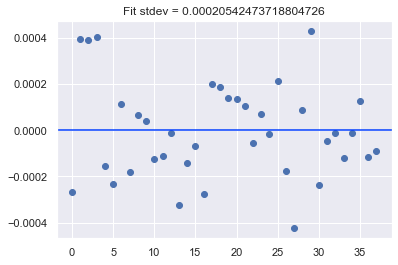

937.4216475486755 sec


In [267]:
t1 = time.time()
out = minimize(freefield_line_residual_update_params, params, args=([data_lines[0],update_params]),kws={'data_error':np.sqrt(0.0002**2+data_lines[1]**2)},method='least_squares')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out.params.pretty_print()
final_resid = freefield_line_residual_update_params(out.params,data_lines[0],update_params,no_uncert=True,data_error=np.sqrt(0.0002**2+data_lines[1]**2))
plt.figure()
plt.plot(final_resid, 'bo')
plt.axhline(y=0)
plt.title('Fit stdev = '+ str(final_resid.std()))
plt.show()
print(t2-t1,'sec')

In [268]:
out_wgp = out
out

Name              Value      Min      Max   Stderr     Vary     Expr Brute_Step
Be_X               7329     7200     7500     None     True     None     None
Gamma_Prime_X     7.787     -100      100     None     True     None     None
Gamma_SR_X       -87.43     -150      -50     None     True     None     None
T0_X              319.9    319.8      320     None     True     None     None
Temp                  2        1       10     None    False     None     None
d_B                0.89      -10       10     None    False     None     None
d_kappa             0.4      -10       10     None    False     None     None
d_mu                0.2      -10       10     None    False     None     None
p_lD_X            12.02     -100      100     None     True     None     None
q_lD_X            12.16     -100      100     None     True     None     None


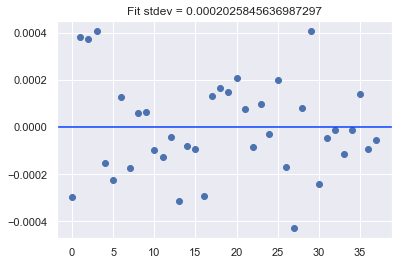

2216.7926168441772 sec


In [155]:
t1 = time.time()
out = minimize(freefield_line_residual_update_params, params, args=([data_lines[0],update_params]),kws={'data_error':np.sqrt(0.0002**2+data_lines[1]**2)},method='nelder')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out.params.pretty_print()
final_resid = freefield_line_residual_update_params(out.params,data_lines[0],update_params,no_uncert=True,data_error=np.sqrt(0.0002**2+data_lines[1]**2))
plt.figure()
plt.plot(final_resid, 'bo')
plt.axhline(y=0)
plt.title('Fit stdev = '+ str(final_resid.std()))
plt.show()
print(t2-t1,'sec')

In [156]:
out_nelder_wgp = out
out

Name              Value      Min      Max   Stderr     Vary     Expr Brute_Step
Be_X               7329     7200     7500   0.1192     True     None     None
Gamma_Prime_X     7.128     -100      100    2.966     True     None     None
Gamma_SR_X       -87.35     -150      -50   0.7829     True     None     None
T0_X              319.9    319.8      320 5.63e-05     True     None     None
Temp                  2        1       10        0    False     None     None
d_B                0.89      -10       10        0    False     None     None
d_kappa             0.4      -10       10        0    False     None     None
d_mu                0.2      -10       10        0    False     None     None
p_lD_X            11.96     -100      100    1.321     True     None     None
q_lD_X            12.16     -100      100    0.152     True     None     None


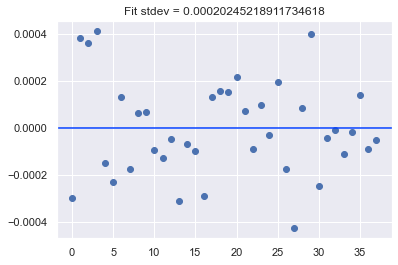

145.96370387077332 sec


In [157]:
t1 = time.time()
out = minimize(freefield_line_residual_update_params, out_nelder_wgp.params, args=([data_lines[0],update_params]),kws={'data_error':np.sqrt(0.0002**2+data_lines[1]**2)},method='least_squares')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out.params.pretty_print()
final_resid = freefield_line_residual_update_params(out.params,data_lines[0],update_params,no_uncert=True,data_error=np.sqrt(0.0002**2+data_lines[1]**2))
plt.figure()
plt.plot(final_resid, 'bo')
plt.axhline(y=0)
plt.title('Fit stdev = '+ str(final_resid.std()))
plt.show()
print(t2-t1,'sec')

In [158]:
out_lsq_wgp = out
out

Text(0.5, 1.0, 'Prior stdev = 0.00021312413889006666')

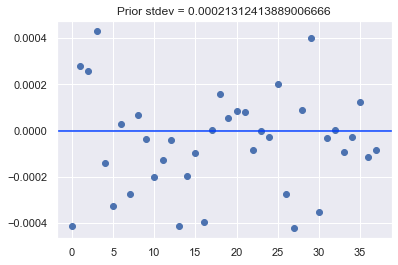

In [269]:
# dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=0.20,min=-10,max=10,vary=False)
params.add('d_kappa', value=0.4,min=-10,max=10,vary=False)
params.add('d_B', value=0.89,min=-10,max=10,vary=False)
params.add('Temp', value=2.0,min=1,max=10,vary=False)
params.add('Be_X',value=7328.5,min=7200,max=7500,vary=True)
params.add('Gamma_SR_X',value=-86.9,min=-50,max=-150,vary=True)
params.add('Gamma_Prime_X',value=0,min=-100,max=100,vary=False)
params.add('q_lD_X',value=12.2,min=-100,max=100,vary=True)
params.add('p_lD_X',value=11.8,min=-100,max=100,vary=True)
params.add('T0_X',value=319.9090,min=319.8,max=320,vary=True)
update_params = ['Be_X','Gamma_SR_X','Gamma_Prime','q_lD_X','p_lD_X']
initial_resid = freefield_line_residual_update_params(params,data_lines[0],update_params,no_uncert=True,data_error=data_lines[1])
plt.figure()
plt.plot(initial_resid, 'bo')
plt.axhline(y=0)
plt.title('Prior stdev = '+ str(initial_resid.std()))

Name              Value      Min      Max   Stderr     Vary     Expr Brute_Step
Be_X               7328     7200     7500     None     True     None     None
Gamma_Prime_X         0     -100      100     None    False     None     None
Gamma_SR_X       -87.69     -150      -50     None     True     None     None
T0_X              319.9    319.8      320     None     True     None     None
Temp                  2        1       10     None    False     None     None
d_B                0.89      -10       10     None    False     None     None
d_kappa             0.4      -10       10     None    False     None     None
d_mu                0.2      -10       10     None    False     None     None
p_lD_X            12.09     -100      100     None     True     None     None
q_lD_X             12.2     -100      100     None     True     None     None


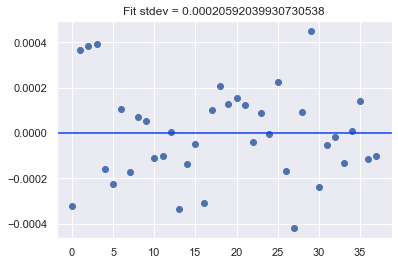

1603.9929728507996 sec


In [270]:
t1 = time.time()
out = minimize(freefield_line_residual_update_params, params, args=([data_lines[0],update_params]),kws={'data_error':np.sqrt(0.0002**2+data_lines[1]**2)},method='nelder')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out.params.pretty_print()
final_resid = freefield_line_residual_update_params(out.params,data_lines[0],update_params,no_uncert=True,data_error=np.sqrt(0.0002**2+data_lines[1]**2))
plt.figure()
plt.plot(final_resid, 'bo')
plt.axhline(y=0)
plt.title('Fit stdev = '+ str(final_resid.std()))
plt.show()
print(t2-t1,'sec')

In [271]:
out_nelder_nogp = out
out

Name              Value      Min      Max   Stderr     Vary     Expr Brute_Step
Be_X               7328     7200     7500 0.0008128     True     None     None
Gamma_Prime_X         0     -100      100        0    False     None     None
Gamma_SR_X       -87.69     -150      -50   0.7414     True     None     None
T0_X              319.9    319.8      320 3.739e-05     True     None     None
Temp                  2        1       10        0    False     None     None
d_B                0.89      -10       10        0    False     None     None
d_kappa             0.4      -10       10        0    False     None     None
d_mu                0.2      -10       10        0    False     None     None
p_lD_X            12.09     -100      100    1.015     True     None     None
q_lD_X             12.2     -100      100   0.1581     True     None     None


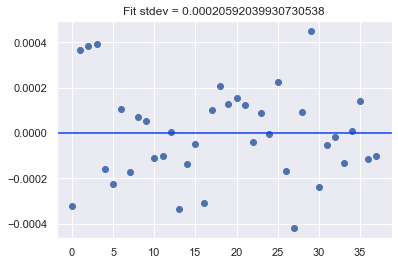

73.50400185585022 sec


In [272]:
t1 = time.time()
out = minimize(freefield_line_residual_update_params, out_nelder_nogp.params, args=([data_lines[0],update_params]),kws={'data_error':np.sqrt(0.0002**2+data_lines[1]**2)},method='least_squares')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out.params.pretty_print()
final_resid = freefield_line_residual_update_params(out.params,data_lines[0],update_params,no_uncert=True,data_error=np.sqrt(0.0002**2+data_lines[1]**2))
plt.figure()
plt.plot(final_resid, 'bo')
plt.axhline(y=0)
plt.title('Fit stdev = '+ str(final_resid.std()))
plt.show()
print(t2-t1,'sec')

In [273]:
out_lsq_nogp = out
out_lsq_nogp

In [274]:
params_nogp = params

Name              Value      Min      Max   Stderr     Vary     Expr Brute_Step
Be_X               7328     7200     7500   0.1203     True     None     None
Gamma_Prime_X         0     -100      100        0    False     None     None
Gamma_SR_X       -87.69     -150      -50   0.7038     True     None     None
T0_X              319.9    319.8      320 5.544e-05     True     None     None
Temp                  2        1       10        0    False     None     None
d_B                0.89      -10       10        0    False     None     None
d_kappa             0.4      -10       10        0    False     None     None
d_mu                0.2      -10       10        0    False     None     None
p_lD_X            12.09     -100      100    1.002     True     None     None
q_lD_X             12.2     -100      100   0.1499     True     None     None


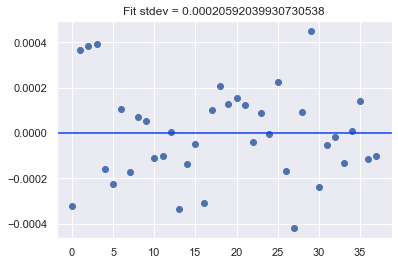

83.55266404151917 sec


In [275]:
t1 = time.time()
out2 = minimize(freefield_line_residual_update_params, out_nelder_nogp.params, args=([data_lines[0],update_params]),kws={'data_error':np.sqrt(0.0002**2+data_lines[1]**2)},method='leastsq')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out2.params.pretty_print()
final_resid2 = freefield_line_residual_update_params(out2.params,data_lines[0],update_params,no_uncert=True,data_error=np.sqrt(0.0002**2+data_lines[1]**2))
plt.figure()
plt.plot(final_resid, 'bo')
plt.axhline(y=0)
plt.title('Fit stdev = '+ str(final_resid.std()))
plt.show()
print(t2-t1,'sec')

In [276]:
out2

Text(0.5, 1.0, 'Prior stdev = 0.0007363019452607238')

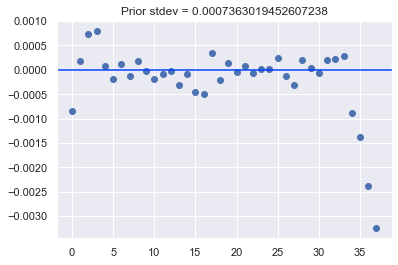

In [277]:
# dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=0.20,min=-10,max=10,vary=False)
params.add('d_kappa', value=0.4,min=-10,max=10,vary=False)
params.add('d_B', value=0.89,min=-10,max=10,vary=False)
params.add('Temp', value=2.0,min=1,max=10,vary=False)
params.add('Be_X',value=7327.708,min=7200,max=7500,vary=True)
params.add('Gamma_SR_X',value=-93.593,min=-50,max=-150,vary=True)
params.add('Gamma_Prime_X',value=0,min=-100,max=100,vary=False)
params.add('q_lD_X',value=14.7525,min=-100,max=100,vary=True)
params.add('p_lD_X',value=0,min=-100,max=100,vary=True)
params.add('T0_X',value=319.908907,min=319.8,max=320,vary=True)
update_params = ['Be_X','Gamma_SR_X','Gamma_Prime','q_lD_X','p_lD_X']
initial_resid = freefield_line_residual_update_params(params,data_lines[0],update_params,no_uncert=True,data_error=data_lines[1])
plt.figure()
plt.plot(initial_resid, 'bo')
plt.axhline(y=0)
plt.title('Prior stdev = '+ str(initial_resid.std()))

(-32.0, 32.0)

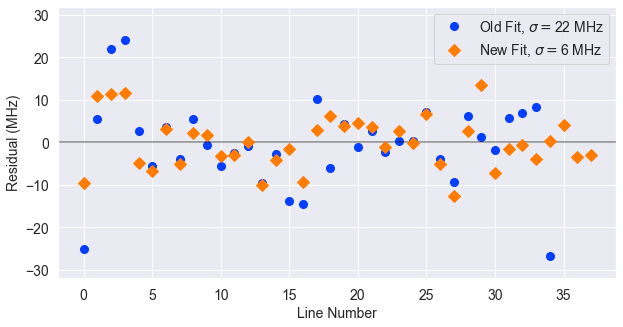

In [278]:
plt.figure(figsize=(10,5))
plt.plot(initial_resid*29979.2458,marker='o',color='C0',markersize=8,linestyle='None',label=r'Old Fit, $\sigma=$22 MHz')
plt.axhline(y=0,linestyle='-',color='k',alpha=0.5)
# plt.axhline(y=3,linestyle='--',color='k',alpha=0.25)
# plt.axhline(y=-3,linestyle='--',color='k',alpha=0.25)
plt.plot(final_resid2*29979.2458, marker='D',color='C1',markersize=8,linestyle='None',label=r'New Fit, $\sigma=$6 MHz')
plt.ylabel('Residual (MHz)',fontsize=14)
plt.xlabel('Line Number',fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(loc='upper right',fontsize=14);
plt.ylim(-32,32)

Text(0.5, 1.0, 'Prior stdev = 0.00020692822800668585')

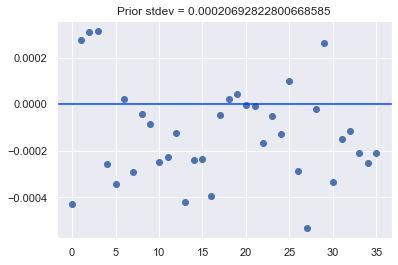

In [131]:
# dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=0.20,min=-10,max=10,vary=False)
params.add('d_kappa', value=0.4,min=-10,max=10,vary=False)
params.add('d_B', value=0.89,min=-10,max=10,vary=False)
params.add('Temp', value=2.0,min=1,max=10,vary=False)
params.add('Be_X',value=7328.4,min=7200,max=7500,vary=True)
params.add('Gamma_SR_X',value=-88.9,min=-50,max=-150,vary=True)
params.add('Gamma_Prime_X',value=12.2,min=-100,max=100,vary=True)
params.add('q_lD_X',value=12.5,min=-100,max=100,vary=True)
params.add('p_lD_X',value=9.8,min=-100,max=100,vary=True)
params.add('T0_X',value=319.908907,min=319.8,max=320,vary=True)
update_params = ['Be_X','Gamma_SR_X','Gamma_Prime_X','q_lD_X','p_lD_X']
initial_resid = freefield_line_residual_update_params(params,data_lines[0],update_params,no_uncert=True,data_error=data_lines[1])
plt.figure()
plt.plot(initial_resid, 'bo')
plt.axhline(y=0)
plt.title('Prior stdev = '+ str(initial_resid.std()))

Name              Value      Min      Max   Stderr     Vary     Expr Brute_Step
Be_X               7328     7200     7500     None     True     None     None
Gamma_Prime_X     7.192     -100      100     None     True     None     None
Gamma_SR_X       -88.23     -150      -50     None     True     None     None
T0_X              319.9    319.8      320     None     True     None     None
Temp                  2        1       10     None    False     None     None
d_B                0.89      -10       10     None    False     None     None
d_kappa             0.4      -10       10     None    False     None     None
d_mu                0.2      -10       10     None    False     None     None
p_lD_X            10.45     -100      100     None     True     None     None
q_lD_X            12.38     -100      100     None     True     None     None


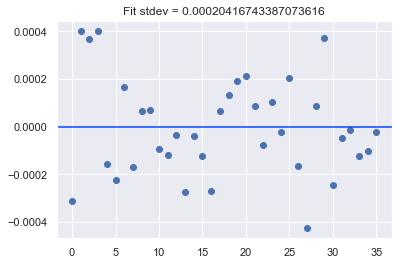

1805.1721155643463 sec


In [132]:
t1 = time.time()
out = minimize(freefield_line_residual_update_params, params, args=([data_lines[0],update_params]),kws={'data_error':np.sqrt(0.0002**2+data_lines[1]**2)},method='nelder')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out.params.pretty_print()
final_resid = freefield_line_residual_update_params(out.params,data_lines[0],update_params,no_uncert=True,data_error=np.sqrt(0.0002**2+data_lines[1]**2))
plt.figure()
plt.plot(final_resid, 'bo')
plt.axhline(y=0)
plt.title('Fit stdev = '+ str(final_resid.std()))
plt.show()
print(t2-t1,'sec')

In [133]:
out_nelder= out

Name              Value      Min      Max   Stderr     Vary     Expr Brute_Step
Be_X               7328     7200     7500   0.1599     True     None     None
Gamma_Prime_X     7.192     -100      100    1.844     True     None     None
Gamma_SR_X       -88.23     -150      -50    1.091     True     None     None
T0_X              319.9    319.8      320 5.663e-05     True     None     None
Temp                  2        1       10        0    False     None     None
d_B                0.89      -10       10        0    False     None     None
d_kappa             0.4      -10       10        0    False     None     None
d_mu                0.2      -10       10        0    False     None     None
p_lD_X            10.45     -100      100    1.879     True     None     None
q_lD_X            12.38     -100      100   0.2262     True     None     None


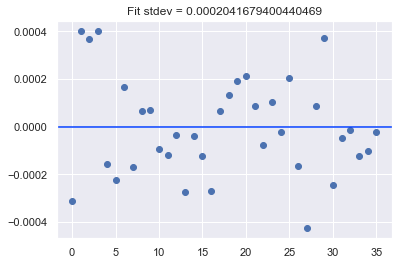

111.11064052581787 sec


In [134]:
t1 = time.time()
out = minimize(freefield_line_residual_update_params, out_nelder.params, args=([data_lines[0],update_params]),kws={'data_error':np.sqrt(0.0002**2+data_lines[1]**2)},method='least_squares')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out.params.pretty_print()
final_resid = freefield_line_residual_update_params(out.params,data_lines[0],update_params,no_uncert=True,data_error=np.sqrt(0.0002**2+data_lines[1]**2))
plt.figure()
plt.plot(final_resid, 'bo')
plt.axhline(y=0)
plt.title('Fit stdev = '+ str(final_resid.std()))
plt.show()
print(t2-t1,'sec')

In [135]:
out_lsq = out
out_lsq

Name              Value      Min      Max   Stderr     Vary     Expr Brute_Step
Be_X               7328     7200     7500   0.1713     True     None     None
Gamma_Prime_X     12.24     -100      100    3.383     True     None     None
Gamma_SR_X       -88.88     -150      -50    1.246     True     None     None
T0_X              319.9    319.8      320 5.851e-05     True     None     None
Temp                  2        1       10        0    False     None     None
d_B                0.89      -10       10        0    False     None     None
d_kappa             0.4      -10       10        0    False     None     None
d_mu                0.2      -10       10        0    False     None     None
p_lD_X            9.835     -100      100    1.795     True     None     None
q_lD_X            12.45     -100      100   0.2596     True     None     None


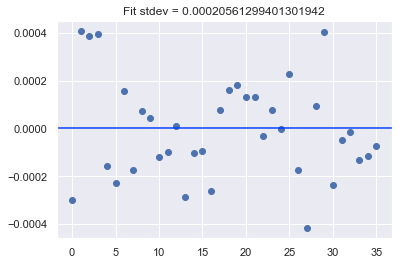

427.19883823394775 sec


In [122]:
t1 = time.time()
out = minimize(freefield_line_residual_update_params, params, args=([data_lines[0],update_params]),kws={'data_error':np.sqrt(0.0002**2+data_lines[1]**2)},method='least_squares')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out.params.pretty_print()
final_resid = freefield_line_residual_update_params(out.params,data_lines[0],update_params,no_uncert=True,data_error=np.sqrt(0.0002**2+data_lines[1]**2))
plt.figure()
plt.plot(final_resid, 'bo')
plt.axhline(y=0)
plt.title('Fit stdev = '+ str(final_resid.std()))
plt.show()
print(t2-t1,'sec')

In [123]:
out

In [127]:
mini = lmfit.Minimizer(freefield_line_residual_update_params, params,fcn_args=[data_lines[0],update_params],fcn_kws={'data_error':np.sqrt(0.0002**2+data_lines[1]**2)})

In [128]:
ci = lmfit.conf_interval(mini, out,p_names=['Gamma_SR_X', 'Gamma_Prime_X','p_lD_X'])
lmfit.printfuncs.report_ci(ci)

C:\Users\ajadbaba\Anaconda3\lib\site-packages\lmfit\confidence.py:330: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Gamma_SR_X=-87.63188378124443) = 0.0 < max(sigmas)
  warn(errmsg)
C:\Users\ajadbaba\Anaconda3\lib\site-packages\lmfit\confidence.py:330: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(Gamma_Prime_X=8.852742866244261) = 0.0 < max(sigmas)
  warn(errmsg)


                  99.73%    95.45%    68.27%    _BEST_    68.27%    95.45%    99.73%
 Gamma_SR_X   :  -3.69824  -2.22183  -0.89593 -88.87838      +inf      +inf      +inf
 Gamma_Prime_X:      -inf      -inf      -inf  12.23537  +3.32609  +9.41150 +18.08654
 p_lD_X       :  -5.80636  -3.48842  -1.75865   9.83475      +inf      +inf      +inf


C:\Users\ajadbaba\Anaconda3\lib\site-packages\lmfit\confidence.py:330: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(p_lD_X=11.62977622705215) = 0.0 < max(sigmas)
  warn(errmsg)


In [124]:
data_lines[1]

array([0.000155, 0.000018, 0.000043, 0.000122, 0.000108, 0.000038,
       0.000011, 0.000043, 0.000032, 0.000032, 0.000057, 0.000027,
       0.000053, 0.000023, 0.000009, 0.000091, 0.000027, 0.000015,
       0.000055, 0.000036, 0.000018, 0.000011, 0.000012, 0.000055,
       0.000044, 0.000013, 0.000043, 0.000055, 0.000031, 0.000008,
       0.00007 , 0.000078, 0.000014, 0.000062, 0.000015, 0.00002 ])

-0.001619622442376567
-48.55505930320344


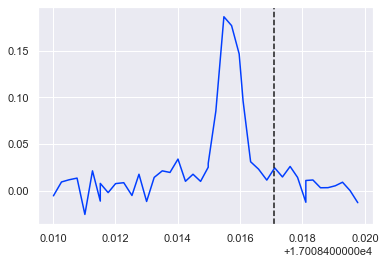

In [93]:
f1 = 17008.41
f2 = 17008.42
plt.plot(freq[np.searchsorted(freq,f1):np.searchsorted(freq,f2)],data_n[np.searchsorted(freq,f1):np.searchsorted(freq,f2)])
plt.axvline(17008.4171,linestyle='--',color='k')
maxval = freq[np.searchsorted(freq,f1):np.searchsorted(freq,f2)][np.argmax(data_n[np.searchsorted(freq,f1):np.searchsorted(freq,f2)])]
print(maxval - 17008.4171)
print((maxval - 17008.4171)*29979.2458)

[0.4157, 0.0002, 0.3]


Fit error =  [0.000022 0.000061 0.012359]
FIT PARAMS =  [0.415668 0.000756 0.203368]
Mean = 0.000756 +/- 6.1e-05, FWHM = 0.415668 +/- 2.2e-05
Position = 17008.415668


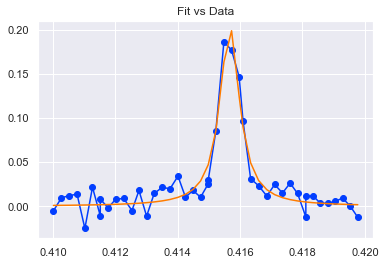

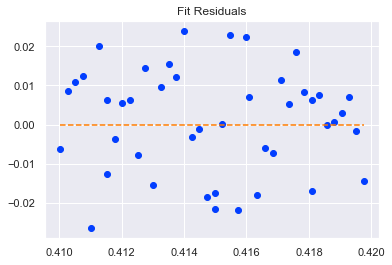

In [94]:
f1 = 17008.41
f2 = 17008.42
_freq = freq[np.searchsorted(freq,f1):np.searchsorted(freq,f2)]
_signal = data_n[np.searchsorted(freq,f1):np.searchsorted(freq,f2)]
p1,e1,r1 = fitLorentzian(_freq-17008,_signal,[0.4157,0.0002,0.30],verbose=True,plot=True)
print('Position =',p1[0]+17008)

In [106]:
(17008.415668-17008.41594)*29979.2458

-8.154354782480302

In [107]:
(17008.415668-17008.4171)*29979.2458

-42.93027990447743

-0.0011640614575298969
-34.89768456159504
-27.580906202694734


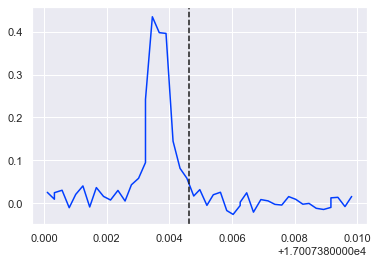

In [95]:
f1 = 17007.38
f2 = 17007.39
plt.plot(freq[np.searchsorted(freq,f1):np.searchsorted(freq,f2)],data_n[np.searchsorted(freq,f1):np.searchsorted(freq,f2)])
plt.axvline(17007.38462,linestyle='--',color='k')
maxval = freq[np.searchsorted(freq,f1):np.searchsorted(freq,f2)][np.argmax(data_n[np.searchsorted(freq,f1):np.searchsorted(freq,f2)])]
print(maxval-17007.38462)
print((maxval-17007.38462)*29979.2458)
print((17007.3837-17007.38462)*29979.2458)

[0.3837, 0.0002, 0.5]


Fit error =  [0.00002  0.000054 0.027704]
FIT PARAMS =  [0.383657 0.000682 0.470029]
Mean = 0.000682 +/- 5.4e-05, FWHM = 0.383657 +/- 2e-05
Position = 17007.383657


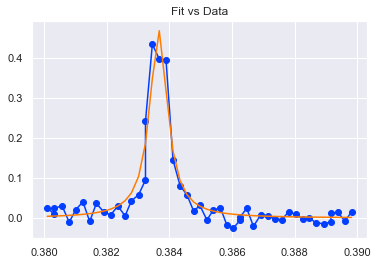

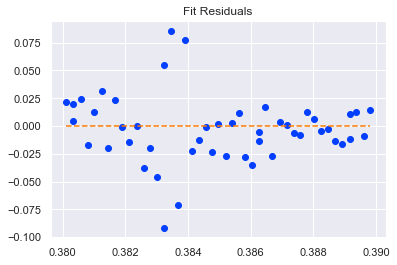

In [96]:
f1 = 17007.38
f2 = 17007.39
_freq = freq[np.searchsorted(freq,f1):np.searchsorted(freq,f2)]
_signal = data_n[np.searchsorted(freq,f1):np.searchsorted(freq,f2)]
p2,e2,r2 = fitLorentzian(_freq-17007,_signal,[0.3837,0.0002,0.50],verbose=True,plot=True)
print('Position =',p2[0]+17007)

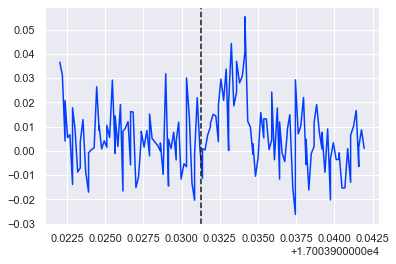

In [97]:
f1 = 17003.922
f2 = 17003.942
plt.plot(freq[np.searchsorted(freq,f1):np.searchsorted(freq,f2)],data_n[np.searchsorted(freq,f1):np.searchsorted(freq,f2)])
plt.axvline(17003.93127,linestyle='--',color='k')

[0.933, 0.0002, 0.05]


Fit error =  [0.000154 0.000438 0.005346]
FIT PARAMS =  [0.933615 0.001889 0.032623]
Mean = 0.001889 +/- 0.000438, FWHM = 0.933615 +/- 0.000154
Position = 17003.933615


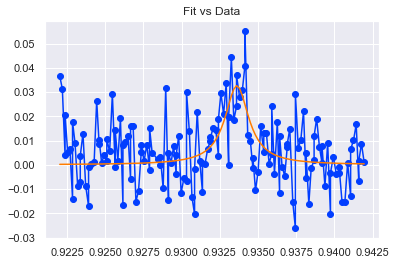

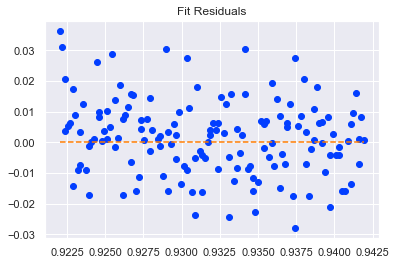

In [99]:
f1 = 17003.922
f2 = 17003.942
_freq = freq[np.searchsorted(freq,f1):np.searchsorted(freq,f2)]
_signal = data_n[np.searchsorted(freq,f1):np.searchsorted(freq,f2)]
p3,e3,r3 = fitLorentzian(_freq-17003,_signal,[0.933,0.0002,0.05],verbose=True,plot=True)
print('Position =',p3[0]+17003)

In [22]:
paper_lines = [{'freq': 17001.561393285378,

  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': -1},

  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': 1}},


 {'freq': 17002.207592865925,

  'ground state': {'N': 4, 'J': 4.5, 'P': 1.5, 'Parity': -1},

  'excited state': {'J': 3.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17002.43122616474,

  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': 1},

  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17002.48827449972,

  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': 1},

  'excited state': {'J': 0.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17002.601175906137,

  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': 1},

  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17002.611395286767,

  'ground state': {'N': 3, 'J': 3.5, 'P': 1.5, 'Parity': 1},

  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17002.923246359198,

  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': -1},

  'excited state': {'J': 0.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17003.024998894154,

  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': -1},

  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17003.031418436974,

  'ground state': {'N': 2, 'J': 2.5, 'P': 1.5, 'Parity': -1},

  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17003.46834462022,

  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': 1},

  'excited state': {'J': 0.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17003.905288565547,

  'ground state': {'N': 1, 'J': 0.5, 'P': 0.5, 'Parity': -1},

  'excited state': {'J': 0.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17003.92083413967,

  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': -1},

  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17003.903930532226,

  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': 1},

  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17003.906970538075,

  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': -1},

  'excited state': {'J': 0.5, 'P': 0.5, 'Parity': 1}},
               
#  {'freq': 17003.933615, #This line was added later by Arian upon re-analysis

#   'ground state': {'N': 3, 'J': 3.5, 'P': 1.5, 'Parity': -1},

#   'excited state': {'J': 2.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17004.007647939918,

  'ground state': {'N': 1, 'J': 0.5, 'P': 0.5, 'Parity': -1},

  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17004.009147437195,

  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': -1},

  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17004.07429330646,

  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': 1},

  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17004.882393796448,

  'ground state': {'N': 1, 'J': 0.5, 'P': 0.5, 'Parity': 1},

  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17004.884559882204,

  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': 1},

  'excited state': {'J': 1.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17005.054295704722,

  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': 1},

  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17005.38531467196,

  'ground state': {'N': 2, 'J': 1.5, 'P': 0.5, 'Parity': -1},

  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17005.391656423883,

  'ground state': {'N': 2, 'J': 2.5, 'P': 1.5, 'Parity': -1},

  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17005.62980122787,

  'ground state': {'N': 2, 'J': 2.5, 'P': 1.5, 'Parity': -1},

  'excited state': {'J': 3.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17005.90523733652,

  'ground state': {'N': 3, 'J': 2.5, 'P': 0.5, 'Parity': 1},

  'excited state': {'J': 3.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17005.91496237113,

  'ground state': {'N': 3, 'J': 3.5, 'P': 1.5, 'Parity': 1},

  'excited state': {'J': 3.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17006.221471788347,

  'ground state': {'N': 3, 'J': 3.5, 'P': 1.5, 'Parity': 1},

  'excited state': {'J': 4.5, 'P': 0.5, 'Parity': -1}},

 {'freq': 17006.36950333901,

  'ground state': {'N': 1, 'J': 1.5, 'P': 1.5, 'Parity': -1},

  'excited state': {'J': 2.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17006.442094771188,

  'ground state': {'N': 4, 'J': 3.5, 'P': 0.5, 'Parity': -1},

  'excited state': {'J': 4.5, 'P': 0.5, 'Parity': 1}},

 {'freq': 17006.829792391243,

  'ground state': {'N': 4, 'J': 4.5, 'P': 1.5, 'Parity': -1},

  'excited state': {'J': 5.5, 'P': 0.5, 'Parity': 1}},
               
 {'freq': 17007.383657, #Line added later by Arian upon re-analysis

  'ground state': {'N': 2, 'J': 2.5, 'P': 1.5, 'Parity': +1},

  'excited state': {'J': 3.5, 'P': 0.5, 'Parity': -1}},
               
 {'freq': 17008.415668, #Line added later by Arian upon re-analysis

  'ground state': {'N': 3, 'J': 3.5, 'P': 1.5, 'Parity': -1},

  'excited state': {'J': 4.5, 'P': 0.5, 'Parity': 1}}
              ]

In [23]:
data_lines = np.sort(np.array([line['freq'] for line in paper_lines]))

In [24]:
from lmfit import minimize, Parameters
import time

def freefield_intensity_residual(params, lines,freq_arr,data,heights_only=False,P_adjust=False,thresh = 7/29979.2458,no_uncert=False):
    c1 = params['d_mu']
    c2 = params['d_kappa']
    c3 = params['d_B']
    T = params['Temp']
    v = [c1,c2,c3]
    print(v)
    if heights_only:
        data_heights = np.array([data[np.searchsorted(freq_arr,line)] for line in lines])
        norm_heights = data_heights/data_heights.max()
        height_uncertainty = norm_heights*0.05
        model_lines,tdms = simulate_spectra([0,1e-3],g,e,gidx,eidx,diagonalize=False,freq_array =freq_arr,origin = 17998.5875-319.908907,P_adjust=P_adjust,pad=100,T=T,square=True,dipole='z',cm=True,coeffs=v,thresh=1e-4,g=16/(29979.2458),make_lorentzians=False,plot=False)
        model_unique,idx_unique = np.unique(model_lines,return_index=True)
        tdms = np.array(tdms)
        tdm_unique = tdms[idx_unique]
        idx_sort = np.argsort(model_unique)
        model_lines = model_unique[idx_sort]
        tdm_lines = tdm_unique[idx_sort]
        line_diffs = model_lines[1:] - model_lines[:-1]
        line_group = [model_lines[0]]
        tdm_group = [tdm_lines[0]]
        line_avgs = []
        tdm_sums = []
        for i,ld in enumerate(line_diffs):
            if ld<=thresh:
                line_group.append(model_lines[i+1])
                tdm_group.append(tdm_lines[i+1])
            else:
                line_avgs.append(sum(line_group)/len(line_group))
                tdm_sums.append(sum(tdm_group))
                line_group = [model_lines[i+1]]
                tdm_group = [tdm_lines[i+1]]
        line_avgs.append(sum(line_group)/len(line_group))
        tdm_sums.append(sum(tdm_group))
        model_avgs = np.array(line_avgs)
        model_tdms = np.array(tdm_sums)
        model_tdms/=model_tdms.max()
        if len(model_avgs)>len(lines):
            diff_array = np.subtract.outer(lines, model_avgs)
            model_avgs = np.array([model_avgs[np.argmin(abs(_diff))] for _diff in diff_array])
            model_tdms = np.array([model_tdms[np.argmin(abs(_diff))] for _diff in diff_array])
        elif len(model_avgs)<len(lines):
            print('More lines fit ({}) than predicted ({}). Choosing nearest data lines'.format(len(lines),len(model_avgs)))
            diff_array = np.subtract.outer(model_avgs,lines)
            norm_heights = np.array([norm_heights[np.argmin(abs(_diff))] for _diff in diff_array])
            height_uncertainty = np.array([height_uncertainty[np.argmin(abs(_diff))] for _diff in diff_array])
        if no_uncert:
            height_uncertainty/=height_uncertainty
        total_diff=(norm_heights - model_tdms)/height_uncertainty
    else:
        data_norm = data/data.max()
        model_lines,[freq_out,tot_lor],tdms = simulate_spectra([0,1e-3],g,e,gidx,eidx,diagonalize=False,freq_array =freq_arr,origin = 17998.5875-319.908907,P_adjust=P_adjust,pad=100,T=T,square=True,dipole='z',cm=True,coeffs=v,thresh=1e-4,make_lorentzians=True,g=16/(29979.2458),plot=False)
        tot_lor_norm = tot_lor/tot_lor.max()
        total_diff = data_norm - tot_lor_norm
    return total_diff

def freefield_line_residual_update_params(params, data_lines,update_params,thresh = 6/29979.2458,no_uncert=False):
        c1 = params['d_mu']
        c2 = params['d_kappa']
        c3 = params['d_B']
        T = params['Temp']
        v = [c1,c2,c3]
        X_origin = params['T0_X']
        total_diff = []
#         print(D)
#         print(glp)
#         print(gS)
        X_update = {}
        A_update = {}
        for p_str in update_params:
            if '_A' in p_str:
                p_name = p_str[:-2]
                A_update[p_name] = params[p_str].value
            elif '_X' in p_str:
                p_name = p_str[:-2]
                X_update[p_name] = params[p_str].value
        if X_update != {}:
            g.update_params(X_update)
        if A_update != {}:
            e.update_params(A_update)
        E,B = [0,1e-3]
        data_uncertainty = np.zeros(len(data_lines))+0.0003
        model_lines,tdms = simulate_spectra([E,B],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = 17998.5875-X_origin,P_adjust=False,pad=100,T=T,square=True,dipole='z',cm=True,coeffs=v,thresh=1e-4,g=16/(29979.2458),make_lorentzians=False,plot=False)
        model_lines=np.sort(model_lines)
        line_diffs = model_lines[1:] - model_lines[:-1]
        line_group = [model_lines[0]]
        line_avgs = []
        for i,ld in enumerate(line_diffs):
            if ld<=thresh and model_lines[i+1] - line_group[0] < thresh*1.5:
                line_group.append(model_lines[i+1])
            else:
                line_avgs.append(sum(line_group)/len(line_group))
                line_group = [model_lines[i+1]]
        line_avgs.append(sum(line_group)/len(line_group))
        model_avgs = np.array(line_avgs)
        if len(model_avgs)>len(data_lines):
            diff_array = np.subtract.outer(data_lines, model_avgs)
            model_avgs = np.array([model_avgs[np.argmin(abs(_diff))] for _diff in diff_array])
        elif len(model_avgs)<len(data_lines):
            print('More lines fit ({}) than predicted ({}). Choosing nearest data lines'.format(len(data_lines),len(model_avgs)))
            diff_array = np.subtract.outer(model_avgs,data_lines)
            data_lines = np.array([data_lines[np.argmin(abs(_diff))] for _diff in diff_array])
            data_uncertainty = np.array([data_uncertainty[np.argmin(abs(_diff))] for _diff in diff_array])
        if no_uncert:
            data_uncertainty/=data_uncertainty
        total_diff=(data_lines - model_avgs)/data_uncertainty
        return total_diff

In [25]:
g = MoleculeLevels.initialize_state('YbOH','174','X010',[1,2,3,4],M_values = 'pos',I=[0,0],S=1/2,round=8,P_values=[1/2,3/2])
e = MoleculeLevels.initialize_state('YbOH','174','A000',[1,2,3,4,5,6],M_values = 'pos',I=[0,0],S=1/2,round=8,P_values=[1/2,3/2])
g.eigensystem(0,1e-3)
e.eigensystem(0,1e-3)
gidx = g.select_q({'N':[1,2,3,4]})
eidx = e.select_q({'J':[0.5,1.5,2.5,3.5,4.5,5.5],'P':[1/2,-1/2]})

In [26]:
# x=simulate_spectra([0,1e-3],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = 17998.5875-319.908907,P_adjust=False,pad=100,T=2,square=True,dipole='z',cm=True,coeffs=[0.2,0.4,0.89],thresh=1e-3,g=16/(29979.2458),make_lorentzians=True,plot=True)

Name           Value      Min      Max   Stderr     Vary     Expr Brute_Step
Be_X            7329     7200     7500   0.2623     True     None     None
Gamma_SR_X    -87.21     -150      -50     1.04     True     None     None
T0_X           319.9    319.8      320 6.36e-05     True     None     None
Temp               2        1       10        0    False     None     None
d_B             0.89      -10       10        0    False     None     None
d_kappa          0.4      -10       10        0    False     None     None
d_mu             0.2      -10       10        0    False     None     None
p_lD_X          12.1     -100      100    1.636     True     None     None
q_lD_X         12.55     -100      100   0.3179     True     None     None


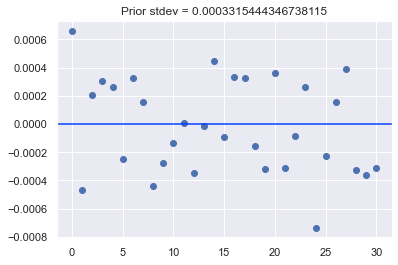

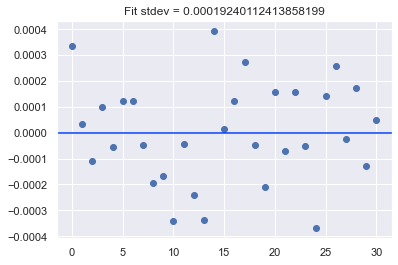

96.15433669090271 sec


In [31]:
# dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=0.20,min=-10,max=10,vary=False)
params.add('d_kappa', value=0.4,min=-10,max=10,vary=False)
params.add('d_B', value=0.89,min=-10,max=10,vary=False)
params.add('Temp', value=2.0,min=1,max=10,vary=False)
params.add('Be_X',value=7328.708,min=7200,max=7500,vary=True)
params.add('Gamma_SR_X',value=-93.593,min=-50,max=-150,vary=True)
# params.add('Gamma_Prime_X',value=0,min=-100,max=100,vary=False)
params.add('q_lD_X',value=12.525,min=-100,max=100,vary=True)
params.add('p_lD_X',value=12.15,min=-100,max=100,vary=True)
params.add('T0_X',value=319.908907,min=319.8,max=320,vary=True)
update_params = ['Be_X','Gamma_SR_X','q_lD_X','p_lD_X']
initial_resid = freefield_line_residual_update_params(params,data_lines,update_params,no_uncert=True)
plt.figure()
plt.plot(initial_resid, 'bo')
plt.axhline(y=0)
plt.title('Prior stdev = '+ str(initial_resid.std()))
t1 = time.time()
out = minimize(freefield_line_residual_update_params, params, args=([data_lines,update_params]),method='least_squares')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out.params.pretty_print()
final_resid = freefield_line_residual_update_params(out.params,data_lines,update_params,no_uncert=True)
plt.figure()
plt.plot(final_resid, 'bo')
plt.axhline(y=0)
plt.title('Fit stdev = '+ str(final_resid.std()))
plt.show()
print(t2-t1,'sec')

In [32]:
out

In [29]:
out

In [33]:
import lmfit

In [34]:
mini = lmfit.Minimizer(freefield_line_residual_update_params, params,fcn_args=[data_lines,update_params])

In [35]:
ci = lmfit.conf_interval(mini, out)
lmfit.printfuncs.report_ci(ci)

               99.73%    95.45%    68.27%    _BEST_    68.27%    95.45%    99.73%
 Be_X      :  -0.86618  -0.60775  -0.358307328.76239  +0.35833  +0.61223  +0.86613
 Gamma_SR_X:  -3.49015  -2.21207  -1.06158 -87.21236  +1.08111  +2.23296  +3.51475
 q_lD_X    :  -1.11269  -0.70829  -0.35051  12.55459  +0.32109  +0.68086  +1.07929
 p_lD_X    :  -6.12241  -3.86411  -1.84654  12.10270  +1.93784  +3.95171  +6.21456
 T0_X      :  -0.00025  -0.00025  -0.00025 319.90896  +0.00025  +0.00025  +0.00025


In [36]:
cx, cy, grid = lmfit.conf_interval2d(mini, out, 'Gamma_SR_X', 'p_lD_X', 30, 30)

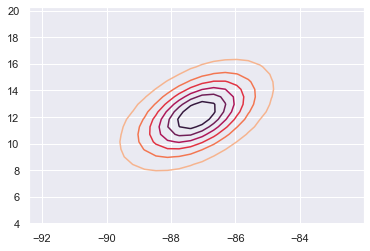

In [38]:
plt.contour(cx,cy,grid)

Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
Running Residuals Function
R

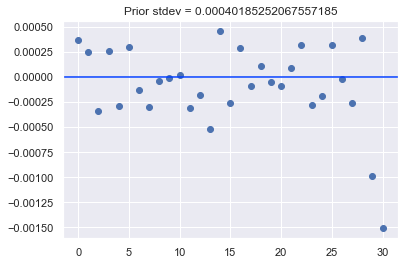

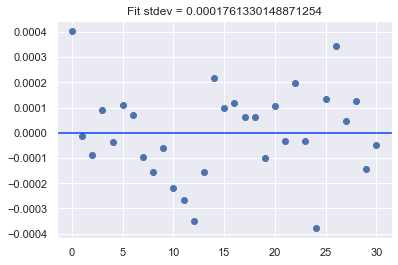

415.29778480529785 sec


In [41]:
# dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=0.20,min=-10,max=10,vary=False)
params.add('d_kappa', value=0.4,min=-10,max=10,vary=False)
params.add('d_B', value=0.89,min=-10,max=10,vary=False)
params.add('Temp', value=2.0,min=1,max=10,vary=False)
params.add('Be_X',value=7327.708,min=7200,max=7500,vary=True)
params.add('Gamma_SR_X',value=-93.593,min=-50,max=-150,vary=True)
params.add('Gamma_Prime_X',value=10,min=-100,max=100,vary=True)
params.add('q_lD_X',value=14.7525,min=-100,max=100,vary=True)
params.add('p_lD_X',value=-5.0,min=-100,max=100,vary=True)
params.add('T0_X',value=319.908907,min=319.8,max=320,vary=True)
update_params = ['Be_X','Gamma_SR_X','Gamma_Prime_X','q_lD_X','p_lD_X']
initial_resid = freefield_line_residual_update_params(params,data_lines,update_params,no_uncert=True)
plt.figure()
plt.plot(initial_resid, 'bo')
plt.axhline(y=0)
plt.title('Prior stdev = '+ str(initial_resid.std()))
t1 = time.time()
out2 = minimize(freefield_line_residual_update_params, params, args=([data_lines,update_params]),method='least_squares')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out2.params.pretty_print()
final_resid2 = freefield_line_residual_update_params(out2.params,data_lines,update_params,no_uncert=True)
plt.figure()
plt.plot(final_resid2, 'bo')
plt.axhline(y=0)
plt.title('Fit stdev = '+ str(final_resid2.std()))
plt.show()
print(t2-t1,'sec')

In [42]:
out2

In [25]:
out

[<Parameter 'd_mu', value=0.75, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.75, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.7500000149011612, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.75, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.75, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.7500000149011612, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.4336999265660201, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.5053375007511308, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.43369994146718127, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.5053375007511308, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.4336999265660201, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.505337515652292, bounds=[-10:10]>, <Parameter 

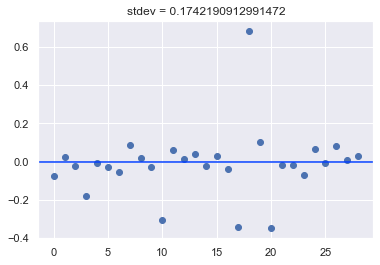

129.72292709350586


In [145]:
# dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=0.75,min=-10,max=10,vary=True)
params.add('d_kappa', value=0.75,min=-10,max=10,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=False)
params.add('Temp', value=2.0,min=1,max=10,vary=False)
params.add('d',value=2.14,min=0.1,max=10,vary=False)
params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
t1 = time.time()
out1 = minimize(freefield_intensity_residual, params, args=([data_lines,freq,data]),kws={'heights_only':True,'P_adjust':False},method='least_squares')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out1.params.pretty_print()
final_resid1 = freefield_intensity_residual(out1.params,data_lines,freq,data,heights_only=True,P_adjust=False,no_uncert=True)
plt.figure()
plt.plot(final_resid1, 'bo')
plt.axhline(y=0)
plt.title('stdev = '+ str(final_resid1.std()))
plt.show()
print(t2-t1)

[<Parameter 'd_mu', value=0.75, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.75, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.7500000149011612, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.75, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.75, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.7500000149011612, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.42147895408052644, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.48192267710507464, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.42147896898168763, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.48192267710507464, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.42147895408052644, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.48192269200623583, bounds=[-10:10]>, <Para

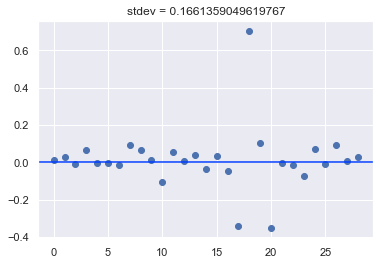

183.95054936408997


In [146]:
# dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=0.75,min=-10,max=10,vary=True)
params.add('d_kappa', value=0.75,min=-10,max=10,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=False)
params.add('Temp', value=2.0,min=1,max=10,vary=False)
params.add('d',value=2.14,min=0.1,max=10,vary=False)
params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
P_adjust=True
t1 = time.time()
out2 = minimize(freefield_intensity_residual, params, args=([data_lines,freq,data]),kws={'heights_only':True,'P_adjust':P_adjust},method='least_squares')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out2.params.pretty_print()
final_resid2 = freefield_intensity_residual(out2.params,data_lines,freq,data,heights_only=True,P_adjust=P_adjust,no_uncert=True)
plt.figure()
plt.plot(final_resid2, 'bo')
plt.axhline(y=0)
plt.title('stdev = '+ str(final_resid2.std()))
plt.show()
print(t2-t1)

[<Parameter 'd_mu', value=0.75, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.75, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.75, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.75, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.75, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.75, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.7500000111548673, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.75, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.75, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.7500000111548673, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.42371392094670846, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.4995674474501133, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter '

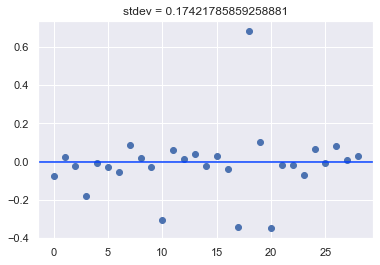

115.37712383270264


In [147]:
# dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=0.75,min=-10,max=10,vary=True)
params.add('d_kappa', value=0.75,min=-10,max=10,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=False)
params.add('Temp', value=2.0,min=1,max=10,vary=False)
params.add('d',value=2.14,min=0.1,max=10,vary=False)
params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
P_adjust=False
t1 = time.time()
out3 = minimize(freefield_intensity_residual, params, args=([data_lines,freq,data]),kws={'heights_only':True,'P_adjust':P_adjust})#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out3.params.pretty_print()
final_resid3 = freefield_intensity_residual(out3.params,data_lines,freq,data,heights_only=True,P_adjust=P_adjust,no_uncert=True)
plt.figure()
plt.plot(final_resid3, 'bo')
plt.axhline(y=0)
plt.title('stdev = '+ str(final_resid3.std()))
plt.show()
print(t2-t1)

[<Parameter 'd_mu', value=0.75, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.75, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.75, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.75, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=8.796236831264782, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.75, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=-9.996126921284764, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.75, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.75, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.75, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=-5.1667553605677305, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.75, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=4.

[<Parameter 'd_mu', value=0.24135255370458175, bounds=[-10:10]>, <Parameter 'd_kappa', value=1.9833316684955768, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.24135255370458175, bounds=[-10:10]>, <Parameter 'd_kappa', value=1.0465622922467936, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.24135255370458175, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.6858061999533618, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.24135255370458175, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.36669238620720357, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.24135255370458175, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.4802794187510777, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.24135255370458175, bounds=[-10:10]>, <Parameter 'd_

[<Parameter 'd_mu', value=0.24115264343777554, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.46316508032867887, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.2411526313455319, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.463165080185572, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
Name        Value      Min      Max   Stderr     Vary     Expr Brute_Step
Temp            2        1       10     None    False     None     None
d            2.14      0.1       10     None    False     None     None
d_B             1      -10       10     None    False     None     None
d_kappa    0.4632      -10       10     None     True     None     None
d_mu       0.2412      -10       10     None     True     None     None
mu              1      0.5        3     None    False     None     None
[<Parameter 'd_mu', value=0.2411526313455319, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.463165080185572, bounds=[-10:10]>

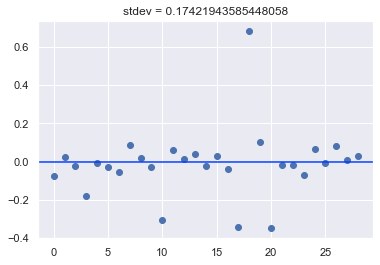

434.1929883956909


In [148]:
# dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=0.75,min=-10,max=10,vary=True)
params.add('d_kappa', value=0.75,min=-10,max=10,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=False)
params.add('Temp', value=2.0,min=1,max=10,vary=False)
params.add('d',value=2.14,min=0.1,max=10,vary=False)
params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
P_adjust=False
t1 = time.time()
out4 = minimize(freefield_intensity_residual, params, args=([data_lines,freq,data]),kws={'heights_only':True,'P_adjust':P_adjust},method='powell')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out4.params.pretty_print()
final_resid4 = freefield_intensity_residual(out4.params,data_lines,freq,data,heights_only=True,P_adjust=P_adjust,no_uncert=True)
plt.figure()
plt.plot(final_resid4, 'bo')
plt.axhline(y=0)
plt.title('stdev = '+ str(final_resid4.std()))
plt.show()
print(t2-t1)

[<Parameter 'd_mu', value=0.75, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.75, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.78742415754731, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.75, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.75, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.78742415754731, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.7125652757551642, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.78742415754731, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.6751205122280108, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.8061321090326441, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.6751205122280108, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.7687134325685676, bounds=[-10:10]>, <Parameter 'd_B',

[<Parameter 'd_mu', value=0.24133917788108405, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.46554802235678316, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.23611081440427384, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.4611757904756697, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.24303866368101978, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.46381566643315253, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.2442582249265861, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.46904023509723913, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.24115426612381263, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.4625026184392489, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.24285375268499365, bounds=[-10:10]>, <Parameter 'd

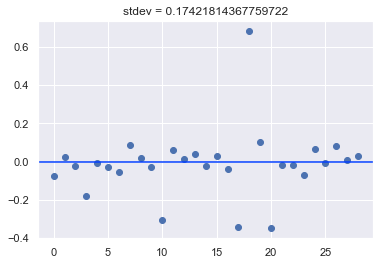

346.3873841762543


In [149]:
# dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=0.75,min=-10,max=10,vary=True)
params.add('d_kappa', value=0.75,min=-10,max=10,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=False)
params.add('Temp', value=2.0,min=1,max=10,vary=False)
params.add('d',value=2.14,min=0.1,max=10,vary=False)
params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
P_adjust=False
t1 = time.time()
out5 = minimize(freefield_intensity_residual, params, args=([data_lines,freq,data]),kws={'heights_only':True,'P_adjust':P_adjust},method='nelder')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out5.params.pretty_print()
final_resid5 = freefield_intensity_residual(out5.params,data_lines,freq,data,heights_only=True,P_adjust=P_adjust,no_uncert=True)
plt.figure()
plt.plot(final_resid5, 'bo')
plt.axhline(y=0)
plt.title('stdev = '+ str(final_resid5.std()))
plt.show()
print(t2-t1)

[<Parameter 'd_mu', value=0.75, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.75, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.7500000149011612, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.75, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.75, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.7500000149011612, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.623612847188999, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.6869061077150922, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.6236128620901602, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.6869061077150922, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.623612847188999, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.6869061226162534, bounds=[-10:10]>, <Parameter 'd

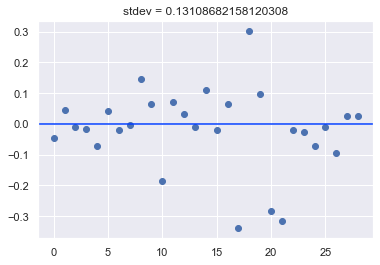

74.14485502243042


In [196]:
# dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=0.75,min=-10,max=10,vary=True)
params.add('d_kappa', value=0.75,min=-10,max=10,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=False)
params.add('Temp', value=2.0,min=1,max=10,vary=False)
params.add('d',value=2.14,min=0.1,max=10,vary=False)
params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
P_adjust=True
t1 = time.time()
out6 = minimize(freefield_intensity_residual, params, args=([data_lines,freq,data]),kws={'heights_only':False,'P_adjust':P_adjust},method='least_squares')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out6.params.pretty_print()
final_resid6 = freefield_intensity_residual(out6.params,data_lines,freq,data,heights_only=True,P_adjust=P_adjust,no_uncert=True)
plt.figure()
plt.plot(final_resid6, 'bo')
plt.axhline(y=0)
plt.title('stdev = '+ str(final_resid6.std()))
plt.show()
print(t2-t1)

[<Parameter 'd_mu', value=0.75, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.75, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.7500000149011612, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.75, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.75, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.7500000149011612, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.5408891151634111, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.640564819492927, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.5408891300645723, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.640564819492927, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.5408891151634111, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.6405648343940882, bounds=[-10:10]>, <Parameter 'd

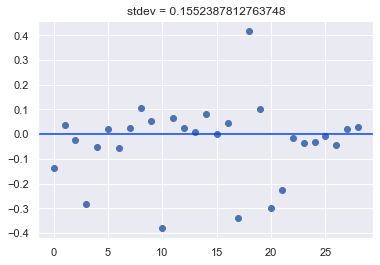

88.35486149787903


In [197]:
# dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=0.75,min=-10,max=10,vary=True)
params.add('d_kappa', value=0.75,min=-10,max=10,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=False)
params.add('Temp', value=2.0,min=1,max=10,vary=False)
params.add('d',value=2.14,min=0.1,max=10,vary=False)
params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
P_adjust=False
t1 = time.time()
out7 = minimize(freefield_intensity_residual, params, args=([data_lines,freq,data]),kws={'heights_only':False,'P_adjust':P_adjust},method='least_squares')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out7.params.pretty_print()
final_resid7 = freefield_intensity_residual(out7.params,data_lines,freq,data,heights_only=True,P_adjust=P_adjust,no_uncert=True)
plt.figure()
plt.plot(final_resid7, 'bo')
plt.axhline(y=0)
plt.title('stdev = '+ str(final_resid7.std()))
plt.show()
print(t2-t1)

[<Parameter 'd_mu', value=0.5, bounds=[0.0:2]>, <Parameter 'd_kappa', value=0.5, bounds=[0:2]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.5000000086602541, bounds=[0.0:2]>, <Parameter 'd_kappa', value=0.5, bounds=[0:2]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.5, bounds=[0.0:2]>, <Parameter 'd_kappa', value=0.5000000086602541, bounds=[0:2]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.0011318926618580916, bounds=[0.0:2]>, <Parameter 'd_kappa', value=0.5242559931765851, bounds=[0:2]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.001131893137516049, bounds=[0.0:2]>, <Parameter 'd_kappa', value=0.5242559931765851, bounds=[0:2]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.0011318926618580916, bounds=[0.0:2]>, <Parameter 'd_kappa', value=0.5242560019724231, bounds=[0:2]>, <Parameter 'd_B', value=1 (fixe

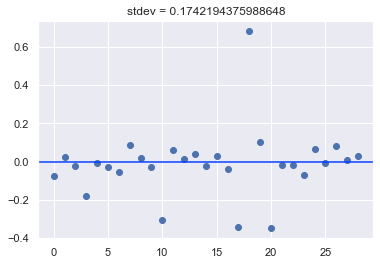

130.02569150924683


In [184]:
# dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=0.5,min=0.0,max=2,vary=True)
params.add('d_kappa', value=0.5,min=0,max=2,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=False)
params.add('Temp', value=2.0,min=1,max=10,vary=False)
params.add('d',value=2.14,min=0.1,max=10,vary=False)
params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
P_adjust=False
t1 = time.time()
out8 = minimize(freefield_intensity_residual, params, args=([data_lines,freq,data]),kws={'heights_only':True,'P_adjust':P_adjust},method='lbfgsb')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out8.params.pretty_print()
final_resid8 = freefield_intensity_residual(out8.params,data_lines,freq,data,heights_only=True,P_adjust=P_adjust,no_uncert=True)
plt.figure()
plt.plot(final_resid8, 'bo')
plt.axhline(y=0)
plt.title('stdev = '+ str(final_resid8.std()))
plt.show()
print(t2-t1)

[<Parameter 'd_mu', value=0.5, bounds=[0.0:2]>, <Parameter 'd_kappa', value=0.5, bounds=[0:2]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.5000000086602541, bounds=[0.0:2]>, <Parameter 'd_kappa', value=0.5, bounds=[0:2]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.5, bounds=[0.0:2]>, <Parameter 'd_kappa', value=0.5000000086602541, bounds=[0:2]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.29207367181689026, bounds=[0.0:2]>, <Parameter 'd_kappa', value=1.427032286464383, bounds=[0:2]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.2920736788797532, bounds=[0.0:2]>, <Parameter 'd_kappa', value=1.427032286464383, bounds=[0:2]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.29207367181689026, bounds=[0.0:2]>, <Parameter 'd_kappa', value=1.4270322955067467, bounds=[0:2]>, <Parameter 'd_B', value=1 (fixed), boun

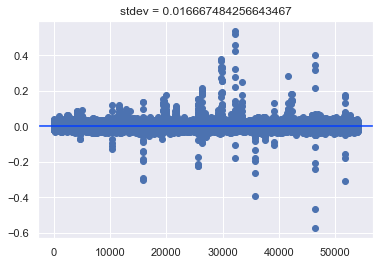

130.44880437850952


In [185]:
# dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=0.5,min=0.0,max=2,vary=True)
params.add('d_kappa', value=0.5,min=0,max=2,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=False)
params.add('Temp', value=2.0,min=1,max=10,vary=False)
params.add('d',value=2.14,min=0.1,max=10,vary=False)
params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
P_adjust=False
t1 = time.time()
out9 = minimize(freefield_intensity_residual, params, args=([data_lines,freq,data]),kws={'heights_only':False,'P_adjust':P_adjust},method='lbfgsb')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out8.params.pretty_print()
final_resid9 = freefield_intensity_residual(out9.params,data_lines,freq,data,heights_only=False,P_adjust=P_adjust,no_uncert=True)
plt.figure()
plt.plot(final_resid9, 'bo')
plt.axhline(y=0)
plt.title('stdev = '+ str(final_resid9.std()))
plt.show()
print(t2-t1)

In [195]:
out1

In [194]:
out2

In [193]:
out3

In [192]:
out4

In [191]:
out5

In [200]:
out6

In [201]:
out7

In [188]:
out8

In [142]:
# phi = 20/180*np.pi
# th = 32/180*np.pi
# v = np.array([np.cos(phi)*np.sin(th),np.sin(phi)*np.sin(th),np.cos(th)])
# print(v)
# v[-1]*=1/2.32
# res = out7
# v=np.array([res.params['d_mu'].value,res.params['d_kappa'].value,res.params['d_B'].value])
v=[-1.29,0.74,1]
v=np.array(v)
print(v/np.sqrt(v@v))
T=2
square= True
P_adjust=True
g3 = g.select_q({'N':[1,2,3,4]})
e3 = e.select_q({'J':[0.5,1.5,2.5,3.5,4.5,5.5],'P':[1/2,-1/2]})
lines,[freq_out,tot_lor],tdms = simulate_spectra([0,1e-3],g,e,g3,e3,freq_array = freq,origin = 17998.5875-319.908907,P_adjust=P_adjust,pad=1000,T=T,square=square,dipole='z',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),plot=False);

[-0.719817208  0.412918398  0.557997835]


Text(0.5, 1.0, '0.02182193101871588')

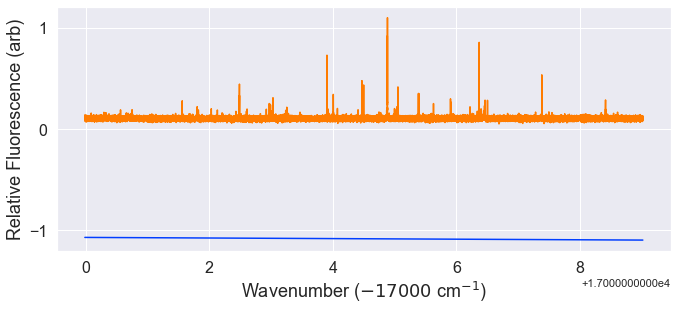

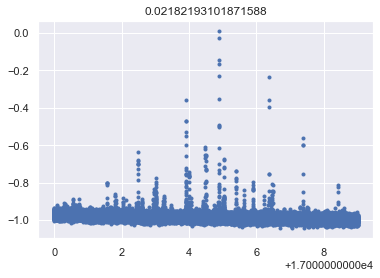

In [143]:

tot_lor_n = tot_lor/tot_lor.max()
plt.figure(figsize=(11,4.5))
plt.plot(freq,-tot_lor_n-0.1)
plt.plot(freq,data_n+0.1)
plt.ylabel('Relative Fluorescence (arb)',fontsize=18)
plt.xlabel(r'Wavenumber ($-17000$ cm$^{-1}$)',fontsize=18)
plt.annotate('Theory',(0.8,-1),fontsize=18)
plt.annotate('Experiment',(0.8,0.9),fontsize=18)
plt.xticks(fontsize=16);
plt.yticks([-1,0,1],fontsize=16);
plt.figure()
plt.plot(freq,(data_n - tot_lor_n),'b.')
plt.title((data_n - tot_lor_n).std())

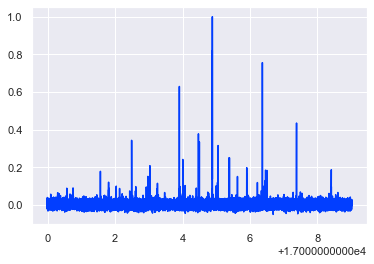

In [223]:
# #Arian data
# data = get_json_data('norm_fluor_X010_A000_smooth50',numpy=True)
# freq = get_json_data('i2cal_freq_X010_A000',numpy=True)

#Yuiki data
data = get_json_data('All_removeOverlap_3-7ms_fluor',numpy=True)[1:-4]
freq = get_json_data('All_removeOverlap_freq_i2_corrected',numpy=True)[1:-4]
data_n = data/data.max()
plt.plot(freq,data_n)

[<Parameter 'd_mu', value=0.5, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.5, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.5000000149011612, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.5, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.5, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.5000000149011612, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.5, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.5, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.3589093800256424, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.464832394267786, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.35890939492680357, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.464832394267786, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10

[<Parameter 'd_mu', value=0.23651976696389573, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.4477629419252388, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.23651976696389573, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.4477629270240776, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.23643563230749476, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.4477688385203214, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.23643564720865595, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.4477688385203214, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.23643563230749476, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.4477688534214826, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.23643563230749476, bounds=[-10:10]>, <Parameter 'd_k

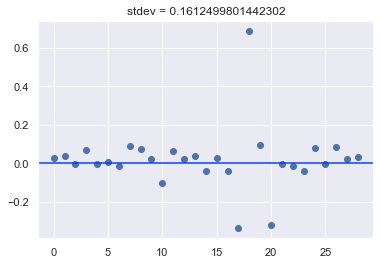

299.1950571537018


In [224]:
# dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=0.5,min=-10,max=10,vary=True)
params.add('d_kappa', value=0.5,min=-10,max=10,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=False)
params.add('Temp', value=2.0,min=1,max=10,vary=True)
params.add('d',value=2.14,min=0.1,max=10,vary=False)
params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
t1 = time.time()
out9 = minimize(freefield_intensity_residual, params, args=([data_lines,freq,data]),kws={'heights_only':True,'P_adjust':True},method='least_squares')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out9.params.pretty_print()
final_resid9 = freefield_intensity_residual(out9.params,data_lines,freq,data,heights_only=True,P_adjust=True,no_uncert=True)
plt.figure()
plt.plot(final_resid9, 'bo')
plt.axhline(y=0)
plt.title('stdev = '+ str(final_resid9.std()))
plt.show()
print(t2-t1)

In [225]:
out9

In [ ]:
sns.set_style('white')
start, stop = (17001,17008)
i,j=(np.searchsorted(tx1[0],start),np.searchsorted(tx1[0],stop))
k,l = (np.searchsorted(freq,start),np.searchsorted(freq,stop))
plt.figure(figsize=(11,4.5))
tx_n = tx1[1]/tx1[1].max()
plt.plot(tx1[0][i:j]-17000,-tx_n[i:j]-0.05)
data_n = data/data.max()
plt.plot(freq[k:l]-17000,data_n[k:l]+0.05)
plt.ylabel('Relative Fluorescence (arb)',fontsize=18)
plt.xlabel(r'Wavenumber ($-17000$ cm$^{-1}$)',fontsize=18)
plt.annotate('Theory',(0.8,-1),fontsize=18)
plt.annotate('Experiment',(0.8,0.9),fontsize=18)
plt.xticks(fontsize=16);
plt.yticks([-1,0,1],fontsize=16);
plt.title(r'$^{174}$YbOH $\tilde{X}\, ^2\!\Sigma(010)$ Free Field Spectrum',fontsize=24)
plt.tight_layout()
# plt.savefig('X010_freefield_theory_exp_v1.svg')

In [19]:
# phi = 20/180*np.pi
# th = 32/180*np.pi
# v = np.array([np.cos(phi)*np.sin(th),np.sin(phi)*np.sin(th),np.cos(th)])
# print(v)
# v[-1]*=1/2.32
sns.set_style('white')
# res = out9
# v=np.array([res.params['d_mu'].value,res.params['d_kappa'].value,res.params['d_B'].value])
v=[0.20,0.40,0.89]
v=np.array(v)
print(v/np.sqrt(v@v))
# T=res.params['Temp']
T=2
square= True
P_adjust=True
g3 = g.select_q({'N':[1,2,3,4]})
e3 = e.select_q({'J':[0.5,1.5,2.5,3.5,4.5,5.5],'P':[1/2,-1/2]})
lines,[freq_out,tot_lor],tdms = simulate_spectra([0,1e-3],g,e,g3,e3,freq_array = freq,origin = 17998.5875-319.908907,P_adjust=P_adjust,pad=1000,T=T,square=square,dipole='z',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),plot=False);

[0.200794712 0.401589424 0.893536467]


In [31]:
sns.axes_style()

{'axes.facecolor': 'white',
 'axes.edgecolor': '.15',
 'axes.grid': False,
 'axes.axisbelow': True,
 'axes.labelcolor': '.15',
 'figure.facecolor': 'white',
 'grid.color': '.8',
 'grid.linestyle': '-',
 'text.color': '.15',
 'xtick.color': '.15',
 'ytick.color': '.15',
 'xtick.direction': 'out',
 'ytick.direction': 'out',
 'lines.solid_capstyle': <CapStyle.round: 'round'>,
 'patch.edgecolor': 'w',
 'patch.force_edgecolor': True,
 'image.cmap': 'rocket',
 'font.family': ['sans-serif'],
 'font.sans-serif': ['Arial',
  'DejaVu Sans',
  'Liberation Sans',
  'Bitstream Vera Sans',
  'sans-serif'],
 'xtick.bottom': False,
 'xtick.top': False,
 'ytick.left': False,
 'ytick.right': False,
 'axes.spines.left': True,
 'axes.spines.bottom': True,
 'axes.spines.right': True,
 'axes.spines.top': True}

In [51]:
bins

array([0.         , 0.000146239, 0.000292477, 0.000438716, 0.000584954,
       0.000731193, 0.000877431, 0.00102367 , 0.001169908, 0.001316147,
       0.001462386])

(array([3509.,  250.,  224.,  225.,  416., 1743., 3512., 5982., 7115.,
        6308., 5347., 3986., 2999., 2709., 2352., 1996., 1746., 1521.,
        1050.,  514.]),
 array([ 0. ,  0.5,  1. ,  1.5,  2. ,  2.5,  3. ,  3.5,  4. ,  4.5,  5. ,
         5.5,  6. ,  6.5,  7. ,  7.5,  8. ,  8.5,  9. ,  9.5, 10. ]),
 <BarContainer object of 20 artists>)

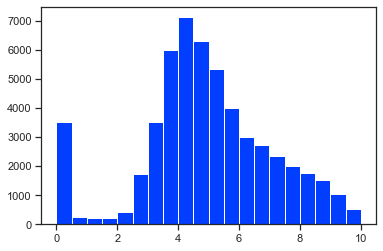

In [65]:
counts, bins = np.histogram(29979.2458*(freq[1:]-freq[:-1]),bins=20,range=(0,10))
plt.hist(bins[:-1], bins, weights=counts)

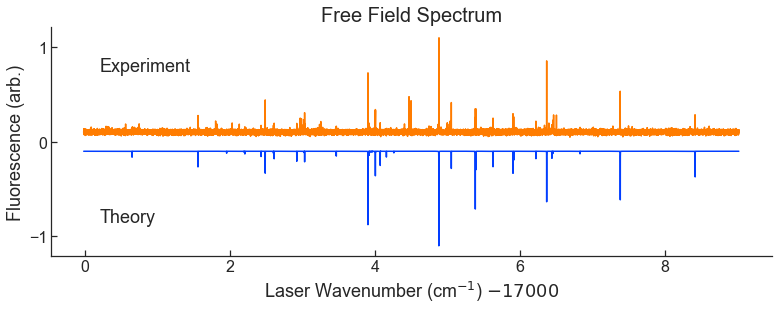

In [40]:
sns.set_style({'ytick.left':True,'xtick.bottom':True})
tot_lor_n = tot_lor/tot_lor.max()
plt.figure(figsize=(11,4.5))
plt.plot(freq-17000,-tot_lor_n-0.1)
plt.plot(freq-17000,data_n+0.1)
plt.ylabel('Fluorescence (arb.)',fontsize=18)
plt.xlabel(r'Laser Wavenumber (cm$^{-1}$) $-17000$',fontsize=18)
plt.annotate('Theory',(0.2,-0.85),fontsize=18)
plt.annotate('Experiment',(0.2,0.75),fontsize=18)
plt.xticks(fontsize=16);
plt.yticks([-1,0,1],fontsize=16);
plt.title(r'Free Field Spectrum',fontsize=20)
plt.tight_layout()
plt.tick_params(axis='both',direction='in')
sns.despine()
plt.savefig('X010_freefield_theory_exp_v4.svg',bbox_inches='tight')

In [337]:
from lmfit import minimize, Parameters
import time

g.eigensystem(0,1e-3)
e.eigensystem(0,1e-3)
gidx = g.select_q({'N':[1,2,3,4]})
eidx = e.select_q({'J':[0.5,1.5,2.5,3.5,4.5,5.5],'P':[1/2,-1/2]})

def residual(params, freq, data,flist = None,integrate=False):
    c1 = params['d_mu']
    c2 = params['d_kappa']
    c3 = params['d_B']
    T = params['Temp']
    v = [c1,c2,c3]
    P_adjust=False
    lines,[freq_out,tot_lor],tdms = simulate_spectra([0,1e-2],g,e,gidx,eidx,diagonalize=False,freq_array = freq,origin = 17998.5875-319.908907,P_adjust=P_adjust,pad=1000,T=T,square=square,dipole='z',cm=True,coeffs=v,thresh=1e-4,g=12/(29979.2458),plot=False);
    model_n = tot_lor/tot_lor.max()
#     model_n = tot_lor
    data_n = data/data.max()
    if flist is None:
        diff = (data_n - model_n)
    else:
        if type(flist)==bool:
            flist=lines
        flist_r = np.unique(np.round(flist,4))
        flist_r = flist_r[flist_r<freq.max()]
        diff_idx = np.array([np.arange(np.searchsorted(freq,f-0.0005),np.searchsorted(freq,f+0.0005)) for f in flist_r],dtype=object)
        n_idx = np.array([len(idx) for idx in diff_idx])
        if integrate:
            data_n_int = np.array([data_n[idx].sum()/npts for idx,npts in zip(diff_idx,n_idx)]).flatten()
            model_n_int = np.array([model_n[idx].sum()/npts for idx,npts in zip(diff_idx,n_idx)]).flatten()
            diff = data_n_int-model_n_int
        else:
            diff_idx = np.unique(diff_idx.flatten())
            diff = (data_n - model_n)[diff_idx]
    return diff


params = Parameters()
params.add('d_mu', value=0.5,min=-10,max=10,vary=True)
params.add('d_kappa', value=0.5,min=-10,max=10,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=False)1
params.add('Temp', value=2,min=1,max=10,vary=True)

c1 = params['d_mu']
c2 = params['d_kappa']
c3 = params['d_B']
T = params['Temp']
v = [c1,c2,c3]
P_adjust=False
lines,[freq_out,tot_lor],tdms = simulate_spectra([0,1e-2],g,e,gidx,eidx,diagonalize=False,freq_array = freq,origin = 17998.5875-319.908907,P_adjust=P_adjust,pad=1000,T=T,square=square,dipole='z',cm=True,coeffs=v,thresh=1e-4,g=12/(29979.2458),plot=False);
t1 = time.time()
out = minimize(residual, params, args=(freq, data),kws={'flist':lines,'integrate':True},method='bfgs')#,method='least_squares')
t2 = time.time()
print(t2-t1)

1510.793823003769


In [338]:
out

In [261]:
np.exp(-1.4*g.evals0/29979.2458/4)

array([0.918417642, 0.918417632, 0.918417622, 0.918417612, 0.918101338,
       0.918101328, 0.918101318, 0.918101308, 0.917664696, 0.917664686,
       0.917348648, 0.917348638, 0.652908838, 0.652908833, 0.652908829,
       0.652908825, 0.652908821, 0.652908816, 0.652234479, 0.652234474,
       0.65223447 , 0.652234466, 0.652234462, 0.652234457, 0.65142348 ,
       0.651423476, 0.651423472, 0.651423467, 0.650750655, 0.650750651,
       0.650750647, 0.650750642, 0.391212662, 0.391212661, 0.391212659,
       0.391212657, 0.391212655, 0.391212653, 0.391212652, 0.39121265 ,
       0.390404948, 0.390404946, 0.390404945, 0.390404943, 0.390404941,
       0.390404939, 0.390404937, 0.390404936, 0.389843243, 0.389843241,
       0.38984324 , 0.389843238, 0.389843236, 0.389843234, 0.389038356,
       0.389038354, 0.389038353, 0.389038351, 0.389038349, 0.389038347,
       0.197575463, 0.197575462, 0.197575461, 0.197575461, 0.19757546 ,
       0.197575459, 0.197575458, 0.197575458, 0.197575457, 0.197

In order to figure out Stark/Zeeman plotting, I need to be able to tread dE as a fit parameter

In [4]:
g = MoleculeLevels.initialize_state('YbOH','174','X010',[1,2],M_values = 'all',I=[0,0],S=1/2,round=8,P_values=[1/2,3/2])
e = MoleculeLevels.initialize_state('YbOH','174','A000',[1,2],M_values = 'all',I=[0,0],S=1/2,round=8,P_values=[1/2,3/2])
Bz = np.linspace(1e-3,70,1001)
Ez = np.linspace(0,300,1001)
g.ZeemanMap(Bz,0,idx=g.select_q({'N':1}))
e.ZeemanMap(Bz,0,idx=e.select_q({'J':1.5,'P':[1/2,-1/2]},parity='-'))
g.StarkMap(Ez,1e-4,idx=g.select_q({'N':1}))
e.StarkMap(Ez,1e-4,idx=e.select_q({'J':1.5,'P':[1/2,-1/2]},parity='-'))

In [5]:
g.eigensystem(0,1e-3)
e.eigensystem(0,1e-3)
gidx = g.select_q({'N':[1]})
eidx = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')

In [6]:
from lmfit import minimize, Parameters
import time

def line_residual(params, data_arr,uncertainty,thresh = 5/29979.2458):
        c1 = params['d_mu']
        c2 = params['d_kappa']
        c3 = params['d_B']
        T = params['Temp']
        v = [c1,c2,c3]
        E = 0
        B=1e-3
        offset = params['offset']
        lines,[freq_out,tot_lor],tdms = simulate_spectra([E,B],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = offset+17998.5875-319.908907,P_adjust=False,pad=100,T=T,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),plot=False);
    #     model_n = tot_lor/tot_lor.max()
        lines=np.sort(np.unique(lines))
        line_diffs = lines[1:] - lines[:-1]
        line_group = [lines[0]]
        line_avgs = []
        for i,ld in enumerate(line_diffs):
            if ld<=thresh:
                line_group.append(lines[i+1])
            else:
                line_avgs.append(sum(line_group)/len(line_group))
                line_group = [lines[i+1]]
        line_avgs.append(sum(line_group)/len(line_group))
        line_avgs = np.array(line_avgs)
        diff = (data_arr - line_avgs)/uncertainty
        return diff
    
def cal_residual(params,model,data,uncertainty):
    offset = params['offset']
    diff = (data+offset-model)/uncertainty
    return diff

In [7]:
All_StarkZeeman_Data = {
    '20220526': get_json_data('20220526_StarkZeeman_allinfo.json',numpy=False),
    '20220616': get_json_data('20220616_StarkZeeman_allinfo.json',numpy=False),
    '20220627': get_json_data('20220627_StarkZeeman_allinfo.json',numpy=False),
    '20220628': get_json_data('20220628_StarkZeeman_allinfo.json',numpy=False),
    '20220629_1': get_json_data('20220629_1_StarkZeeman_allinfo.json',numpy=False),
    '20220629_2': get_json_data('20220629_2_StarkZeeman_allinfo.json',numpy=False),
}

In [8]:
calibration_scans = {} #Holds calibration scans
for label,batch in All_StarkZeeman_Data.items():
    calibration_scans[label] = []
    for scan in batch:
        if scan['EB'][0] == 0 and scan['EB'][1] < 0.1:
            calibration_scans[label].append(scan) 

First, need to calibrate. We will use Yuiki's fit values with their uncertainties. Lines are N=1,J=0.5,1.5,+ up to J=1.5,-. 

In [9]:
calibration_values = np.array([[17004.88239, 4.91/29979.2458],[17004.88456, 0.4/29979.2458]])

In [10]:
calibration_scans['20220526'][0]['lines']

[17004.88252472784, 17004.88467769648]

In [11]:
ref_model = False #Calibrate using the free field I2 corrected line positions or using the free field model

freq_cal = {}
for label,calib in calibration_scans.items():
    cal_out = []
    for cal in calib:
        data = np.array(cal['lines'])
        data_uncertainty = np.array(cal['line_error'])
        if ref_model:
            model_uncertainty = calibration_values.T[1]
            uncertainty = np.sqrt(data_uncertainty**2 + model_uncertainty**2)
            params = Parameters()
            params.add('d_mu', value=-0.5,min=-10,max=10,vary=False)
            params.add('d_kappa', value=2,min=-10,max=10,vary=False)
            params.add('d_B', value=-1,min=-10,max=10,vary=False)
            params.add('Temp', value=4.0,min=1,max=10,vary=False)
            params.add('offset',value=0.0000,min=-0.0005,max=0.0005,vary=True)
            out = minimize(line_residual, params, args=(data,uncertainty))
        else:
            model = calibration_values.T[0]
            model_uncertainty = calibration_values.T[1]
            uncertainty = np.sqrt(data_uncertainty**2 + model_uncertainty**2)
            params = Parameters()
            params.add('offset',value=0.0000,min=-0.0005,max=0.0005,vary=True)
            out = minimize(cal_residual, params, args=(model,data,uncertainty))#,kws={'flist':True})#,method='least_squares')
        cal_out.append(out)
    if len(cal_out)==1:
        freq_cal[label] = cal_out[0].params['offset'].value
    else:
        freq_cal[label] = sum([_cal.params['offset'].value for _cal in cal_out])/len(cal_out)

In [12]:
# freq_cal #Taken with ref_model=True 
# {'20220526': 0.00011180621068926486,
#  '20220616': 0.0001475005252669152,
#  '20220627': -5.902261631321161e-05,
#  '20220628': -9.065293359887972e-06,
#  '20220629_1': 7.601758991532151e-05,
#  '20220629_2': 4.8153806363949894e-05}

In [13]:
freq_cal #Taken with ref_model=False

{'20220526': -0.00011800948922680211,
 '20220616': -0.00015816749336475955,
 '20220627': 4.794226189924473e-05,
 '20220628': -1.867750711154496e-06,
 '20220629_1': -8.664275136088215e-05,
 '20220629_2': -5.923672446783956e-05}

In [14]:
for label in All_StarkZeeman_Data:
    batch = All_StarkZeeman_Data[label]
    for i in range(len(batch)):
        batch[i]['lines cal'] = np.array(batch[i]['lines']) + (-1)**(ref_model)*freq_cal[label]
        batch[i]['data cal'] = np.array(batch[i]['data'])
        batch[i]['data cal'][0]+=(-1)**(ref_model)*freq_cal[label]

In [15]:
def field_line_residual(params, dataset,thresh = 7/29979.2458):
        c1 = params['d_mu']
        c2 = params['d_kappa']
        c3 = params['d_B']
        T = params['Temp']
        v = [c1,c2,c3]
        d = params['d']
        mu = params['mu']
        if 'offset' in params:
            offset = params['offset']
        else:
            offset=0
        total_diff = []
        print(d)
        print(mu)
        for i,scan in enumerate(dataset):
            E,B= scan['EB']
            data_lines = scan['lines cal']+offset
            data_uncertainty = np.array(scan['line_error'])
            model_lines,tdms = simulate_spectra([d*E,mu*B],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = 17998.5875-319.908907,P_adjust=False,pad=100,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),make_lorentzians=False,plot=False)
            model_lines=np.sort(np.unique(model_lines))
            line_diffs = model_lines[1:] - model_lines[:-1]
            line_group = [model_lines[0]]
            line_avgs = []
            for i,ld in enumerate(line_diffs):
                if ld<=thresh:
                    line_group.append(model_lines[i+1])
                else:
                    line_avgs.append(sum(line_group)/len(line_group))
                    line_group = [model_lines[i+1]]
            line_avgs.append(sum(line_group)/len(line_group))
            model_avgs = np.array(line_avgs)
            
            if len(model_avgs)>len(data_lines):
                diff_array = np.subtract.outer(data_lines, model_avgs)
                model_avgs = np.array([model_avgs[np.argmin(abs(_diff))] for _diff in diff_array])
            elif len(model_avgs)<len(data_lines):
                print('More lines fit ({}) than predicted ({}). Choosing nearest data lines'.format(len(data_lines),len(model_avgs)))
                print('Issue occured for {}, i = {}, EB = {}'.format(label,i,(E,B)))
                diff_array = np.subtract.outer(model_avgs,data_lines)
                data_lines = np.array([data_lines[np.argmin(abs(_diff))] for _diff in diff_array])
                data_uncertainty = np.array([data_uncertainty[np.argmin(abs(_diff))] for _diff in diff_array])
            total_diff.append((data_lines - model_avgs)/data_uncertainty)
        total_diff = np.concatenate((total_diff))
        return total_diff
    
def all_field_line_residual(params, all_datasets,thresh = 7/29979.2458):
        c1 = params['d_mu']
        c2 = params['d_kappa']
        c3 = params['d_B']
        T = params['Temp']
        v = [c1,c2,c3]
        d = params['d']
        mu = params['mu']
        print(d)
        print(mu)
        total_diff = []
        for label in all_datasets:
            dataset = all_datasets[label]
            dataset_diff = []
            offset_str = 'offset'+label
            offset = params[offset_str]
            for i,scan in enumerate(dataset):
                E,B= scan['EB']
                data_lines = scan['lines cal']+offset
                data_uncertainty = np.array(scan['line_error'])
                model_lines,tdms = simulate_spectra([d*E,mu*B],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = 17998.5875-319.908907,P_adjust=False,pad=100,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),make_lorentzians=False,plot=False)
                model_lines=np.sort(np.unique(model_lines))
                line_diffs = model_lines[1:] - model_lines[:-1]
                line_group = [model_lines[0]]
                line_avgs = []
                for i,ld in enumerate(line_diffs):
                    if ld<=thresh:
                        line_group.append(model_lines[i+1])
                    else:
                        line_avgs.append(sum(line_group)/len(line_group))
                        line_group = [model_lines[i+1]]
                line_avgs.append(sum(line_group)/len(line_group))
                model_avgs = np.array(line_avgs)

                if len(model_avgs)>len(data_lines):
                    diff_array = np.subtract.outer(data_lines, model_avgs)
                    model_avgs = np.array([model_avgs[np.argmin(abs(_diff))] for _diff in diff_array])
                elif len(model_avgs)<len(data_lines):
                    print('More lines fit ({}) than predicted ({}). Choosing nearest data lines'.format(len(data_lines),len(model_avgs)))
                    print('Issue occured for {}, i = {}, EB = {}'.format(label,i,(E,B)))
                    diff_array = np.subtract.outer(model_avgs,data_lines)
                    data_lines = np.array([data_lines[np.argmin(abs(_diff))] for _diff in diff_array])
                    data_uncertainty = np.array([data_uncertainty[np.argmin(abs(_diff))] for _diff in diff_array])
                dataset_diff.append((data_lines - model_avgs)/data_uncertainty)
            dataset_diff = np.concatenate((dataset_diff))
            total_diff.append(dataset_diff)
        total_diff = np.concatenate((total_diff))
        return total_diff

In [102]:
dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=-0.5,min=-10,max=10,vary=False)
params.add('d_kappa', value=2,min=-10,max=10,vary=False)
params.add('d_B', value=-1,min=-10,max=10,vary=False)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('d',value=2.120,min=0.1,max=10,vary=True)
params.add('mu',value=1.0, min=0.1,max=10,vary=False)
params.add('offset',value=0,min=-0.0005,max=0.0005,vary=True)
t1 = time.time()
out = minimize(field_line_residual, params, args=([dataset]))#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
print(t2-t1)

<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[-inf:inf]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[-inf:inf]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[-inf:inf]>
<Parameter 'd', value=2.120000037658494, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[-inf:inf]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[-inf:inf]>
<Parameter 'd', value=2.1182092059089177, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[-inf:inf]>
<Parameter 'd', value=2.1182092435816737, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[-inf:inf]>
<Parameter 'd', value=2.1182092059089177, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[-inf:inf]>
<Parameter 'd', value=2.118780270201747, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[-inf:inf]>
<Parameter 'd', value=2.11878030

In [105]:
out

In [65]:
dataset = All_StarkZeeman_Data['20220616']
params = Parameters()
params.add('d_mu', value=-0.5,min=-10,max=10,vary=False)
params.add('d_kappa', value=2,min=-10,max=10,vary=False)
params.add('d_B', value=-1,min=-10,max=10,vary=False)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('d',value=2.12,min=0.1,max=10,vary=False)
params.add('mu',value=1.0, min=0.1, max = 10,vary=True)
t1 = time.time()
out = minimize(field_line_residual, params, args=([dataset]))#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
print(t2-t1)

<Parameter 'd', value=2.12 (fixed), bounds=[0.1:10]>
<Parameter 'mu', value=1.0000000000000004, bounds=[0.1:10]>
<Parameter 'd', value=2.12 (fixed), bounds=[0.1:10]>
<Parameter 'mu', value=1.0000000000000004, bounds=[0.1:10]>
<Parameter 'd', value=2.12 (fixed), bounds=[0.1:10]>
<Parameter 'mu', value=1.0000000000000004, bounds=[0.1:10]>
<Parameter 'd', value=2.12 (fixed), bounds=[0.1:10]>
<Parameter 'mu', value=1.0000000406384981, bounds=[0.1:10]>
<Parameter 'd', value=2.12 (fixed), bounds=[0.1:10]>
<Parameter 'mu', value=0.9966146881646535, bounds=[0.1:10]>
<Parameter 'd', value=2.12 (fixed), bounds=[0.1:10]>
<Parameter 'mu', value=0.9966147287846793, bounds=[0.1:10]>
<Parameter 'd', value=2.12 (fixed), bounds=[0.1:10]>
<Parameter 'mu', value=0.9961920659796291, bounds=[0.1:10]>
<Parameter 'd', value=2.12 (fixed), bounds=[0.1:10]>
<Parameter 'mu', value=0.9961921065973303, bounds=[0.1:10]>
<Parameter 'd', value=2.12 (fixed), bounds=[0.1:10]>
<Parameter 'mu', value=0.9958227175783457, 

In [66]:
out

In [107]:
# dataset = All_StarkZeeman_Data['20220627']
E_field_datasets = {
'20220526': All_StarkZeeman_Data['20220526'],
'20220628': All_StarkZeeman_Data['20220628'],
'20220629_2': All_StarkZeeman_Data['20220629_2']}
params = Parameters()
params.add('d_mu', value=-0.5,min=-10,max=10,vary=False)
params.add('d_kappa', value=2,min=-10,max=10,vary=False)
params.add('d_B', value=-1,min=-10,max=10,vary=False)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('d',value=2.12,min=0.1,max=10,vary=True)
params.add('mu',value=1.0, min=0.1, max = 10,vary=False)
params.add('offset20220526',value=0,min=-0.0005,max=0.0005,vary=True)
# params.add('offset20220616',value=0,min=-0.0005,max=0.0005,vary=True)
# params.add('offset20220627',value=0,min=-0.0005,max=0.0005,vary=True)
params.add('offset20220628',value=0,min=-0.0005,max=0.0005,vary=True)
# params.add('offset20220629_1',value=0,min=-0.0005,max=0.0005,vary=True)
params.add('offset20220629_2',value=0,min=-0.0005,max=0.0005,vary=True)
t1 = time.time()
out = minimize(all_field_line_residual, params, args=([E_field_datasets]))#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
print(t2-t1)

<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.120000037658494, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.1491179666155755, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.149118004039337, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.1491179666155755, bounds=[0.1:10]>
<Parameter 'mu', va

In [108]:
out

In [ ]:
# dataset = All_StarkZeeman_Data['20220627']
params = Parameters()
params.add('d_mu', value=-0.5,min=-10,max=10,vary=False)
params.add('d_kappa', value=2,min=-10,max=10,vary=False)
params.add('d_B', value=-1,min=-10,max=10,vary=False)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('d',value=2.12,min=0.1,max=10,vary=True)
params.add('mu',value=1.0, min=0.5, max = 3,vary=True)
params.add('offset20220526',value=0,min=-0.0005,max=0.0005,vary=True)
params.add('offset20220616',value=0,min=-0.0005,max=0.0005,vary=True)
params.add('offset20220627',value=0,min=-0.0005,max=0.0005,vary=True)
params.add('offset20220628',value=0,min=-0.0005,max=0.0005,vary=True)
params.add('offset20220629_1',value=0,min=-0.0005,max=0.0005,vary=True)
params.add('offset20220629_2',value=0,min=-0.0005,max=0.0005,vary=True)
t1 = time.time()
out = minimize(all_field_line_residual, params, args=([All_StarkZeeman_Data]))#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
print(t2-t1)

<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0, bounds=[0.5:3]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0, bounds=[0.5:3]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0, bounds=[0.5:3]>
<Parameter 'd', value=2.120000037658494, bounds=[0.1:10]>
<Parameter 'mu', value=1.0, bounds=[0.5:3]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0000000095889139, bounds=[0.5:3]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0, bounds=[0.5:3]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0, bounds=[0.5:3]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0, bounds=[0.5:3]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0, bounds=[0.5:3]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0, bounds=[0.5:3]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0, bounds=[0

In [30]:
def field_intensity_residual(params, dataset,heights_only=False,thresh = 7/29979.2458):
    c1 = params['d_mu']
    c2 = params['d_kappa']
    c3 = params['d_B']
    T = params['Temp']
    v = [c1,c2,c3]
    d = params['d']
    mu = params['mu']
    total_diff = []
    print(v)
    for i,scan in enumerate(dataset):
        E,B= scan['EB']
        if heights_only:
            data_lines = scan['lines cal']
            data_heights = np.array(scan['heights'])
            norm_heights = data_heights/data_heights.max()
            height_uncertainty = np.zeros(len(norm_heights))+0.05
            model_lines,[freq_out,tot_lor],tdms = simulate_spectra([d*E,mu*B],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = 17998.5875-319.908907,P_adjust=False,pad=100,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),plot=False)
            model_unique,idx_unique = np.unique(model_lines,return_index=True)
            tdm_unique = tdms[idx_unique]
            idx_sort = np.argsort(model_unique)
            model_lines = model_unique[idx_sort]
            tdm_lines = tdm_unique[idx_sort]
            line_diffs = model_lines[1:] - model_lines[:-1]
            line_group = [model_lines[0]]
            tdm_group = [tdm_lines[0]]
            line_avgs = []
            tdm_sums = []
            for i,ld in enumerate(line_diffs):
                if ld<=thresh:
                    line_group.append(model_lines[i+1])
                    tdm_group.append(tdm_lines[i+1])
                else:
                    line_avgs.append(sum(line_group)/len(line_group))
                    tdm_sums.append(sum(tdm_group))
                    line_group = [model_lines[i+1]]
                    tdm_group = [tdm_lines[i+1]]
            line_avgs.append(sum(line_group)/len(line_group))
            tdm_sums.append(sum(tdm_group))
            model_avgs = np.array(line_avgs)
            model_tdms = np.array(tdm_sums)
            model_tdms/=model_tdms.max()
            if len(model_avgs)>len(data_lines):
                diff_array = np.subtract.outer(data_lines, model_avgs)
                model_avgs = np.array([model_avgs[np.argmin(abs(_diff))] for _diff in diff_array])
                model_tdms = np.array([model_tdms[np.argmin(abs(_diff))] for _diff in diff_array])
            elif len(model_avgs)<len(data_lines):
                print('More lines fit ({}) than predicted ({}). Choosing nearest data lines'.format(len(data_lines),len(model_avgs)))
                print('Issue occured for {}, i = {}, EB = {}'.format(label,i,(E,B)))
                diff_array = np.subtract.outer(model_avgs,data_lines)
                data_lines = np.array([data_lines[np.argmin(abs(_diff))] for _diff in diff_array])
                height_uncertainty = np.array([height_uncertainty[np.argmin(abs(_diff))] for _diff in diff_array])
            total_diff.append((data_heights - model_tdms)/height_uncertainty)
        else:
            freq,data = scan['data cal']
            data_norm = data/data.max()
            model_lines,[freq_out,tot_lor],tdms = simulate_spectra([d*E,mu*B],g,e,gidx,eidx,diagonalize=True,freq_array =freq,origin = 17998.5875-319.908907,P_adjust=False,pad=10,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),plot=False)
            tot_lor_norm = tot_lor/tot_lor.max()
            total_diff.append(data_norm - tot_lor_norm)
    total_diff = np.concatenate((total_diff))
    return total_diff

def all_field_intensity_residual(params, all_datasets,heights_only=False,thresh = 7/29979.2458):
    c1 = params['d_mu']
    c2 = params['d_kappa']
    c3 = params['d_B']
    T = params['Temp']
    v = [c1,c2,c3]
    d = params['d']
    mu = params['mu']
    print(v)
    total_diff = []
    for label in all_datasets:
        dataset = all_datasets[label]
        dataset_diff = []
        for i,scan in enumerate(dataset):
            E,B= scan['EB']
            if heights_only:
                data_lines = scan['lines cal']
                data_heights = np.array(scan['heights'])
                norm_heights = data_heights/data_heights.max()
                height_uncertainty = np.zeros(len(norm_heights))+0.05
                model_lines,[freq_out,tot_lor],tdms = simulate_spectra([d*E,mu*B],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = 17998.5875-319.908907,P_adjust=False,pad=100,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),plot=False)
                model_unique,idx_unique = np.unique(model_lines,return_index=True)
                tdm_unique = tdms[idx_unique]
                idx_sort = np.argsort(model_unique)
                model_lines = model_unique[idx_sort]
                tdm_lines = tdm_unique[idx_sort]
                line_diffs = model_lines[1:] - model_lines[:-1]
                line_group = [model_lines[0]]
                tdm_group = [tdm_lines[0]]
                line_avgs = []
                tdm_sums = []
                for i,ld in enumerate(line_diffs):
                    if ld<=thresh:
                        line_group.append(model_lines[i+1])
                        tdm_group.append(tdm_lines[i+1])
                    else:
                        line_avgs.append(sum(line_group)/len(line_group))
                        tdm_sums.append(sum(tdm_group))
                        line_group = [model_lines[i+1]]
                        tdm_group = [tdm_lines[i+1]]
                line_avgs.append(sum(line_group)/len(line_group))
                tdm_sums.append(sum(tdm_group))
                model_avgs = np.array(line_avgs)
                model_tdms = np.array(tdm_sums)
                model_tdms/=model_tdms.max()
                if len(model_avgs)>len(data_lines):
                    diff_array = np.subtract.outer(data_lines, model_avgs)
                    model_avgs = np.array([model_avgs[np.argmin(abs(_diff))] for _diff in diff_array])
                    model_tdms = np.array([model_tdms[np.argmin(abs(_diff))] for _diff in diff_array])
                elif len(model_avgs)<len(data_lines):
                    print('More lines fit ({}) than predicted ({}). Choosing nearest data lines'.format(len(data_lines),len(model_avgs)))
                    print('Issue occured for {}, i = {}, EB = {}'.format(label,i,(E,B)))
                    diff_array = np.subtract.outer(model_avgs,data_lines)
                    data_lines = np.array([data_lines[np.argmin(abs(_diff))] for _diff in diff_array])
                    height_uncertainty = np.array([height_uncertainty[np.argmin(abs(_diff))] for _diff in diff_array])
                dataset_diff.append((data_heights - model_tdms)/height_uncertainty)
            else:
                freq,data = scan['data cal']
                data_norm = data/data.max()
                model_lines,[freq_out,tot_lor],tdms = simulate_spectra([d*E,mu*B],g,e,gidx,eidx,diagonalize=True,freq_array =freq,origin = 17998.5875-319.908907,P_adjust=False,pad=10,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),plot=False)
                tot_lor_norm = tot_lor/tot_lor.max()
                dataset_diff.append(data_norm - tot_lor_norm)
        dataset_diff = np.concatenate((dataset_diff))
        total_diff.append(dataset_diff)
    total_diff = np.concatenate((total_diff))
    return total_diff

In [31]:
# dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=0.9,min=-10,max=10,vary=True)
params.add('d_kappa', value=0.7,min=-10,max=10,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=False)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('d',value=2.14,min=0.1,max=10,vary=False)
params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
t1 = time.time()
out = minimize(all_field_intensity_residual, params, args=([All_StarkZeeman_Data]),kws={'heights_only':True},method='least_squares')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
print(t2-t1)

[<Parameter 'd_mu', value=0.9, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.7, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]


TypeError: only integer scalar arrays can be converted to a scalar index

In [26]:
out

In [24]:
# dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=0.5,min=-10,max=10,vary=True)
params.add('d_kappa', value=-2,min=-10,max=10,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=False)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('d',value=2.12,min=0.1,max=10,vary=False)
params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
t1 = time.time()
out = minimize(all_field_intensity_residual, params, args=([All_StarkZeeman_Data]),kws={'heights_only':False},method='nelder')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
print(t2-t1)

[<Parameter 'd_mu', value=0.5, bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.5249775559588681, bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.5, bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0985418041731494, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.5249775559588681, bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0985418041731494, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.5, bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.196870896635086, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.5187334687269285, bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0492968672713117, bounds=[-10:10]>, <Parameter 'd_B', value=1

[<Parameter 'd_mu', value=0.6159069470836354, bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.7305126530818402, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.6216112693615337, bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.7185037139002208, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.6327877377612481, bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.6813955368299744, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.6437318636891582, bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.631169623403201, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.6606096445822338, bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.581969303399287, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.6829560786939499, bounds=[-10:10]>, <Parameter 'd_kapp

[<Parameter 'd_mu', value=0.6845722872174278, bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.5052859631796327, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.6846597779702321, bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.504826007936817, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.6846903880829558, bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.5048681164668327, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.6846411070736131, bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.5050324482473343, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
4761.054994344711


In [25]:
out

In [ ]:
# dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=0.5,min=-10,max=10,vary=True)
params.add('d_kappa', value=0.5,min=-10,max=10,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=False)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('d',value=2.12,min=0.1,max=10,vary=False)
params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
t1 = time.time()
out = minimize(all_field_intensity_residual, params, args=([All_StarkZeeman_Data]),kws={'heights_only':False})#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
print(t2-t1)

In [399]:
for scan in dataset:
    thresh = 1e-4
    E,B= scan['EB']
    print(E,B)
    data_lines = scan['lines cal']
    model_lines,[freq_out,tot_lor],tdms = simulate_spectra([E,B],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = 17998.5875-319.908907,P_adjust=False,pad=100,T=T,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),plot=False)
    model_lines=np.sort(np.unique(model_lines))
    line_diffs = model_lines[1:] - model_lines[:-1]
    line_group = [model_lines[0]]
    line_avgs = []
    for i,ld in enumerate(line_diffs):
        if ld<=thresh:
            line_group.append(model_lines[i+1])
        else:
            line_avgs.append(sum(line_group)/len(line_group))
            line_group = [model_lines[i+1]]
    line_avgs.append(sum(line_group)/len(line_group))
    model_avgs = np.array(line_avgs)
    if len(model_avgs)>len(line_avgs):
        diff_array = np.subtract.outer(line_avgs, model_avgs)
        close_model_lines = [model_avgs[np.argmin(abs(_diff))] for _diff in diff_array]
    elif len(model_avgs)<len(line_avgs):
        print('More lines fit than predicted')
        
    

0.0 0.001
10.04 0.001
20.3 0.001
30.2 0.001
40.24 0.001
50.26 0.001
60.22 0.001
70.18 0.001
100.2 0.001
150.2 0.001
190.6 0.001
230.6 0.001
264.4 0.001


In [390]:
diff_array = np.subtract.outer(data_lines, model_avgs)

In [397]:
close_model_lines = [model_avgs[np.argmin(abs(_diff))] for _diff in diff_array]

In [398]:
close_model_lines

[17004.87858511613,
 17004.880372910484,
 17004.883752994672,
 17004.888526510094,
 17004.889783491362]

C:\Users\ajadbaba\AppData\Local\Temp\ipykernel_5200\63179556.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


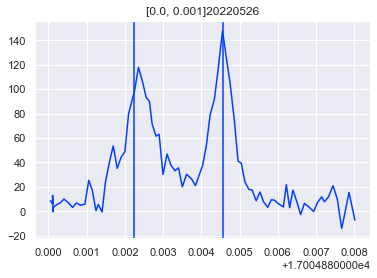

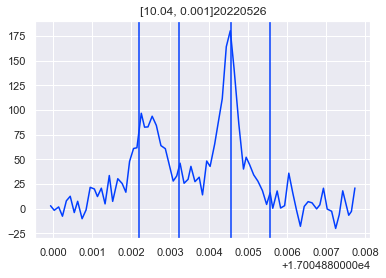

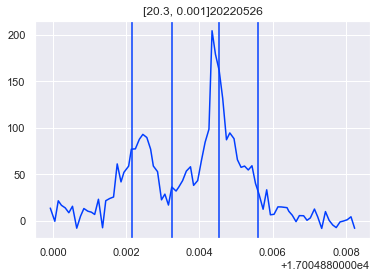

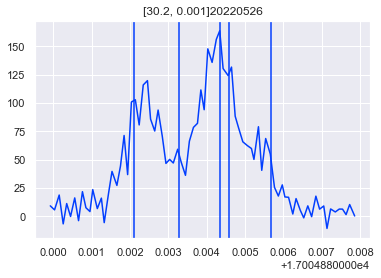

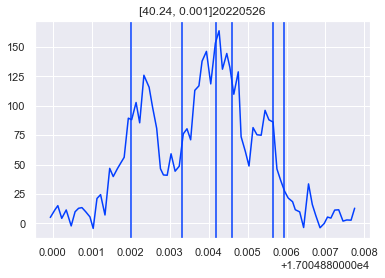

...

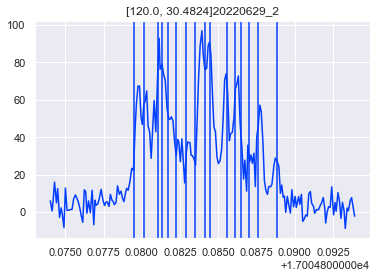

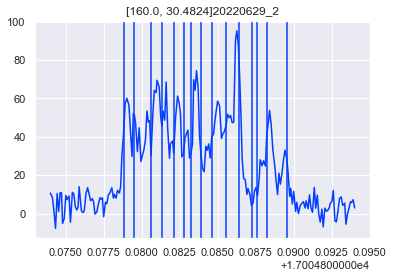

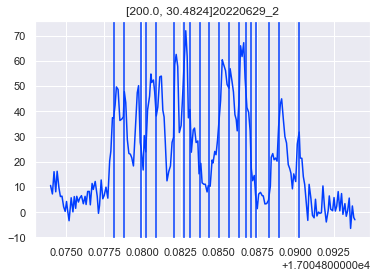

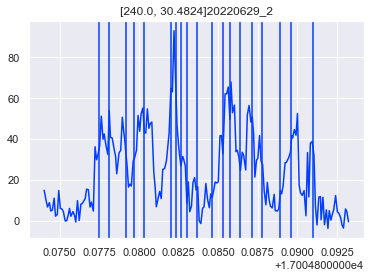

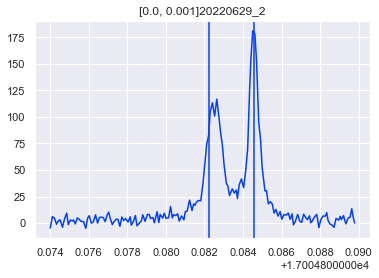

In [86]:
for label in All_StarkZeeman_Data:
    dataset = All_StarkZeeman_Data[label]
    for scan in dataset:
        plt.figure()
        plt.title(str(scan['EB'])+label)
        plt.plot(*scan['data cal'])
        E,B = scan['EB']
        d=2.12
        mu=1
        T=4
        square=True
        v=[0.5,0.5,1]
        model_lines,tdms = simulate_spectra([d*E,mu*B],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = 17998.5875-319.908907,P_adjust=False,pad=100,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),make_lorentzians=False,plot=False)
        model_lines=np.sort(np.unique(model_lines))
        line_diffs = model_lines[1:] - model_lines[:-1]
        line_group = [model_lines[0]]
        line_avgs = []
        thresh=7/29979.2458
        for i,ld in enumerate(line_diffs):
            if ld<=thresh:
                line_group.append(model_lines[i+1])
            else:
                line_avgs.append(sum(line_group)/len(line_group))
                line_group = [model_lines[i+1]]
        line_avgs.append(sum(line_group)/len(line_group))
        model_avgs = np.array(line_avgs)
        [plt.axvline(x=f) for f in model_avgs];

In [354]:
dataset[8]['lines cal']

array([17004.881477865, 17004.882303565, 17004.883069406, 17004.883814993,
       17004.884683113, 17004.886000312, 17004.886828419])

In [261]:
def field_line_residual(params, scans,thresh = 5/29979.2458):
        c1 = params['d_mu']
        c2 = params['d_kappa']
        c3 = params['d_B']
        T = params['Temp']
        v = [c1,c2,c3]
        E = 0
        B=1e-3
        offset = params['offset']
        print(offset)
        lines,[freq_out,tot_lor],tdms = simulate_spectra([E,B],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = offset+17998.5875-319.908907,P_adjust=False,pad=100,T=T,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),plot=False);
    #     model_n = tot_lor/tot_lor.max()
        lines=np.sort(np.unique(lines))
        line_diffs = lines[1:] - lines[:-1]
        line_group = [lines[0]]
        line_avgs = []
        for i,ld in enumerate(line_diffs):
            if ld<=thresh:
                line_group.append(lines[i+1])
            else:
                line_avgs.append(sum(line_group)/len(line_group))
                line_group = [lines[i+1]]
        line_avgs.append(sum(line_group)/len(line_group))
        line_avgs = np.array(line_avgs)
        print(line_avgs)
        diff = (data_arr - line_avgs)/uncertainty
        print(diff)
        return diff

In [264]:
cal_out = []
for cal in cal_scans:
    data = calibration_values.T[0]
    uncertainty = calibration_values.T[1]
    params = Parameters()
    params.add('d_mu', value=-0.5,min=-10,max=10,vary=False)
    params.add('d_kappa', value=2,min=-10,max=10,vary=False)
    params.add('d_B', value=-1,min=-10,max=10,vary=False)
    params.add('Temp', value=4.0,min=1,max=10,vary=False)
    params.add('offset',value=0.0000,min=-0.0005,max=0.0005,vary=True)
    t1 = time.time()
    out = minimize(line_residual, params, args=(data,uncertainty))#,kws={'flist':True})#,method='least_squares')
    t2 = time.time()
    print(t2-t1)
    cal_out.append(out)

<Parameter 'offset', value=0.0, bounds=[-0.0005:0.0005]>
[17004.882229063 17004.884572372]
[12.061942233 -0.075537586]
<Parameter 'offset', value=0.0, bounds=[-0.0005:0.0005]>
[17004.882229063 17004.884572372]
[12.061942233 -0.075537586]
<Parameter 'offset', value=0.0, bounds=[-0.0005:0.0005]>
[17004.882229063 17004.884572372]
[12.061942233 -0.075537586]
<Parameter 'offset', value=7.450580625546765e-12, bounds=[-0.0005:0.0005]>
[17004.882229063 17004.884572372]
[12.061941687 -0.07553763 ]
<Parameter 'offset', value=0.00016072452345628017, bounds=[-0.0005:0.0005]>
[17004.882389787 17004.884733096]
[ 0.01594241  -1.056881789]
<Parameter 'offset', value=0.00016072452576514572, bounds=[-0.0005:0.0005]>
[17004.882389787 17004.884733096]
[ 0.01594241  -1.056881789]
<Parameter 'offset', value=0.00016072452345628017, bounds=[-0.0005:0.0005]>
[17004.882389787 17004.884733096]
[ 0.01594241  -1.056881789]
9.667087316513062


In [265]:
cal_out[0]

In [269]:
cal_out[0].params['offset'].value

0.00016072452345628017

In [ ]:
freq 
if len(cal_out) == 1:
    

In [ ]:
from lmfit import minimize, Parameters
import time

g.eigensystem(0,1e-3)
e.eigensystem(0,1e-3)
gidx = g.select_q({'N':[1]})
eidx = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')

freq = freq0
data = sig0

def residual(params, freq_arr, data_arr,uncertainty,flist = None):
    c1 = params['d_mu']
    c2 = params['d_kappa']
    c3 = params['d_B']
    T = params['Temp']
    v = [c1,c2,c3]
    dE = params['dE']
    offset = params['offset']
    print(offset)
    lines,[freq_out,tot_lor],tdms = simulate_spectra([dE,1e-3],g,e,gidx,eidx,diagonalize=True,freq_array = freq_arr,origin = offset+17998.5875-319.908907,P_adjust=False,pad=1000,T=T,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-4,g=16/(29979.2458),plot=False);
#     model_n = tot_lor/tot_lor.max()
    s=np.sort(lines)
    model_n = np.array([s[0],s[-1]])
#     data_n = data_arr/data_arr.max()
    data_n = np.sort(ps[2:4]+17004.8)
    if flist is None:
        diff = (data_n - model_n)/uncertainty
        print(diff)
    else:
        if type(flist) is bool:
            if flist==True:
                flist=lines
        diff_idx = np.array([np.arange(np.searchsorted(freq,f-100),np.searchsorted(freq,f+100)) for f in flist])
        diff_idx = np.unique(diff_idx)
        diff = (data_n - model_n)[diff_idx]
    return diff


params = Parameters()
params.add('d_mu', value=-0.5,min=-10,max=10,vary=False)
params.add('d_kappa', value=2,min=-10,max=10,vary=False)
params.add('d_B', value=-1,min=-10,max=10,vary=False)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('dE', value =0,vary=False)
params.add('offset',value=0.0000,min=-0.0005,max=0.0005,vary=True)

uncert = np.array([3,3])/29979.2458
# uncert = np.array([1e-4,1e-4])
t1 = time.time()
out = minimize(residual, params, args=(freq, data,uncert),method='least_squares')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
print(t2-t1)

In [ ]:
from lmfit import minimize, Parameters
import time

g.eigensystem(0,1e-3)
e.eigensystem(0,1e-3)
gidx = g.select_q({'N':[1]})
eidx = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')

freq = freq115
data = sig115

def residual(params, freq_arr, data_arr,flist = None):
    c1 = params['d_mu']
    c2 = params['d_kappa']
    c3 = params['d_B']
    T = params['Temp']
    v = [c1,c2,c3]
    dE = params['dE']
    offset = params['offset']
    lines,[freq_out,tot_lor],tdms = simulate_spectra([dE,1e-1],g,e,gidx,eidx,diagonalize=True,freq_array = freq_arr,origin = offset+17998.5875-319.908907,P_adjust=False,pad=1000,T=T,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-4,g=16/(29979.2458),plot=False);
#     model_n = tot_lor/tot_lor.max()
    model_n = tot_lor
    data_n = data_arr/data_arr.max()
    if flist is None:
        diff = (data_n - model_n)
    else:
        if type(flist) is bool:
            if flist==True:
                flist=lines
        diff_idx = np.array([np.arange(np.searchsorted(freq,f-100),np.searchsorted(freq,f+100)) for f in flist])
        diff_idx = np.unique(diff_idx)
        diff = (data_n - model_n)[diff_idx]
    return diff


params = Parameters()
params.add('d_mu', value=0.5,min=-10,max=10,vary=True)
params.add('d_kappa', value=1,min=-10,max=10,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=True)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('dE', value =116*2/(2.11*0.5032),vary=False) # 1 Debye = 1.6792×10^-5 cm^-1/(V/cm)
params.add('offset',value=-0.000183,min=-0.0005,max=0.0005,vary=False)

t1 = time.time()
out = minimize(residual, params, args=(freq, data))#,method='bfgs')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
print(t2-t1)

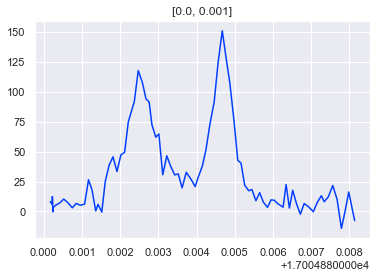

In [202]:
plt.title(batch[0]['EB'])
plt.plot(*batch[0]['data'])

In [243]:
thresh=1e-4
lines,[freq_out,tot_lor],tdms = simulate_spectra([0,1e-3],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = 17998.5875-319.908907,P_adjust=False,pad=100,T=4,square=square,dipole='x',cm=True,coeffs=[0.5,0.5,1],thresh=1e-3,g=16/(29979.2458),plot=False);
#     model_n = tot_lor/tot_lor.max()
lines=np.sort(np.unique(lines))
line_diffs = lines[1:] - lines[:-1]
line_group = [lines[0]]
line_avgs = []
for i,ld in enumerate(line_diffs):
    if ld<=thresh:
        line_group.append(lines[i+1])
    else:
        line_avgs.append(sum(line_group)/len(line_group))
        line_group = [lines[i+1]]
line_avgs.append(sum(line_group)/len(line_group))
print(line_avgs)

[17004.882229062765, 17004.884572371542]


[0.40824829  0.40824829  0.816496581]


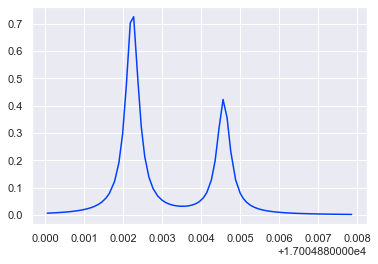

In [163]:
# phi = 20/180*np.pi
# th = 32/180*np.pi
# v = np.array([np.cos(phi)*np.sin(th),np.sin(phi)*np.sin(th),np.cos(th)])
# print(v)
# v[-1]*=1/2.32
v=np.array([0.5,0.5,1])
v=np.array(v)
print(v/np.sqrt(v@v))
T=4
square= True
gidx = g.select_q({'N':[1]})
eidx = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lines,[freq_out,tot_lor],tdms = simulate_spectra([0,1e-3],g,e,gidx,eidx,freq_array = freq0,origin = 17998.5875-319.908907,P_adjust=False,pad=10,T=T,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);


In [186]:
from lmfit import minimize, Parameters
import time

g.eigensystem(0,1e-3)
e.eigensystem(0,1e-3)
gidx = g.select_q({'N':[1]})
eidx = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')

freq = freq115
data = sig115

def residual(params, freq_arr, data_arr,flist = None):
    c1 = params['d_mu']
    c2 = params['d_kappa']
    c3 = params['d_B']
    T = params['Temp']
    v = [c1,c2,c3]
    dE = params['dE']
    offset = params['offset']
    lines,[freq_out,tot_lor],tdms = simulate_spectra([dE,1e-1],g,e,gidx,eidx,diagonalize=True,freq_array = freq_arr,origin = offset+17998.5875-319.908907,P_adjust=False,pad=1000,T=T,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-4,g=16/(29979.2458),plot=False);
#     model_n = tot_lor/tot_lor.max()
    model_n = tot_lor
    data_n = data_arr/data_arr.max()
    if flist is None:
        diff = (data_n - model_n)
    else:
        if type(flist) is bool:
            if flist==True:
                flist=lines
        diff_idx = np.array([np.arange(np.searchsorted(freq,f-100),np.searchsorted(freq,f+100)) for f in flist])
        diff_idx = np.unique(diff_idx)
        diff = (data_n - model_n)[diff_idx]
    return diff


params = Parameters()
params.add('d_mu', value=0.5,min=-10,max=10,vary=True)
params.add('d_kappa', value=1,min=-10,max=10,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=True)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('dE', value =116*2/(2.11*0.5032),vary=False) # 1 Debye = 1.6792×10^-5 cm^-1/(V/cm)
params.add('offset',value=-0.000183,min=-0.0005,max=0.0005,vary=False)

t1 = time.time()
out = minimize(residual, params, args=(freq, data))#,method='bfgs')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
print(t2-t1)

178.87358617782593


In [190]:
out

[-0.264076152  0.844221671 -0.466426367]


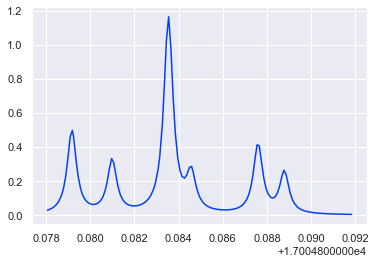

In [191]:
# phi = 20/180*np.pi
# th = 32/180*np.pi
# v = np.array([np.cos(phi)*np.sin(th),np.sin(phi)*np.sin(th),np.cos(th)])
# print(v)
# v[-1]*=1/2.32
v=np.array([out.params['d_mu'].value,out.params['d_kappa'].value,out.params['d_B'].value])
v=np.array(v)
print(v/np.sqrt(v@v))
T=4
square= True
gidx = g.select_q({'N':[1]})
eidx = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lines,[freq_out,tot_lor],tdms = simulate_spectra([out.params['dE'],1e-3],g,e,gidx,eidx,diagonalize=True,freq_array = freq115,origin = 1*out.params['offset'].value+17998.5875-319.908907,P_adjust=False,pad=10,T=T,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=15/(29979.2458),plot=True);

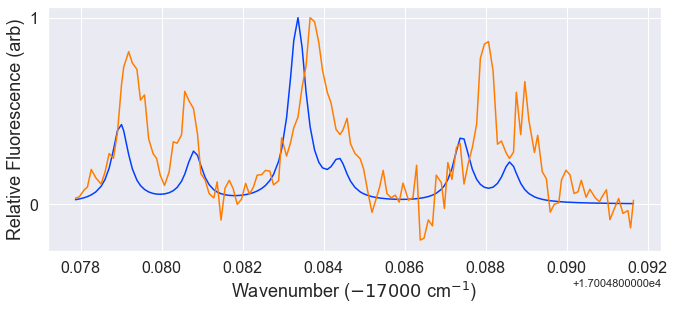

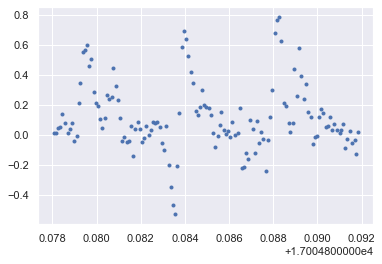

In [192]:
tot_lor_n = tot_lor/tot_lor.max()
data_n = data/data.max()
plt.figure(figsize=(11,4.5))
plt.plot(freq-0.000183,tot_lor_n)
plt.plot(freq-0.000183,data_n)
plt.ylabel('Relative Fluorescence (arb)',fontsize=18)
plt.xlabel(r'Wavenumber ($-17000$ cm$^{-1}$)',fontsize=18)
plt.annotate('Theory',(0.8,-1),fontsize=18)
plt.annotate('Experiment',(0.8,0.9),fontsize=18)
plt.xticks(fontsize=16);
plt.yticks([0,1],fontsize=16);
plt.figure()
plt.plot(freq,(data_n - tot_lor_n),'b.')

In [86]:
fit2Lorentzians(xscale, data,mean_guess,fwhm_guess,norm_guess,sigma=None,plot=True,verbose=False):

Help on class LorentzianModel in module lmfit.models:

class LorentzianModel(lmfit.model.Model)
 |  LorentzianModel(independent_vars=['x'], prefix='', nan_policy='raise', **kwargs)
 |  
 |  A model based on a Lorentzian or Cauchy-Lorentz distribution function.
 |  
 |  The model has three Parameters: `amplitude`, `center`, and `sigma`. In
 |  addition, parameters `fwhm` and `height` are included as constraints
 |  to report full width at half maximum and maximum peak height,
 |  respectively.
 |  
 |  .. math::
 |  
 |      f(x; A, \mu, \sigma) = \frac{A}{\pi} \big[\frac{\sigma}{(x - \mu)^2 + \sigma^2}\big]
 |  
 |  where the parameter `amplitude` corresponds to :math:`A`, `center` to
 |  :math:`\mu`, and `sigma` to :math:`\sigma`. The full width at half
 |  maximum is :math:`2\sigma`.
 |  
 |  For more information, see:
 |  https://en.wikipedia.org/wiki/Cauchy_distribution
 |  
 |  Method resolution order:
 |      LorentzianModel
 |      lmfit.model.Model
 |      builtins.object
 |  


[0.0005, 0.0005, 0.082, 0.0845, 0.5, 1]


Fit error =  [0.000079 0.000028 0.000027 0.00001  0.027634 0.038495]
FIT PARAMS =  [0.000948 0.000486 0.082586 0.08463  0.493795 0.993155]
Mean 1 = 0.082586 +/- 2.7e-05, FWHM 1 = 0.000948 +/- 7.9e-05
Mean 2 = 0.08463 +/- 1e-05, FWHM 2 = 0.000486 +/- 2.8e-05
[17004.882586 17004.88463 ]
[0.000027 0.00001 ]


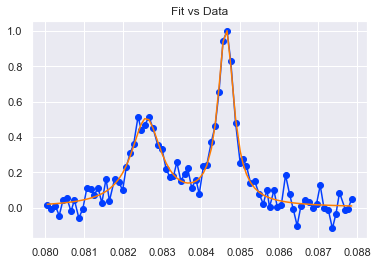

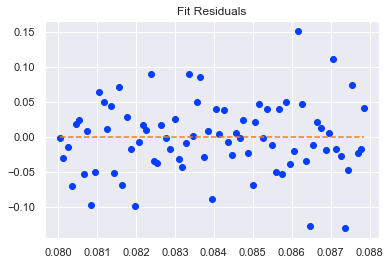

In [103]:
ps,err,resid = fit2Lorentzians(freq-17004.8,data_n,[0.082,0.0845],0.0005*np.ones(2),[0.5,1],verbose=True)
print(ps[2:4]+17004.8)
print(err[2:4])

In [158]:
from lmfit import minimize, Parameters
import time

g.eigensystem(0,1e-3)
e.eigensystem(0,1e-3)
gidx = g.select_q({'N':[1]})
eidx = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')

freq = freq0
data = sig0

def residual(params, freq_arr, data_arr,uncertainty,flist = None):
    c1 = params['d_mu']
    c2 = params['d_kappa']
    c3 = params['d_B']
    T = params['Temp']
    v = [c1,c2,c3]
    dE = params['dE']
    offset = params['offset']
    print(offset)
    lines,[freq_out,tot_lor],tdms = simulate_spectra([dE,1e-3],g,e,gidx,eidx,diagonalize=True,freq_array = freq_arr,origin = offset+17998.5875-319.908907,P_adjust=False,pad=1000,T=T,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-4,g=16/(29979.2458),plot=False);
#     model_n = tot_lor/tot_lor.max()
    s=np.sort(lines)
    model_n = np.array([s[0],s[-1]])
#     data_n = data_arr/data_arr.max()
    data_n = np.sort(ps[2:4]+17004.8)
    if flist is None:
        diff = (data_n - model_n)/uncertainty
        print(diff)
    else:
        if type(flist) is bool:
            if flist==True:
                flist=lines
        diff_idx = np.array([np.arange(np.searchsorted(freq,f-100),np.searchsorted(freq,f+100)) for f in flist])
        diff_idx = np.unique(diff_idx)
        diff = (data_n - model_n)[diff_idx]
    return diff


params = Parameters()
params.add('d_mu', value=-0.5,min=-10,max=10,vary=False)
params.add('d_kappa', value=2,min=-10,max=10,vary=False)
params.add('d_B', value=-1,min=-10,max=10,vary=False)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('dE', value =0,vary=False)
params.add('offset',value=0.0000,min=-0.0005,max=0.0005,vary=True)

uncert = np.array([3,3])/29979.2458
# uncert = np.array([1e-4,1e-4])
t1 = time.time()
out = minimize(residual, params, args=(freq, data,uncert),method='least_squares')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
print(t2-t1)

<Parameter 'offset', value=0.0, bounds=[-0.0005:0.0005]>
[3.567112544 0.575365053]
<Parameter 'offset', value=1.4901161193847656e-08, bounds=[-0.0005:0.0005]>
[3.566963635 0.575216144]
<Parameter 'offset', value=0.00014652683495835299, bounds=[-0.0005:0.0005]>
[ 2.102857866 -0.888889625]
<Parameter 'offset', value=0.00014654173611954683, bounds=[-0.0005:0.0005]>
[ 2.102708957 -0.889038534]
<Parameter 'offset', value=0.00019836026848475132, bounds=[-0.0005:0.0005]>
[ 1.584882144 -1.406865347]
<Parameter 'offset', value=0.00019837516964594517, bounds=[-0.0005:0.0005]>
[ 1.584733235 -1.407014256]
<Parameter 'offset', value=0.00020701180247501125, bounds=[-0.0005:0.0005]>
[ 1.49842664  -1.493320851]
<Parameter 'offset', value=0.0002070267036362051, bounds=[-0.0005:0.0005]>
[ 1.498277731 -1.49346976 ]
<Parameter 'offset', value=0.0002072670460674308, bounds=[-0.0005:0.0005]>
[ 1.495875963 -1.495871528]
<Parameter 'offset', value=0.00020728194722862463, bounds=[-0.0005:0.0005]>
[ 1.495727054

In [154]:
out

In [156]:
sns.set_style('white')

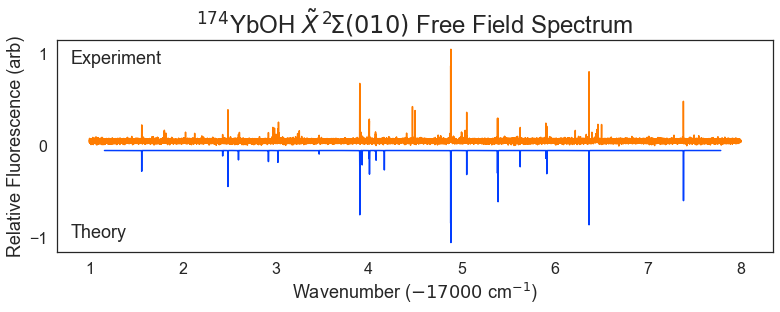

In [198]:
sns.set_style('white')
start, stop = (17001,17008)
i,j=(np.searchsorted(tx1[0],start),np.searchsorted(tx1[0],stop))
k,l = (np.searchsorted(freq,start),np.searchsorted(freq,stop))
plt.figure(figsize=(11,4.5))
tx_n = tx1[1]/tx1[1].max()
plt.plot(tx1[0][i:j]-17000,-tx_n[i:j]-0.05)
data_n = data/data.max()
plt.plot(freq[k:l]-17000,data_n[k:l]+0.05)
plt.ylabel('Relative Fluorescence (arb)',fontsize=18)
plt.xlabel(r'Wavenumber ($-17000$ cm$^{-1}$)',fontsize=18)
plt.annotate('Theory',(0.8,-1),fontsize=18)
plt.annotate('Experiment',(0.8,0.9),fontsize=18)
plt.xticks(fontsize=16);
plt.yticks([-1,0,1],fontsize=16);
plt.title(r'$^{174}$YbOH $\tilde{X}\, ^2\!\Sigma(010)$ Free Field Spectrum',fontsize=24)
plt.tight_layout()
# plt.savefig('X010_freefield_theory_exp_v1.svg')

In [21]:
g1 = g.select_q({'N':1,'J':[0.5]},parity='+')
e1 = e.select_q({'J':[0.5],'P':[1/2,-1/2]},parity='-')

g2 = g.select_q({'N':2,'J':2.5},parity='+')
e2 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')

g3 = g.select_q({'N':2,'J':2.5},parity='+')
e3 = e.select_q({'J':[2.5],'P':[1/2,-1/2]},parity='-')

eg_pairs = [(e1,g1), (e2,g2), (e3,g3)]

In [7]:
#Import Yuiki's data
folder = 'Yuiki_Stark'
title = '\\20220526_stark_identified_peaks'
peak_file = lambda volt: folder+title+str(volt)+'V.json'
err_file = lambda volt: folder+title+'_error'+str(volt)+'V.json'

V_range = np.array([0,5,15,20,25,30,35,50,75,95,115,132])
I_range = np.zeros(len(V_range))
peak_exp, err_exp = [[],[]]
for V,I in zip(V_range,I_range):
    peak_exp.append(get_json_data(peak_file(V),numpy=True))
    err_exp.append(get_json_data(err_file(V),numpy=True))


In [8]:
#Manual reanalysis of Yuiki's data, using normalization
peak_exp[0] = np.array([17004.882567, 17004.884673])
err_exp[0] = np.array([2.4e-05, 1.3e-05])
peak_exp[2] = np.array([17004.882464, 17004.884365, 17004.885582])
err_exp[2] = np.array([2.3e-05, 2.7e-05, 5.2e-05])
peak_exp[3] = np.array([17004.882367, 17004.884278, 17004.885645])
err_exp[3] = np.array([2.3e-05, 2.2e-05, 2.6e-05])
peak_exp[4] = np.array([17004.882253, 17004.883905, 17004.884641, 17004.885539])
err_exp[4] = np.array([2.7e-05, 2.1e-05, 2.7e-05, 8.2e-05])
peak_exp[5] = np.array([17004.882209, 17004.883847, 17004.884695, 17004.885613, 17004.886154])
err_exp[5] = np.array([2.4e-05, 1.2e-05, 2.3e-05, 3.6e-05, 4.9e-05])
peak_exp[6] = np.array([17004.882019, 17004.883712, 17004.88477,  17004.885697, 17004.88631])
err_exp[6] = np.array([2.6e-05, 2.1e-05, 3.0e-05, 3.0e-05, 2.7e-05])
peak_exp[7] = np.array([17004.881612, 17004.883184, 17004.883886, 17004.884811,
       17004.886095, 17004.886869])
err_exp[7] = np.array([2.8e-05, 3.6e-05, 3.0e-05, 5.3e-05, 3.9e-05, 3.8e-05])
peak_exp[8] = np.array([17004.880808, 17004.882198, 17004.883937, 17004.884871, 17004.886835,
 17004.887711])
err_exp[8] = np.array([1.8e-05, 1.8e-05, 2.2e-05, 2.3e-05, 1.9e-05, 3.2e-05])
peak_exp[9] = np.array([17004.880093, 17004.881501, 17004.883946, 17004.884782, 17004.887521,
 17004.888456])
err_exp[9] = np.array([2.3e-05, 3.9e-05, 3.90e-05, 7.20e-05, 2.40e-05, 3.00e-05])
peak_exp[10] = np.array([17004.879448, 17004.880818, 17004.88394,  17004.884837, 17004.888196,
 17004.88913 ])
err_exp[10] = np.array([2.4e-05, 2.8e-05, 3.0e-05, 6.6e-05, 1.8e-05, 3.3e-05])
peak_exp[11] = np.array([17004.880129, 17004.87885,  17004.88399,  17004.888762, 17004.889746])
err_exp[11] = np.array([2.0e-05, 2.0e-05, 2.3e-05, 2.4e-05, 2.2e-05])

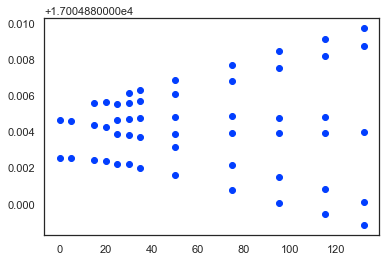

In [9]:
plt.figure()
for i,_V in enumerate(V_range):
    V = _V*np.ones(len(peak_exp[i]))
    plt.errorbar(V,peak_exp[i],yerr=err_exp[i],linestyle='None',marker='o',color='C0')

In [199]:
phi = 30/180*np.pi
th = 42/180*np.pi
v = np.array([np.cos(phi)*np.sin(th),np.sin(phi)*np.sin(th),np.cos(th)])
print(v)
v[-1]*=1.2/2.32
# v=[0.321393805, 0.383022222, 0.698046338]
print(v)
TDM_E, dE_E = simulate_transitions(np.linspace(0,264,101),g,e,E_or_B='E',origin = 17998.5875-319.908907,dipole='x',Debye=5.24,cm=True,coeffs = v)
t_str_E = gen_t_str(np.linspace(0,264,101),g,e,TDM_E, dE_E,E_or_B='E')

[0.579484104 0.334565303 0.743144825]
[0.579484104 0.334565303 0.384385255]
Using B (G) field of 0.0001


In [11]:
sns.set_style('white')

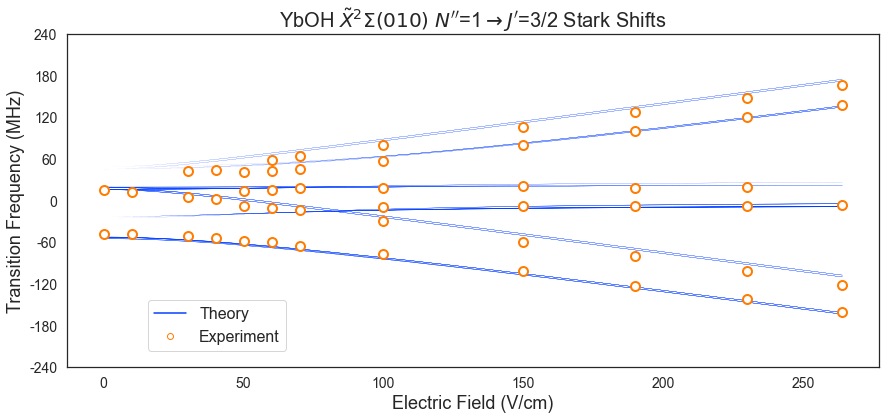

In [202]:
fig = plt.figure(figsize=(13,6))
plt.plot()
g.eigensystem(0,1e-2)
e.eigensystem(0,1e-2)
g3 = g.select_q({'N':1})
e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
plot_vs_field(np.linspace(0,264,101),TDM_E,dE_E,e_idx=e3,g_idx=g3,linescale=10,thresh=1e-3,color='C0',marker='None',mfc='None',figure=fig)
plt.ylabel(r'Transition Frequency (MHz)',fontsize=18)
plt.xlabel('Electric Field (V/cm)',fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
colors = ['C0','C1']
mark = ['None','o']
mf = ['None','white']
linest = [None,'None']
lines = [plt.Line2D([0], [0], color=c, marker=mk,mfc=m,linestyle=ls) for c,m,mk,ls in zip(colors,mf,mark,linest)]
labels = ['Theory','Experiment']
plt.legend(lines, labels,loc=(0.1,0.05),fontsize=16)
plt.title(r'YbOH $\tilde{X} ^2 \Sigma (010)$ $N^{\prime \prime}$=1$\rightarrow J^{\prime}$=3/2 Stark Shifts',fontsize=20)
for i,_V in enumerate(V_range):
    V = 2*_V*np.ones(len(peak_exp[i]))
    peaks = peak_exp[i]-0.000183
#     err = err_exp[i]*5
    err = 0.0002*np.ones(len(peak_exp[i]))
    plt.errorbar(V,peaks,yerr=err,linestyle='None',marker='o',color='C1',mfc='white',mew=2,markersize=9)
plt.tight_layout()
yticks = plt.yticks()
newlabels = [str(round(29979.2458*(val-17004.884))) for val in yticks[0]]
newticks = (yticks[0],newlabels)
plt.yticks(*newticks)
plt.savefig('X010_stark_shifts_B0_v2.svg')#,dpi=1000)

In [474]:
print(r'$N"$')

$N"$


In [463]:
newlabels = [str(np.round(29979.2458*(val-17004.884),0)) for val in yticks[0]]

In [462]:
new

['-239.8',
 '-179.9',
 '-119.9',
 '-60.0',
 '0.0',
 '60.0',
 '119.9',
 '179.9',
 '239.8']

In [14]:
freq0,sig0 = get_json_data('20220526_stark_0V.json',numpy=True)
freq50,sig50 = get_json_data('20220526_stark_50V.json',numpy=True)
freq115,sig115 = get_json_data('20220526_stark_115V.json',numpy=True)
freq0-=0.000183
freq50-=0.000183
freq115-=0.000183

Text(0.5, 0, 'Transition Frequency (MHz - Offset)')

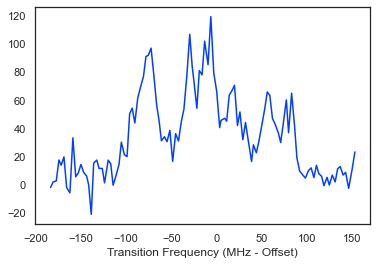

In [1060]:
plt.plot(29979.2458*(freq50-17004.884),sig50)
plt.xlabel('Transition Frequency (MHz - Offset)')

In [830]:
np.sqrt(0.7)

0.8366600265340756

In [87]:
# phi = 30/180*np.pi
# th = 42/180*np.pi
# v = np.array([np.cos(phi)*np.sin(th),np.sin(phi)*np.sin(th),np.cos(th)])
# print(v)
# v[-1]*=1.2/2.32
# # v=[0.321393805, 0.383022222, 0.698046338]
v=[-8,-0.5,7]
print(v)
v=np.array(v)
print(v/np.sqrt(v@v))
square= True
g3 = g.select_q({'N':1})
e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lx1,tx1,tdmx1 = simulate_spectra([115*2,0],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=15/(29979.2458),plot=False)
plt.figure()
i1 = 50
plt.plot(tx1[0][i1:-i1],tx1[1][i1:-i1]/tx1[1].max())
plt.plot(freq115,sig115/sig115.max(),color='C1')

[-8, -0.5, 7]
[-0.751745577 -0.046984099  0.65777738 ]


TypeError: _searchsorted_dispatcher() got an unexpected keyword argument 'linestyle'

<Figure size 432x288 with 0 Axes>

In [47]:
MHz = lambda x : 29979.2458*(x-17004.884)

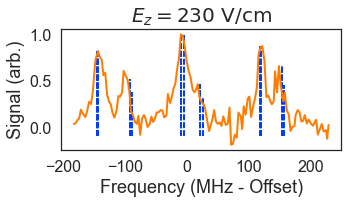

In [111]:
i1,j1 = (100,-80)
plt.figure(figsize=(5,3))
# plt.plot(MHz(tx1[0][i1:j1]),tx1[1][i1:j1]/tx1[1].max(),linestyle='-')
for lx in lx1:
    _i = np.searchsorted(freq115,lx)
    plt.vlines(MHz(lx),ymax=max(sig115[_i-2:_i+2]/sig115.max()),ymin=-0.1,linestyle='--',color='C0')
plt.plot(MHz(freq115),sig115/sig115.max(),linewidth=2, color = 'C1')#linewidth=0,marker='o',markersize=3.5)
plt.title(r'$E_z = 230 \,\,\mathrm{V/cm}$',fontsize=20)
plt.xticks(fontsize=16)
plt.yticks([0,0.5,1],fontsize=16)
plt.xlabel('Frequency (MHz - Offset)',fontsize=18)
plt.ylabel('Signal (arb.)',fontsize=18)
plt.tight_layout();
plt.savefig('Stark_230Vcm_N1_dashed.svg')

[-8, -0.5, 7]
[-0.751745577 -0.046984099  0.65777738 ]


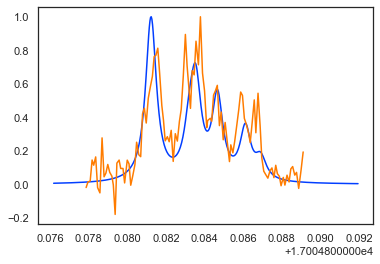

In [78]:
v=[-8,-0.5,7]
print(v)
v=np.array(v)
print(v/np.sqrt(v@v))
square= True
g3 = g.select_q({'N':1})
e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lx2,tx2,tdmx2 = simulate_spectra([50*2,0],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=20/(29979.2458),plot=False)
plt.figure()
i2 = 50
plt.plot(tx2[0][i2:-i2],tx2[1][i2:-i2]/tx2[1].max())
plt.plot(freq50,sig50/sig50.max())

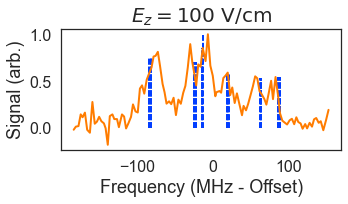

In [112]:
plt.figure(figsize=(5,3))
i2,j2 = (100,-120)
# plt.plot(MHz(tx2[0][i2:j2]),tx2[1][i2:j2]/tx2[1].max(),linestyle='-')
for lx in lx2:
    _i = np.searchsorted(freq50,lx)
    plt.vlines(MHz(lx),ymax=max(sig50[_i-2:_i+2]/sig50.max()),ymin=0,linestyle='--',color='C0')
plt.plot(MHz(freq50),sig50/sig50.max(),linewidth=2,color='C1')#linewidth=0,marker='o',markersize=3.5)
plt.title(r'$E_z = 100 \,\,\mathrm{V/cm}$',fontsize=20)
plt.xticks([-100,0,100],fontsize=16)
plt.yticks([0,0.5,1],fontsize=16)
plt.xlabel('Frequency (MHz - Offset)',fontsize=18)
plt.ylabel('Signal (arb.)',fontsize=18)
plt.tight_layout();
plt.savefig('Stark_100Vcm_N1_dashed.svg')

[-8, -0.5, 7]
[-0.751745577 -0.046984099  0.65777738 ]


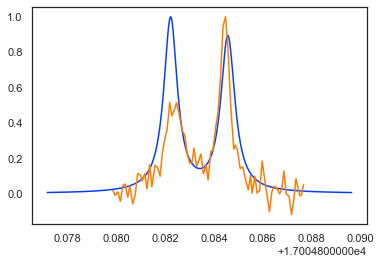

In [80]:
# phi = 30/180*np.pi
# th = 42/180*np.pi
# v = np.array([np.cos(phi)*np.sin(th),np.sin(phi)*np.sin(th),np.cos(th)])
# print(v)
# v[-1]*=1.2/2.32
# # v=[0.321393805, 0.383022222, 0.698046338]
v=[-8,-0.5,7]
print(v)
v=np.array(v)
print(v/np.sqrt(v@v))
square= True
g3 = g.select_q({'N':1})
e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lx3,tx3,tdmx3 = simulate_spectra([0*2,0],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=20/(29979.2458),plot=False)
plt.figure()
i3 = 90
plt.plot(tx3[0][i1:-i1],tx3[1][i1:-i1]/tx3[1].max())
plt.plot(freq0,sig0/sig0.max())

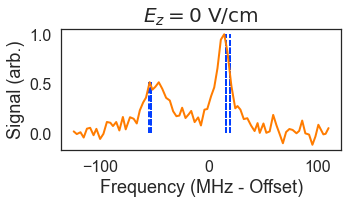

In [114]:
plt.figure(figsize=(5,3))
i3,j3=(110,-90)
# plt.plot(MHz(tx3[0][i3:j3]),tx3[1][i3:j3]/tx3[1].max())
for lx in lx3:
    _i = np.searchsorted(freq0,lx)
    plt.vlines(MHz(lx),ymax=max(sig0[_i-2:_i+2]/sig0.max()),ymin=0,linestyle='--',color='C0')
plt.plot(MHz(freq0),sig0/sig0.max(),linewidth=2,color='C1')#linewidth=0,marker='o',markersize=3.5)#linewidth=0,marker='o',markersize=3.5)
plt.title(r'$E_z = 0 \,\,\mathrm{V/cm}$',fontsize=20)
plt.xticks([-100,0,100],fontsize=16)
plt.yticks([0,0.5,1],fontsize=16)
plt.xlabel('Frequency (MHz - Offset)',fontsize=18)
plt.ylabel('Signal (arb.)',fontsize=18)
plt.tight_layout();
plt.savefig('Stark_0Vcm_N1_dashed.svg')

In [848]:
#things that kinda worked: 
#p 20, t 32, ba 1/2.32
#p 170, t 32, ba 0.6/2.32
#p 175, t 33, ba 0.8/2.32
#p 30, t 42, ba 1.2/2.32
#p 40, t 42, ba 1.2/2.32
#Free field: p 50, t 30, ba 1.87/2.32

In [568]:
E0=0
B0=0
square=True
# v=[1,1,0.5]
for e3,g3 in eg_pairs:
    v=[0.35,0.65,1]
    lx1,tx1,tdmx1 = simulate_spectra([E0,B0],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

#     v = [1,1,-1]
#     # g3 = g.select_q({'N':2,'J':2.5},parity='+')
#     # e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
#     lx2,tx2,tdmx2 = simulate_spectra([E0,B0],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

#     v = [-1,1,1]
#     # g3 = g.select_q({'N':2,'J':2.5},parity='+')
#     # e3 = e.select_q({'J':[2.5],'P':[1/2,-1/2]},parity='-')
#     lx3,tx3,tdmx3 = simulate_spectra([E0,B0],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);
    
#     v = [1,-1,1]
#     # g3 = g.select_q({'N':2,'J':2.5},parity='+')
#     # e3 = e.select_q({'J':[2.5],'P':[1/2,-1/2]},parity='-')
#     lx3,tx3,tdmx3 = simulate_spectra([E0,B0],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);
    

NameError: name 'eg_pairs' is not defined

Fit error =  [inf inf inf]
FIT PARAMS =  [0.35 0.65 1.  ]




C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


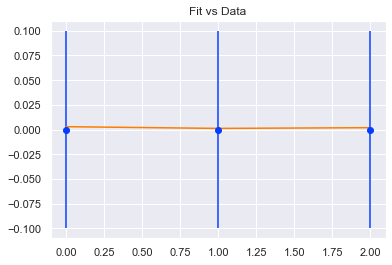

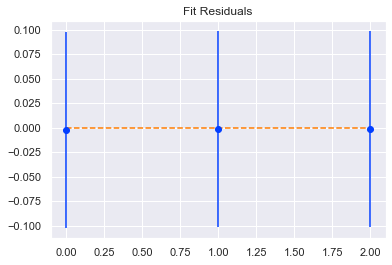

In [41]:
x = np.arange(0,len(eg_pairs))
data = np.zeros(len(eg_pairs))
sig = np.zeros(len(eg_pairs))
sig[:] = 0.1
params,err,resid = fit_intensities(x,data,g,e,[0,0],eg_pairs,guess=[0.35,0.65,1],sigma=sig,bounds=([-10,-10,-10],[10,10,10]),plot=True,verbose=True,dipole='z')

In [121]:
np.linspace(-3,3,31)

array([-3. , -2.8, -2.6, -2.4, -2.2, -2. , -1.8, -1.6, -1.4, -1.2, -1. ,
       -0.8, -0.6, -0.4, -0.2,  0. ,  0.2,  0.4,  0.6,  0.8,  1. ,  1.2,
        1.4,  1.6,  1.8,  2. ,  2.2,  2.4,  2.6,  2.8,  3. ])

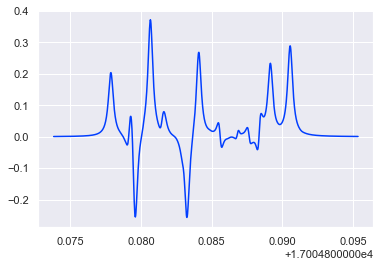

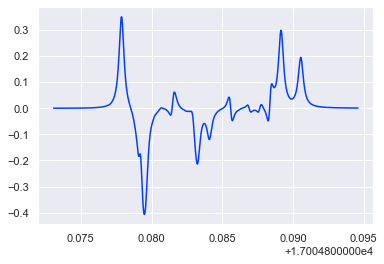

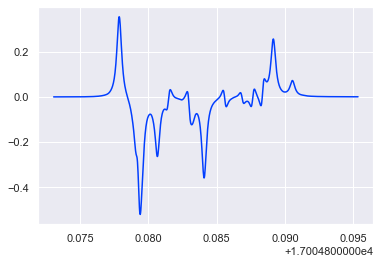

In [14]:
v = [1,0,0]
square= tRUE
E0 = 100
B0 = 70
g3 = g.select_q({'N':1})
e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lx1,tx1,tdmx1 = simulate_spectra([E0,B0],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

v = [0,1,0]
# g3 = g.select_q({'N':2,'J':2.5},parity='+')
# e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lx2,tx2,tdmx2 = simulate_spectra([E0,B0],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

v = [0,0,1]
# g3 = g.select_q({'N':2,'J':2.5},parity='+')
# e3 = e.select_q({'J':[2.5],'P':[1/2,-1/2]},parity='-')
lx3,tx3,tdmx3 = simulate_spectra([E0,B0],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

In [8]:
v = np.array([np.sqrt(3),np.sqrt(4),np.sqrt(9)])
v/=np.sqrt(v@v)
print(v)
square= True
g3 = g.select_q({'N':[1,2,3]})
e3 = e.select_q({'J':[0.5,1.5,2.5,3.5],'P':[1/2,-1/2]})
lx1,tx1,tdmx1 = simulate_spectra([0,0],g,e,g3,e3,origin = 17998.5875-319.908907,pad=1000,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=False);

[0.433012702 0.5         0.75       ]


KeyError: 'uA010'

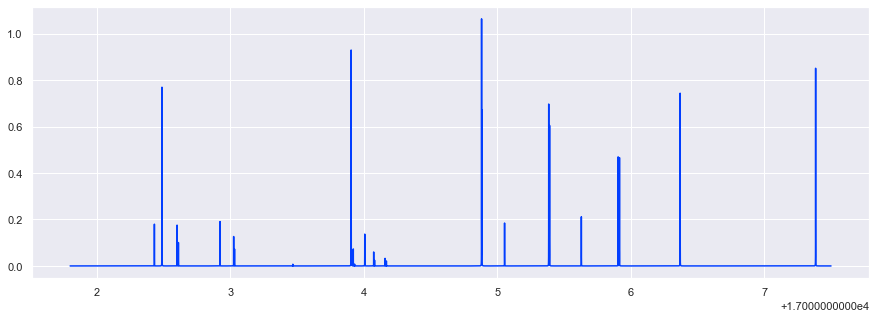

In [189]:
start, stop = (17001.8,17007.5)
i,j=(np.searchsorted(tx1[0],start),np.searchsorted(tx1[0],stop))
plt.figure(figsize=(15,5))
plt.plot(tx1[0][i:j],tx1[1][i:j])

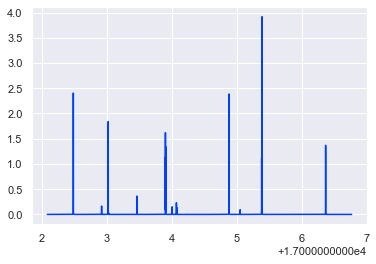

In [59]:
v = [1,1,0.5]
square= True
g3 = g.select_q({'N':[1,2]})
e3 = e.select_q({'J':[0.5,1.5,2.5],'P':[1/2,-1/2]})
lx1,tx1,tdmx1 = simulate_spectra([0,0],g,e,g3,e3,origin = 17998.5875-319.908907,pad=1000,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

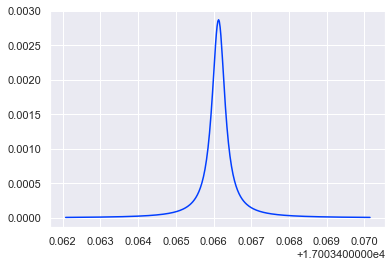

In [44]:
g3 = g.select_q({'N':1,'J':[0.5]},parity='+')
e3 = e.select_q({'J':[0.5],'P':[1/2,-1/2]},parity='-')
square= True
lx1,tx1,tdmx1 = simulate_spectra([0,0],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

[0.321393805 0.383022222 0.866025404]
[0.321393805 0.383022222 0.698046338]


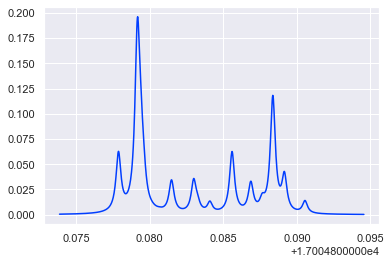

In [195]:
phi = 50/180*np.pi
th = 30/180*np.pi
v = np.array([np.cos(phi)*np.sin(th),np.sin(phi)*np.sin(th),np.cos(th)])
print(v)
v[-1]*=1.87/2.32
print(v)
square= True
g3 = g.select_q({'N':1})
e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lx1,tx1,tdmx1 = simulate_spectra([100,70],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

[0.632455532 0.632455532 0.447213595]


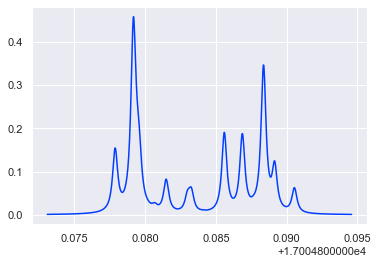

In [115]:
v = np.array([np.sqrt(2),np.sqrt(2),1])
v=v/np.sqrt(v@v)
print(v)
square= True
g3 = g.select_q({'N':1})
e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lx1,tx1,tdmx1 = simulate_spectra([100,70],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

[0.554700196 0.480384461 0.67936622 ]


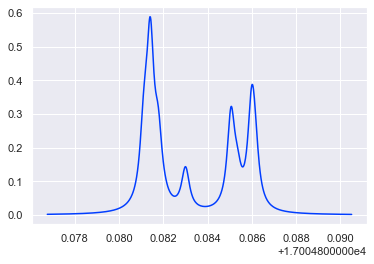

In [200]:
v = np.array([np.sqrt(4),np.sqrt(3),np.sqrt(6)])
v/=np.sqrt(v@v)
print(v)
square= True
g3 = g.select_q({'N':1})
e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lx1,tx1,tdmx1 = simulate_spectra([0,30],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

[0.314485451 0.104828484 0.943456353]


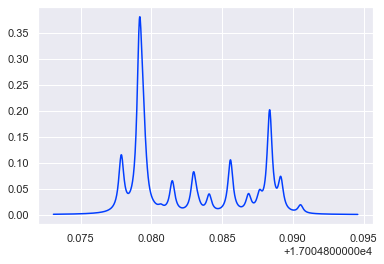

In [94]:
v = np.array([3,1,9])
v=v/np.sqrt(v@v)
print(v)
square= True
g3 = g.select_q({'N':1})
e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lx1,tx1,tdmx1 = simulate_spectra([100,70],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

[0.666666667 0.666666667 0.333333333]


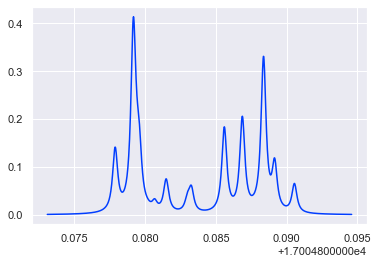

In [75]:
v = np.array([1,1,1/2])
v=v/np.sqrt(v@v)
print(v)
square= True
g3 = g.select_q({'N':1})
e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lx1,tx1,tdmx1 = simulate_spectra([100,70],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

In [161]:
tdmx3

[0.0001307079993195859,
 3.343979523485602e-06,
 1.3665448567463444e-05,
 0.000455433908828133,
 9.906762861591423e-06,
 1.1449420335269954e-05,
 0.0034947620687369933,
 0.0001402705343033371,
 0.0024226998139642427,
 1.45857820917984e-06,
 0.0002601293327027177,
 0.00026560407811718233,
 9.051266044432854e-06,
 9.048637491936656e-06,
 5.408907086456862e-06,
 0.003562451187776473,
 9.095034066874018e-05,
 0.004001844898155503,
 2.543868042416939e-05,
 0.0007033231638696968,
 4.909531631833701e-05,
 0.0024227002910722547,
 1.661084805159331e-05,
 1.1518887356183468e-05,
 5.205106928590503e-05,
 3.127075841071831e-05,
 6.622130483398556e-06,
 0.00037935332793506346,
 0.00018158476094770775,
 8.876212797509828e-05,
 0.0038060892922118644,
 0.00012520084594347392,
 0.0010675828223969525,
 0.00012778100888512442,
 3.954653001600085e-05,
 8.405034071715623e-05,
 0.0004784233215001749,
 0.0008552472014204355,
 0.001958502404075527,
 0.00023925657846633888,
 7.236885156035451e-05,
 0.001885490

In [167]:
diff = np.array([np.subtract.outer(E_e, E_g) for E_e,E_g in zip(e.evals_E,g.evals_E)])

In [172]:
dE_E.shape

(101, 88, 24)

In [96]:
simulate_transitions(field_vals,state_g,state_e,E_or_B='E',origin = 0,dipole='z',Debye=5.24,cm=True,scale=-0.5)

NameError: name 'field_vals' is not defined

In [117]:
np.transpose(g.evecs_E,axes=[0,2,1]).shape

(1001, 24, 24)

In [79]:
x = np.array([1,2,3,4,5,6])
y = np.array([6,7,8,9,10,11])
np.subtract.outer(y,x)

array([[ 5,  4,  3,  2,  1,  0],
       [ 6,  5,  4,  3,  2,  1],
       [ 7,  6,  5,  4,  3,  2],
       [ 8,  7,  6,  5,  4,  3],
       [ 9,  8,  7,  6,  5,  4],
       [10,  9,  8,  7,  6,  5]])

In [66]:
Escan = np.linspace(0,240,13)
print(Escan)

[  0.  20.  40.  60.  80. 100. 120. 140. 160. 180. 200. 220. 240.]


In [70]:
np.searchsorted(Ez,Escan)

array([  0,  80, 160, 240, 320, 400, 480, 560, 640, 720, 800, 880, 960],
      dtype=int64)

In [69]:
Ez[idx]

array([  0.,  20.,  40.,  60.,  80., 100., 120., 140., 160., 180., 200.,
       220., 240.])

In [62]:
np.identity(5)

array([[1., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1.]])

In [34]:
Bscan = np.linspace(0,70,6)
Bscan[0]=1e-3
print(Bscan)

# Escan = np.linspace(0,500,7)
Escan = np.linspace(0,240,11)
print(Escan)

[ 0.001 14.    28.    42.    56.    70.   ]
[  0.  24.  48.  72.  96. 120. 144. 168. 192. 216. 240.]


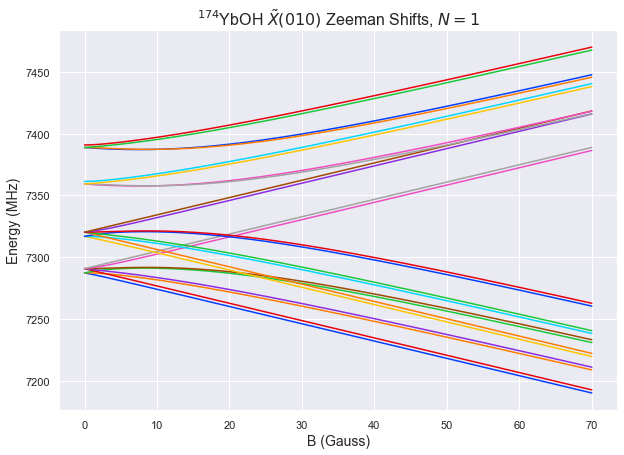

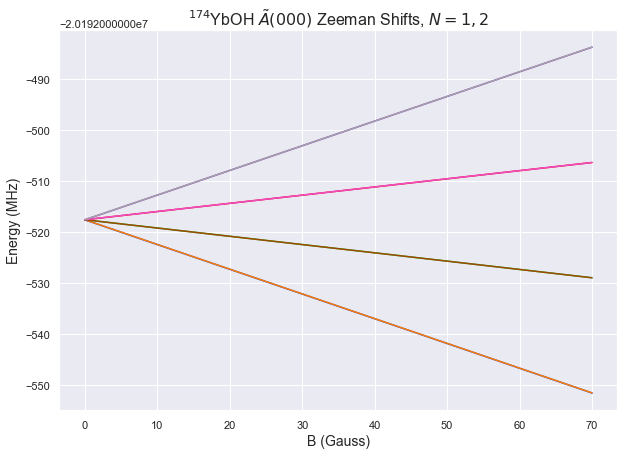

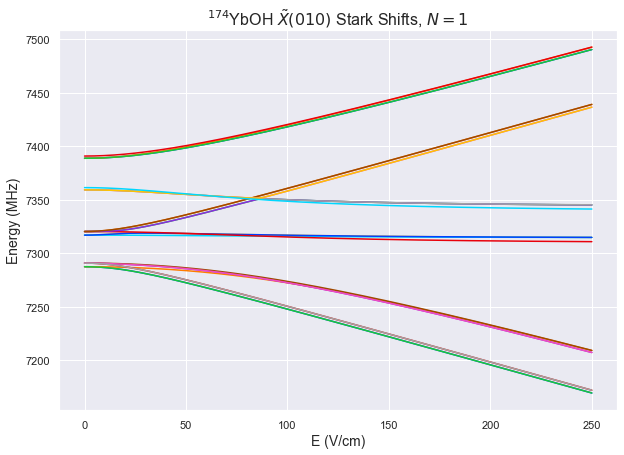

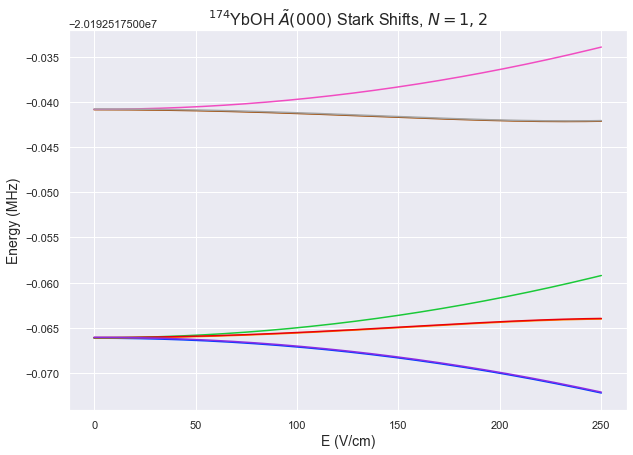

In [4]:
g = MoleculeLevels.initialize_state('YbOH','174','X010',[1],M_values = 'all',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2])
e = MoleculeLevels.initialize_state('YbOH','174','A000',[1,2],M_values = 'all',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2])
# Bstep = 0.001
# Bz = np.arange(0,1+Bstep,Bstep)
# Bz[0]=1e-4
# Estep = 0.25
# Ez = np.arange(0,500+Estep,Estep)
Bz = np.linspace(1e-3,70,1001)
Ez = np.linspace(0,250,1001)
g.ZeemanMap(Bz,0,idx=g.select_q({'N':1}),plot=True)
e.ZeemanMap(Bz,0,idx=e.select_q({'J':1.5,'P':1/2},parity='-'),plot=True)
g.StarkMap(Ez,1e-4,idx=g.select_q({'N':1}),plot=True)
e.StarkMap(Ez,1e-4,idx=e.select_q({'J':1.5,'P':1/2},parity='-'),plot=True)

In [285]:
TDM_E, dE_E = simulate_transitions(np.linspace(0,250,101),g,e,E_or_B='E',origin = 17998.5875-319.908907,dipole='z',Debye=5.24,cm=True,coeffs = [0.852, 0.087, 0.516])
t_str_E = gen_t_str(np.linspace(0,250,101),g,e,TDM_E, dE_E,E_or_B='E')

Using B (G) field of 0.0001


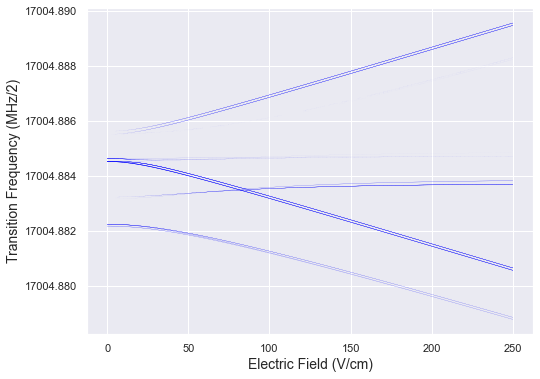

In [6]:
g.eigensystem(0,1e-2)
e.eigensystem(0,1e-2)
g1 = g.select_q({'N':1,'J':1.5})
e1 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
g2 = g.select_q({'N':1, 'J':0.5})
e2 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
g3 = g.select_q({'N':1})
e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
plot_vs_field(np.linspace(0,250,101),TDM_E,dE_E,e_idx=e3,g_idx=g3,linescale=5,thresh=1e-3,color='blue',marker='None',mfc='None')

In [128]:
t_str_E[0,0,0]

'(N=1-,J=1.5,F=1,M=-1)->(J=0.5-,F=1,M=-1)'

In [130]:
TDM[0,0,0]


-0.0

In [110]:
tdm = Forbidden_TDM_b2a(0,g,e,scale=1)
tdm.shape

(88, 24)

In [113]:
np.matmul(tdm,g.evecs_E).shape

(1001, 88, 24)

In [108]:
g.evecs_E[0].shape

(24, 24)

In [109]:
e.evecs_E[0].shape

(88, 88)

(7273.9759138283, 7404.3146470817)

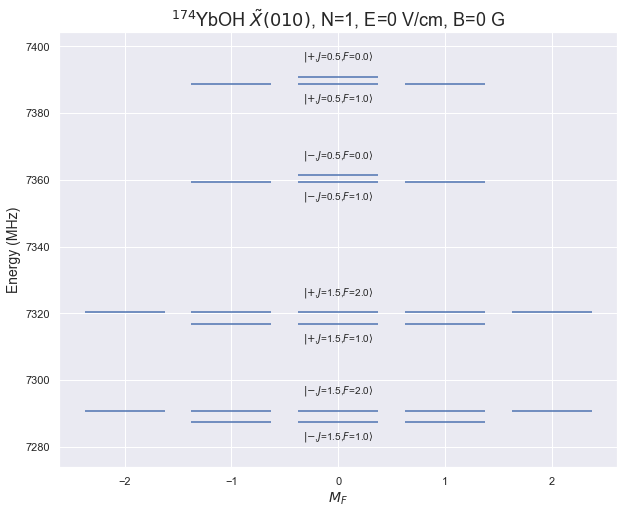

In [22]:
E0 = 0
B0 = 0
idx = g.select_q({'N':1,'J':[0.5,1.5]})
g.display_levels(E0,B0,'F',idx=idx,parity=True,label=True,label_q=[q for q in g.q_str if q not in ['N','K']],label_off=0.05,figsize=(10,8),alt_label=True)
plt.title(g.state_str+', N=1, E={} V/cm, B={} G'.format(E0,B0),fontsize=18)
# plt.grid(False)
# ax = plt.gca()
# ax.set_facecolor('None')
plt.ylim()

In [23]:
Trans_E = {}
D=5.24
origin = 17998.59-319.908907
# origin = 0
cm=True
scale=-0.5
for _E in Escan:
    g.ZeemanMap(Bz,_E,plot=False)
    e.ZeemanMap(Bz,_E,plot=False)
    Trans_E[_E] = {#'all': transitions_E(g,e,Escan,dipole='abs',Debye=5.24,origin=17323.5875-319.9089),
                   'x': transitions_B(g,e,Bscan,dipole='x',Debye=D,origin=origin,cm=cm,scale=scale),
                   'z': transitions_B(g,e,Bscan,dipole='z',Debye=D,origin=origin,cm=cm,scale=scale),
#                    'x+z': transitions_E(g,e,Escan,dipole='x+z',Debye=5.24,origin=17323.5875-319.9089),
                  }
#output of transitions_E is TDM_E, dE_E, table_E

Using E (V/cm) field of 0.0
0.001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
14.000799999999998
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
28.0006
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
42.00039999999999
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
56.00019999999999
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
70.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully c

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Using E (V/cm) field of 80.0
0.001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
14.000799999999998
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
28.0006
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
42.00039999999999
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
56.00019999999999
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
70.0
Successfully 

Successfully converted eigenvectors from bBJ to aBJ
70.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Using E (V/cm) field of 160.0
0.001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
14.000799999999998
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
28.0006
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
42.00039999999999
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
56.00019999999999
Successfully converted eigenvectors from bBJ to aBJ
Successfully

In [24]:
Trans_B = {}
D=5.24
origin = 17998.59-319.908907
cm=True
# origin = 0
scale=-0.5
for _B in Bscan:
    g.StarkMap(Ez,_B,plot=False)
    e.StarkMap(Ez,_B,plot=False)
    Trans_B[_B] = {#'all': transitions_E(g,e,Escan,dipole='abs',Debye=5.24,origin=17323.5875-319.9089),
                   'x': transitions_E(g,e,Escan,dipole='x',Debye=D,origin=origin,cm=cm,scale=scale),
                   'z': transitions_E(g,e,Escan,dipole='z',Debye=D,origin=origin,cm=cm,scale=scale),
#                    'x+z': transitions_E(g,e,Escan,dipole='x+z',Debye=5.24,origin=17323.5875-319.9089),
                  }
#output of transitions_E is TDM_E, dE_E, table_E

Using B (G) field of 0.001
0.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
20.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
40.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
60.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
80.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
100.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
120.0
S

120.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
140.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
160.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
180.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
200.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Using B (G) field of 28.0
0.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
20.0

20.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
40.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
60.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
80.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
100.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
120.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
140.0
Successfully converted eig

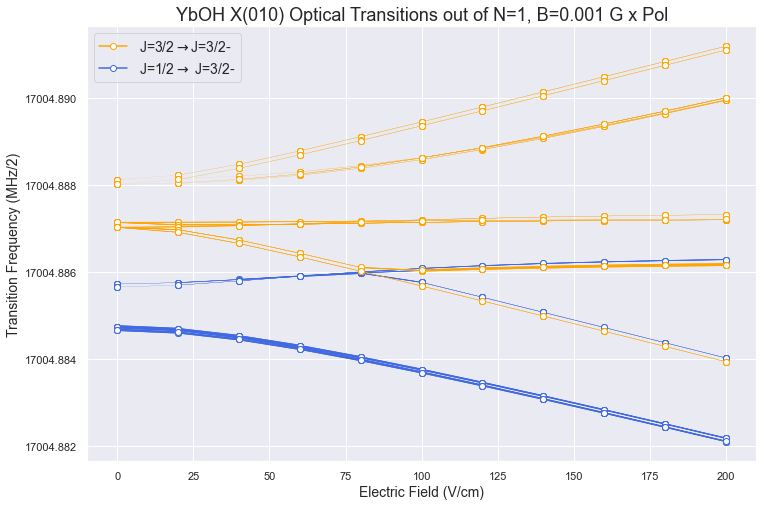

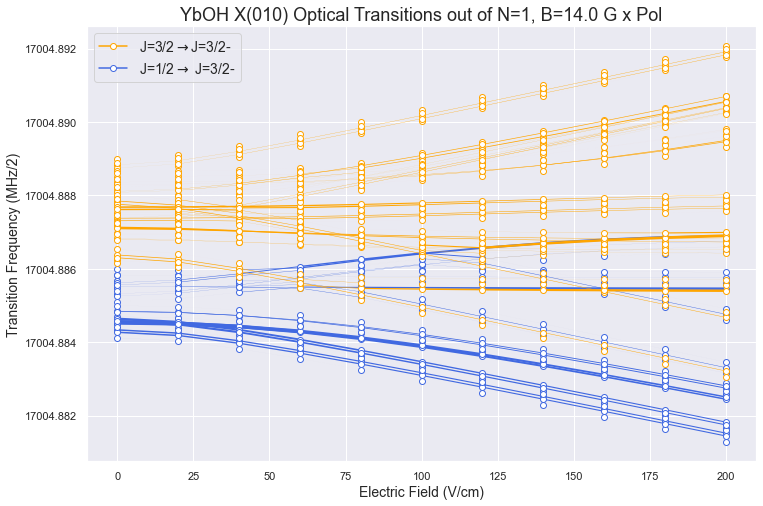

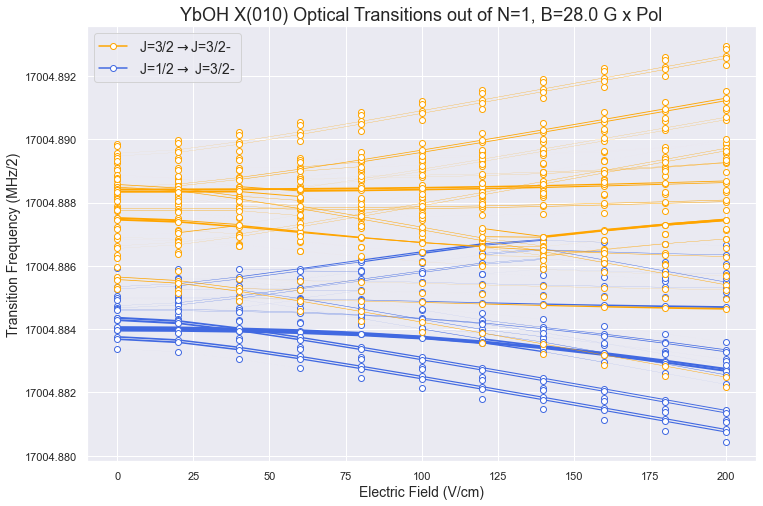

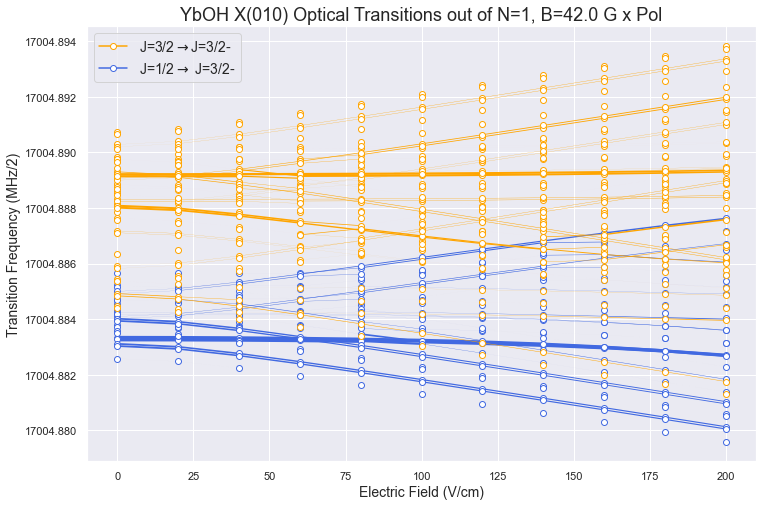

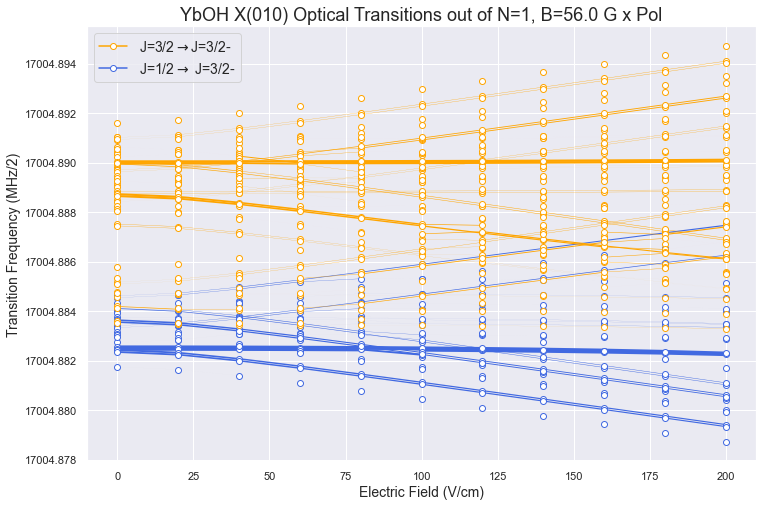

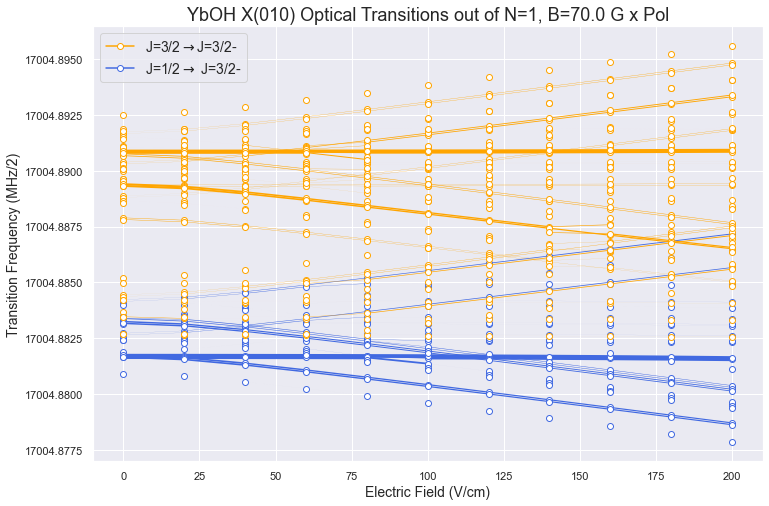

In [31]:
pol = 'x'
print_bool = False
for B in Bscan:
    g.eigensystem(0,1e-2)
    e.eigensystem(0,1e-2)
    g1 = g.select_q({'N':1,'J':1.5})
    e1 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
    g2 = g.select_q({'N':1, 'J':0.5})
    e2 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
    g3 = g.select_q({'N':1})
    e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
#     g4 = g.select_q({'N':1,'J':[1.5]})
#     e4 = e.select_q({'N':1,'J':[1.5]})
    fig,a = plt.subplots(figsize=(12,8))
    TDM_E,dE_E,t_str_E = Trans_B[B][pol]
    
#     g = N1.select_q({'N':1,'J':0.5,'F':0},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,1,2]},parity='+')
#     plot_B(Bscan,TDM_B,dE_B,g_idx=g,e_idx=e,linescale=10,figure=fig,color='pink',marker=None,mfc='white')
#     g = N1.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,0,1,2]},parity='+')
    plot_E(Escan,TDM_E,dE_E,g_idx=g2,Debye=D,e_idx=e2,linescale=0.1,figure=fig,color='royalblue',marker='o',mfc='white')
    plot_E(Escan,TDM_E,dE_E,g_idx=g1,Debye=D,e_idx=e1,linescale=0.1,figure=fig,color='orange',marker='o',mfc='white')
#     plot_E(Escan,TDM_E,dE_E,g_idx=g4,Debye=D,e_idx=e4,linescale=10,figure=fig,color='hotpink',marker='o',mfc='white')
    colors = ['orange','royalblue','hotpink']
    mark = ['o','o','o']
    mf = ['white','white','white']
    lines = [plt.Line2D([0], [0], color=c, marker=mk,mfc=m) for c,m,mk in zip(colors,mf,mark)]
    labels = [r'J=3/2$\rightarrow $J=3/2-',r'J=1/2$\rightarrow$ J=3/2-']
    plt.legend(lines, labels,loc='best',fontsize=14)
    plt.title('YbOH X(010) Optical Transitions out of N=1, B={} G {} Pol'.format(B,pol),fontsize=18)
    plt.show()
    if print_bool:
        print('B = {} G'.format(B))
        table = print_table_E(Escan,TDM_E,dE_E,t_str_E,g3,e3,thresh = 1e-2,cut=True,dipole=pol)

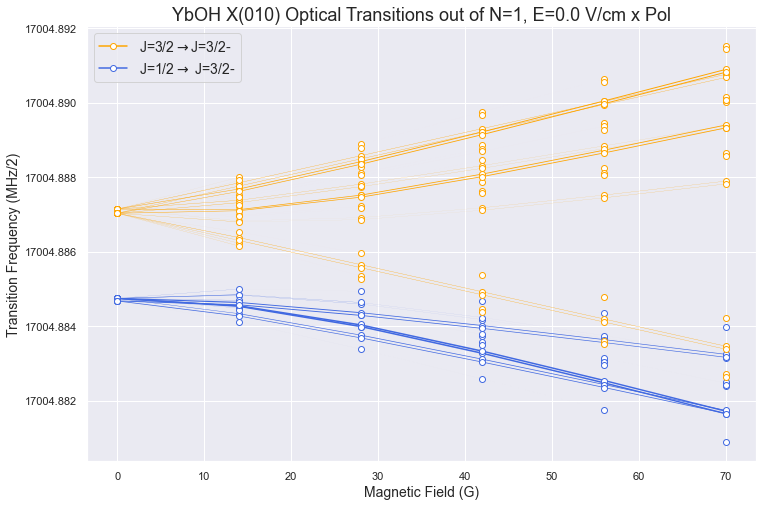

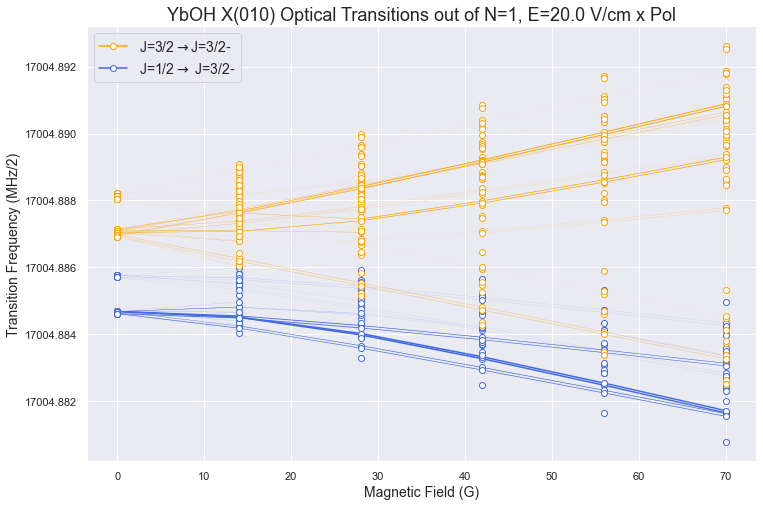

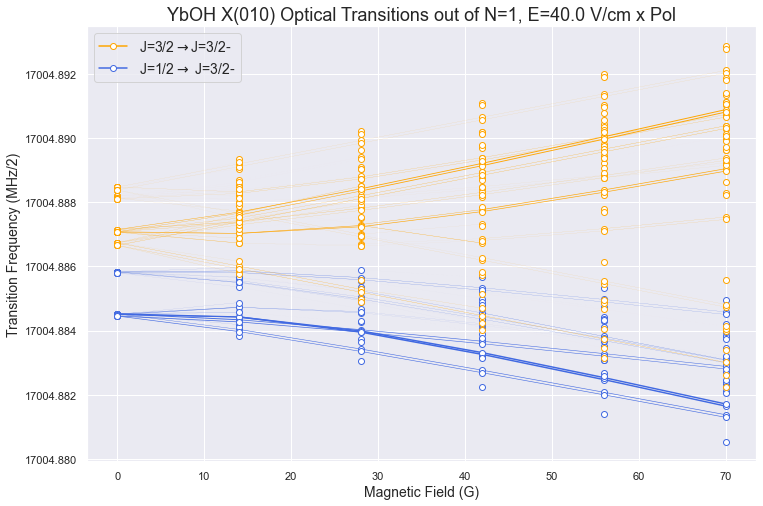

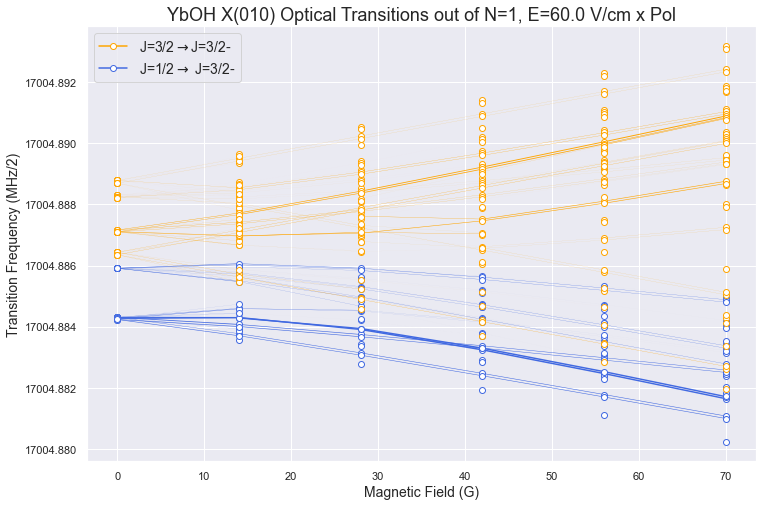

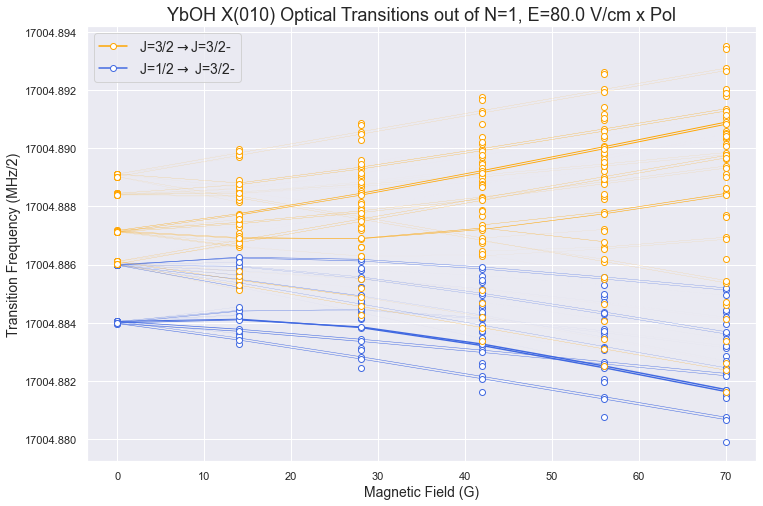

...

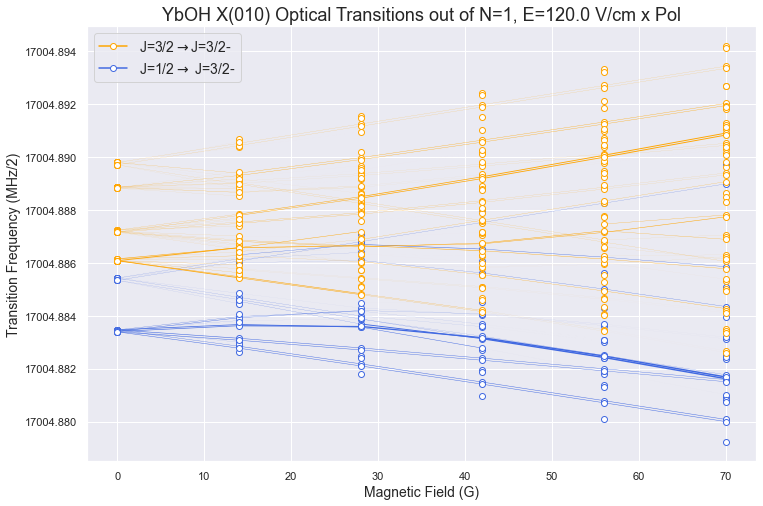

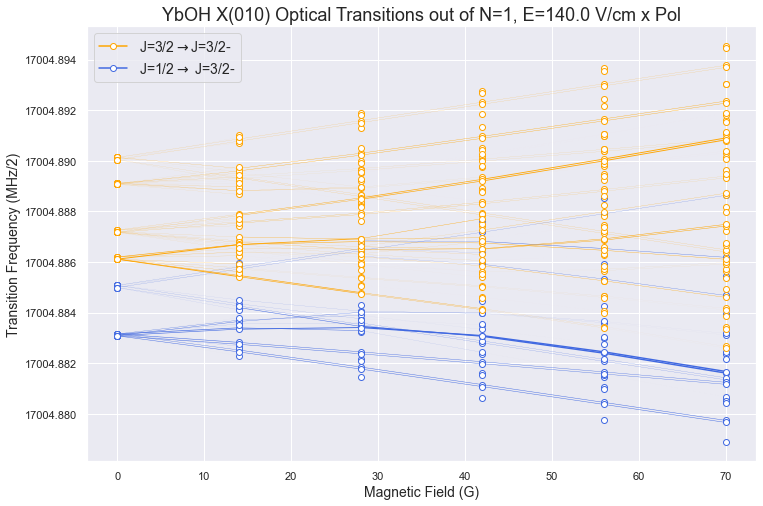

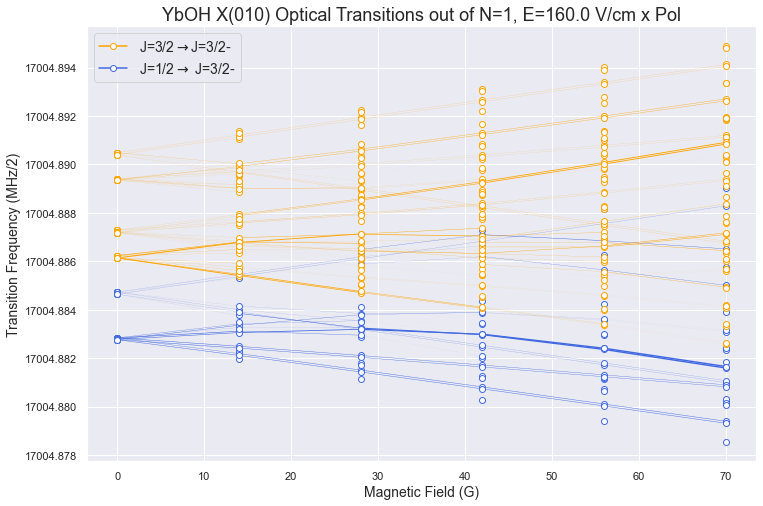

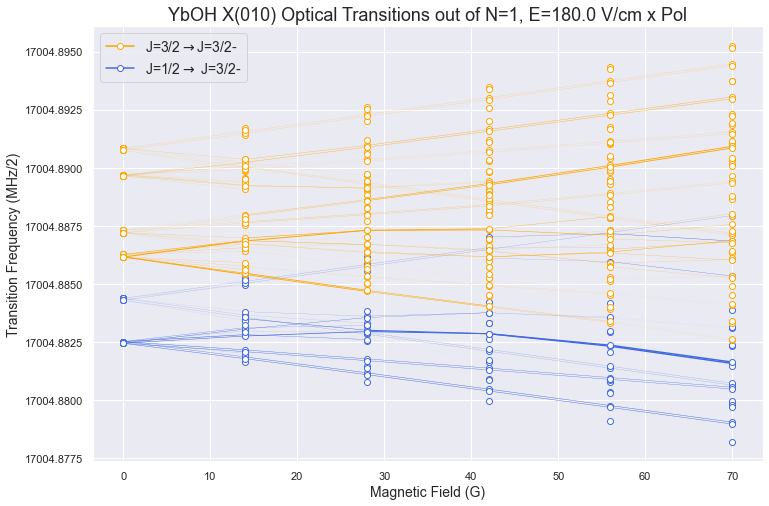

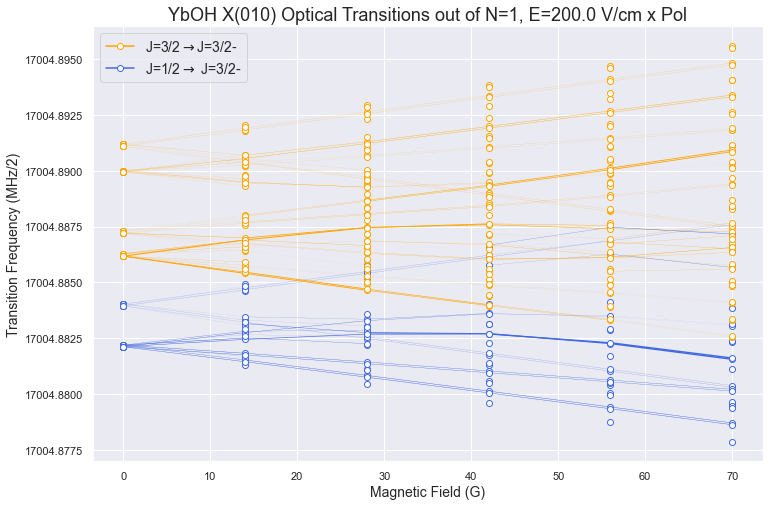

In [33]:
pol = 'x'
print_bool = False
for E in Escan:
    g.eigensystem(0,1e-2)
    e.eigensystem(0,1e-2)
    g1 = g.select_q({'N':1,'J':[1.5]})
    e1 = e.select_q({'J':[1.5],'P':[-1/2,1/2]},parity='-')
    g2 = g.select_q({'N':1,'J':[0.5]})
    e2 = e.select_q({'J':[1.5],'P':[-1/2,1/2]},parity='-')
    g3 = g.select_q({'N':1,'J':[0.5,1.5]})
    e3 = e.select_q({'J':[1.5],'P':[-1/2,1/2]},parity='-')
#     g4 = g.select_q({'N':1,'J':[1.5]})
#     e4 = e.select_q({'N':1,'J':[1.5]})
    fig,a = plt.subplots(figsize=(12,8))
    TDM_B,dE_B,t_str_B = Trans_E[E][pol]
    
#     g = N1.select_q({'N':1,'J':0.5,'F':0},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,1,2]},parity='+')
#     plot_B(Bscan,TDM_B,dE_B,g_idx=g,e_idx=e,linescale=10,figure=fig,color='pink',marker=None,mfc='white')
#     g = N1.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,0,1,2]},parity='+')
    plot_B(Bscan,TDM_B,dE_B,g_idx=g2,Debye=D,e_idx=e2,linescale=0.2,figure=fig,color='royalblue',marker='o',mfc='white')
    plot_B(Bscan,TDM_B,dE_B,g_idx=g1,Debye=D,e_idx=e1,linescale=0.2,figure=fig,color='orange',marker='o',mfc='white')
#     plot_B(Bscan,TDM_B,dE_B,g_idx=g4,Debye=D,e_idx=e4,linescale=10,figure=fig,color='hotpink',marker='o',mfc='white')
    colors = ['orange','royalblue','hotpink']
    mark = ['o','o','o']
    mf = ['white','white','white']
    lines = [plt.Line2D([0], [0], color=c, marker=mk,mfc=m) for c,m,mk in zip(colors,mf,mark)]
    labels = [r'J=3/2$\rightarrow $J=3/2-',r'J=1/2$\rightarrow$ J=3/2-']
    plt.legend(lines, labels,loc='best',fontsize=14)
    plt.title('YbOH X(010) Optical Transitions out of N=1, E={} V/cm {} Pol'.format(E,pol),fontsize=18)
    plt.show()
    if print_bool:
        print('E = {} V/cm'.format(E))
        table = print_table_B(Bscan,TDM_B,dE_B,t_str_B,g3,e3,thresh = 1e-1,cut=True,dipole=pol)

Using E (V/cm) field of 100
40.04042799999999
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ


Text(0.5, 0, 'Frequency (cm-1)')

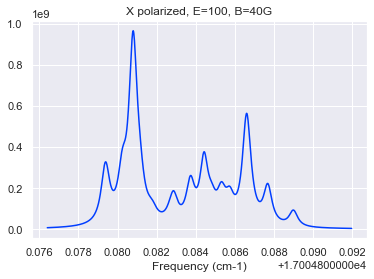

In [48]:
D=5.24
origin = 17998.5875-319.908907
cm=True
E0 =100
B0 = 40
pol = 'x'
if g.E0 != E0 and g.B0 != B0:
    g.ZeemanMap(Bz,E0,plot=False)
    e.ZeemanMap(Bz,E0,plot=False)
info_EB = transitions_B(g,e,[B0],dipole=pol,Debye=D,origin=origin,cm=cm,scale=1.5)
TDM,dE,t_str = info_EB
gidx = g.select_q({'N':1,})
eidx = e.select_q({'J':1.5,'P':[1/2,-1/2]},parity='-')
lines,lor,tdms = simulate_spectra_E(np.square(TDM),dE,gidx,eidx,[E0],E0=E0,g=15/(29979.2458),cut=True,thresh = 1e-6);
plt.title('X polarized, E={}, B={}G'.format(E0,B0))
plt.xlabel('Frequency (cm-1)')

Using E (V/cm) field of 240
70.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ


Text(0.5, 0, 'Frequency (cm-1)')

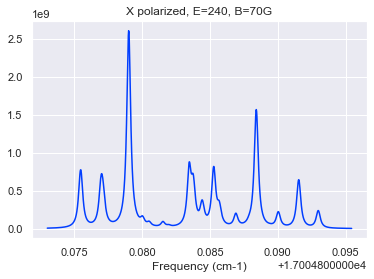

In [43]:
D=5.24
origin = 17998.5875-319.908907
cm=True
E0 =240
B0 = 70
pol = 'x'
g.ZeemanMap(Bz,E0,plot=False)
e.ZeemanMap(Bz,E0,plot=False)
info_EB = transitions_B(g,e,[B0],dipole=pol,Debye=D,origin=origin,cm=cm,scale=2)
TDM,dE,t_str = info_EB
gidx = g.select_q({'N':1,})
eidx = e.select_q({'J':1.5,'P':[1/2,-1/2]},parity='-')
lines,lor,tdms = simulate_spectra_E(np.square(TDM),dE,gidx,eidx,[E0],E0=E0,g=10/(29979.2458),cut=True,thresh = 1e-6);
plt.title('X polarized, E={}, B={}G'.format(E0,B0))
plt.xlabel('Frequency (cm-1)')

Using E (V/cm) field of 200
70.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ


Text(0.5, 0, 'Frequency (cm-1)')

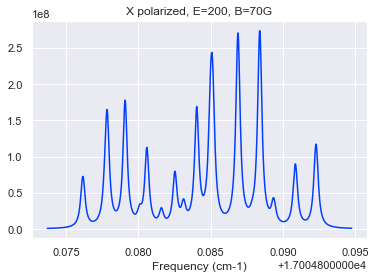

In [54]:
D=5.24
origin = 17998.5875-319.908907
cm=True
E0 =200
B0 = 70
pol = 'x'
g.ZeemanMap(Bz,E0,plot=False)
e.ZeemanMap(Bz,E0,plot=False)
info_EB = transitions_B(g,e,[B0],dipole=pol,Debye=D,origin=origin,cm=cm,scale=-0.5)
TDM,dE,t_str = info_EB
gidx = g.select_q({'N':1,})
eidx = e.select_q({'J':1.5,'P':[1/2,-1/2]},parity='-')
lines,lor,tdms = simulate_spectra_E(np.square(TDM),dE,gidx,eidx,[E0],E0=E0,g=10/(29979.2458),cut=True,thresh = 1e-6);
plt.title('X polarized, E={}, B={}G'.format(E0,B0))
plt.xlabel('Frequency (cm-1)')

In [50]:
list(zip(lines,np.round(tdms,2)))

[(17004.885625565592, 0.0),
 (17004.885625573635, 0.0),
 (17004.8856255817, 0.0),
 (17004.88562558978, 0.0),
 (17004.88562559788, 0.0),
 (17004.885626412288, 0.0),
 (17004.885626425752, 0.0),
 (17004.885626439194, 0.0),
 (17004.88562552802, 0.0),
 (17004.885625536062, 0.0),
 (17004.885625544128, 0.0),
 (17004.885625552208, 0.0),
 (17004.885625560306, 0.0),
 (17004.88562637472, 0.0),
 (17004.88562638818, 0.0),
 (17004.885626401625, 0.0),
 (17004.885625490446, 0.0),
 (17004.88562549849, 0.0),
 (17004.885625506555, 0.0),
 (17004.885625514635, 0.0),
 (17004.885625522733, 0.0),
 (17004.885626337145, 0.0),
 (17004.885626350606, 0.0),
 (17004.885626364052, 0.0),
 (17004.885513007244, 0.0),
 (17004.885513015288, 0.0),
 (17004.885513023353, 0.0),
 (17004.885513031433, 0.0),
 (17004.88551303953, 0.0),
 (17004.885513853944, 0.0),
 (17004.885513867404, 0.0),
 (17004.88551388085, 0.0),
 (17004.885512983874, 0.0),
 (17004.885512991917, 0.0),
 (17004.885512999983, 0.0),
 (17004.885513008063, 0.0),
 (

In [13]:
g.H_symbolic

Matrix([
[                                   7376.1145,                                      14.7525,                                                                0,                                                                0,        -0.4670780207227*B_z + 0.35406644*E_z,                                            0,                                                               0,                                                               0,                                                                0,                                                                0, -1.32109614318485*B_z + 0.25036278071458*E_z,                                            0,                                                               0,                                                               0,                                                  0,                                                  0,                                                   0,                                  

In [11]:
tdms

[6.064171141636983e-46,
 4.226999171544122e-46,
 4.948252343296877e-37,
 1.558987355456383e-47,
 6.278296729019124e-35,
 1.59301095110898e-49,
 4.500087965536726e-36,
 2.359416157352145e-49,
 9.321292124790326e-45,
 2.90200372281242e-36,
 1.9605758764649535e-50,
 8.311397339070044e-37,
 2.456003334351353e-46,
 1.5990388439794054e-35,
 0.0,
 1.168736322396162e-34,
 3.5170303135490674e-36,
 5.922701250239668e-46,
 1.0147520952985284e-36,
 8.578835703445444e-52,
 1.6061952003389555e-47,
 1.3505102389307162e-49,
 9.48097237481962e-35,
 2.390260726632192e-51,
 7.256189889118569e-51,
 7.027152435803517e-50,
 5.797239755831444e-51,
 2.2002307746557107e-35,
 5.002438099434919e-46,
 1.3024009707693615e-47,
 0.0,
 4.0616491538069627e-35,
 7.116523237779351e-46,
 3.108991877697639e-46,
 1.5347069910063884e-34,
 2.4515849871683403e-47,
 4.830166785395953e-35,
 1.5545528729962804e-48,
 7.204856025909445e-36,
 1.3778391761332771e-49,
 5.668411362367823e-45,
 1.4290467661792785e-36,
 2.05872161998158

In [2]:
list(zip(lines,np.round(tdms,4)))

NameError: name 'lines' is not defined

In [72]:
x010 = MoleculeLevels.initialize_state('YbOH','174','X010',[1,2,3],M_values = 'all',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2])

In [93]:
a000 = MoleculeLevels.initialize_state('YbOH','174','A000',[1,2,3],M_values = 'all',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2])

In [104]:
vals,vecs = x010.eigensystem(0,70)

In [105]:
arian = vals/(29979.2458)+17998.5875*0 + 319.908907
arian

array([320.148744361, 320.148828215, 320.149367315, 320.149441671,
       320.149728534, 320.149812389, 320.150105544, 320.1501824  ,
       320.15035149 , 320.150425846, 320.151089722, 320.151166577,
       320.155290038, 320.155371815, 320.156274211, 320.156283024,
       320.156349805, 320.156355988, 320.157015762, 320.157096457,
       320.157267201, 320.157333982, 320.157999942, 320.158080636,
       321.123647052, 321.123724084, 321.124338139, 321.12441076 ,
       321.125123373, 321.12518938 , 321.126055812, 321.126111994,
       321.126599586, 321.126676618, 321.127272319, 321.127290672,
       321.127313054, 321.127363293, 321.128075907, 321.128141914,
       321.129008346, 321.129064528, 321.130192451, 321.130224853,
       321.130265588, 321.130267693, 321.133108022, 321.133144985,
       321.133152625, 321.133220226, 321.134311032, 321.134367074,
       321.135235521, 321.135297554, 321.136015963, 321.136060557,
       321.136080905, 321.13610516 , 321.137263567, 321.137319

In [106]:
yuiki = np.array([320.1487449054689,
 320.14882867433334,
 320.1493677915599,
 320.14944215413476,
 320.14972907817537,
 320.1498128468788,
 320.1501059880212,
 320.15018289508924,
 320.15035196566134,
 320.1504263282467,
 320.15109016416596,
 320.15116707131,
 320.1552895986822,
 320.1553712932073,
 320.1562737712242,
 320.15628256414885,
 320.1563493733945,
 320.1563554655924,
 320.15701528768074,
 320.15709601958105,
 320.1572667404665,
 320.157333549744,
 320.15799946610764,
 320.1580801980822,
 321.12364762182864,
 321.1237246038431,
 321.1243386400533,
 321.1244112442359,
 321.1251238046136,
 321.125189818375,
 321.12605616884974,
 321.1261123692014,
 321.1266001531445,
 321.1266771350238,
 321.1272725920058,
 321.1272911713893,
 321.127313336039,
 321.1273637754876,
 321.12807633597487,
 321.1281423497074,
 321.1290087002457,
 321.1290649006297,
 321.1301920385976,
 321.1302251234593,
 321.13026586759264,
 321.1302672314525,
 321.1331078288354,
 321.13314456977446,
 321.13315249521617,
 321.133219762498,
 321.13431076319864,
 321.1343668409232,
 321.1352352063056,
 321.13529722894185,
 321.1360156185607,
 321.1360603609972,
 321.1360804925639,
 321.1361050272506,
 321.13726329548416,
 321.13731937318124,
 321.1381877386899,
 321.13824976139455,
 321.1389681510318,
 321.1390330251966,
 322.5980065435203,
 322.5980515177244,
 322.5989507499722,
 322.5989768306349,
 322.59989475794436,
 322.59990233014406,
 322.60082800550344,
 322.60083857932693,
 322.6017538469585,
 322.6017822248682,
 322.6026798456246,
 322.6027257043227,
 322.60391161456585,
 322.60395658890155,
 322.60485582107464,
 322.6048819018104,
 322.6057998291021,
 322.60580740131917,
 322.60673307667935,
 322.60674365053853,
 322.6076589181363,
 322.6076872961324,
 322.6085849168053,
 322.6086307756382]
)

In [107]:
arian = arian[:len(yuiki)]

In [108]:
arian-yuiki

array([-0.000000544, -0.000000459, -0.000000477, -0.000000483,
       -0.000000544, -0.000000458, -0.000000444, -0.000000495,
       -0.000000476, -0.000000482, -0.000000443, -0.000000494,
        0.000000439,  0.000000521,  0.00000044 ,  0.00000046 ,
        0.000000431,  0.000000522,  0.000000475,  0.000000437,
        0.000000461,  0.000000432,  0.000000476,  0.000000438,
       -0.00000057 , -0.000000519, -0.000000501, -0.000000485,
       -0.000000431, -0.000000439, -0.000000357, -0.000000376,
       -0.000000567, -0.000000517, -0.000000273, -0.000000499,
       -0.000000282, -0.000000482, -0.000000429, -0.000000436,
       -0.000000354, -0.000000373,  0.000000413, -0.00000027 ,
       -0.00000028 ,  0.000000461,  0.000000193,  0.000000415,
        0.00000013 ,  0.000000464,  0.000000269,  0.000000233,
        0.000000315,  0.000000325,  0.000000344,  0.000000196,
        0.000000412,  0.000000133,  0.000000271,  0.000000236,
        0.000000317,  0.000000328,  0.000000347,  0.000

In [20]:
yuiki_dict=[{'E': 320.1519874763684, 'N': 1, 'J': 1.5, 'P': 1.5, 'F': 1.0, 'Parity': -1},
 {'E': 320.1520999838366, 'N': 1, 'J': 1.5, 'P': 1.5, 'F': 2.0, 'Parity': -1},
 {'E': 320.15297164904666, 'N': 1, 'J': 1.5, 'P': 1.5, 'F': 1.0, 'Parity': 1},
 {'E': 320.1530841563027, 'N': 1, 'J': 1.5, 'P': 1.5, 'F': 2.0, 'Parity': 1},
 {'E': 320.1543861935952, 'N': 2, 'J': 0.5, 'P': 0.5, 'F': 1.0, 'Parity': -1},
 {'E': 320.15445561666667, 'N': 2, 'J': 0.5, 'P': 0.5, 'F': 0.0, 'Parity': -1},
 {'E': 320.1553703735929, 'N': 2, 'J': 0.5, 'P': 0.5, 'F': 1.0, 'Parity': 1},
 {'E': 320.15543979666666, 'N': 2, 'J': 0.5, 'P': 0.5, 'F': 0.0, 'Parity': 1},
 {'E': 321.126903550508, 'N': 3, 'J': 2.5, 'P': 1.5, 'F': 2.0, 'Parity': 1},
 {'E': 321.1269959175537, 'N': 3, 'J': 2.5, 'P': 1.5, 'F': 3.0, 'Parity': 1},
 {'E': 321.12985608178155, 'N': 3, 'J': 2.5, 'P': 1.5, 'F': 2.0, 'Parity': -1},
 {'E': 321.12994844866734, 'N': 3, 'J': 2.5, 'P': 1.5, 'F': 3.0, 'Parity': -1},
 {'E': 321.13344633701143, 'N': 4, 'J': 1.5, 'P': 0.5, 'F': 2.0, 'Parity': 1},
 {'E': 321.1334983606937, 'N': 4, 'J': 1.5, 'P': 0.5, 'F': 1.0, 'Parity': 1},
 {'E': 321.1363988694775, 'N': 4, 'J': 1.5, 'P': 0.5, 'F': 2.0, 'Parity': -1},
 {'E': 321.1364508933697, 'N': 4, 'J': 1.5, 'P': 0.5, 'F': 1.0, 'Parity': -1}]
yuiki = np.array([dic['E'] for dic in yuiki_dict])

In [29]:
yuiki_dict = [{'E': 17323.6215181406, 'J': 0.5, 'P': 0.5, 'F': 1.0, 'Parity': -1},
 {'E': 17323.621520250603, 'J': 0.5, 'P': 0.5, 'F': 0.0, 'Parity': -1},
 {'E': 17324.05958434058, 'J': 0.5, 'P': 0.5, 'F': 1.0, 'Parity': 1},
 {'E': 17324.059586450603, 'J': 0.5, 'P': 0.5, 'F': 0.0, 'Parity': 1},
 {'E': 17324.16150616901, 'J': 1.5, 'P': 0.5, 'F': 2.0, 'Parity': 1},
 {'E': 17324.161507012934, 'J': 1.5, 'P': 0.5, 'F': 1.0, 'Parity': 1},
 {'E': 17325.037615680852, 'J': 1.5, 'P': 0.5, 'F': 2.0, 'Parity': -1},
 {'E': 17325.03761652477, 'J': 1.5, 'P': 0.5, 'F': 1.0, 'Parity': -1},
 {'E': 17325.207514011483, 'J': 2.5, 'P': 0.5, 'F': 3.0, 'Parity': -1},
 {'E': 17325.2075145539, 'J': 2.5, 'P': 0.5, 'F': 2.0, 'Parity': -1},
 {'E': 17326.521621058928, 'J': 2.5, 'P': 0.5, 'F': 3.0, 'Parity': 1},
 {'E': 17326.521621601343, 'J': 2.5, 'P': 0.5, 'F': 2.0, 'Parity': 1},
 {'E': 17326.75953928891, 'J': 3.5, 'P': 0.5, 'F': 4.0, 'Parity': 1},
 {'E': 17326.75953969059, 'J': 3.5, 'P': 0.5, 'F': 3.0, 'Parity': 1},
 {'E': 17328.511575207624, 'J': 3.5, 'P': 0.5, 'F': 4.0, 'Parity': -1},
 {'E': 17328.5115756093, 'J': 3.5, 'P': 0.5, 'F': 3.0, 'Parity': -1},
 {'E': 17328.81757400227, 'J': 4.5, 'P': 0.5, 'F': 5.0, 'Parity': -1},
 {'E': 17328.817574321674, 'J': 4.5, 'P': 0.5, 'F': 4.0, 'Parity': -1},
 {'E': 17331.007447239914, 'J': 4.5, 'P': 0.5, 'F': 5.0, 'Parity': 1},
 {'E': 17331.00744755931, 'J': 4.5, 'P': 0.5, 'F': 4.0, 'Parity': 1},
 {'E': 18674.093743102694, 'J': 1.5, 'P': 1.5, 'F': 1.0, 'Parity': 1},
 {'E': 18674.093743190835, 'J': 1.5, 'P': 1.5, 'F': 1.0, 'Parity': -1},
 {'E': 18674.093745634593, 'J': 1.5, 'P': 1.5, 'F': 2.0, 'Parity': 1},
 {'E': 18674.093745722734, 'J': 1.5, 'P': 1.5, 'F': 2.0, 'Parity': -1},
 {'E': 18675.35922925572, 'J': 2.5, 'P': 1.5, 'F': 2.0, 'Parity': -1},
 {'E': 18675.359229608264, 'J': 2.5, 'P': 1.5, 'F': 2.0, 'Parity': 1},
 {'E': 18675.35923088326, 'J': 2.5, 'P': 1.5, 'F': 3.0, 'Parity': -1},
 {'E': 18675.359231235805, 'J': 2.5, 'P': 1.5, 'F': 3.0, 'Parity': 1},
 {'E': 18677.13088968148, 'J': 3.5, 'P': 1.5, 'F': 3.0, 'Parity': 1},
 {'E': 18677.130890562763, 'J': 3.5, 'P': 1.5, 'F': 3.0, 'Parity': -1},
 {'E': 18677.130890886958, 'J': 3.5, 'P': 1.5, 'F': 4.0, 'Parity': 1},
 {'E': 18677.13089176824, 'J': 3.5, 'P': 1.5, 'F': 4.0, 'Parity': -1},
 {'E': 18679.40870508287, 'J': 4.5, 'P': 1.5, 'F': 4.0, 'Parity': -1},
 {'E': 18679.40870604166, 'J': 4.5, 'P': 1.5, 'F': 5.0, 'Parity': -1},
 {'E': 18679.408706845228, 'J': 4.5, 'P': 1.5, 'F': 4.0, 'Parity': 1},
 {'E': 18679.408707804017, 'J': 4.5, 'P': 1.5, 'F': 5.0, 'Parity': 1}
]
yuiki = np.array([dic['E'] for dic in yuiki_dict])


In [30]:
a000 = MoleculeLevels.initialize_state('YbOH','174','A000',[1,2,3,4,5],M_values = 'none',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2])

Cannot construct decoupled basis without M values


In [22]:
x010 = MoleculeLevels.initialize_state('YbOH','174','X010',[1,2],M_values = 'none',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2])

Cannot construct decoupled basis without M values
Cannot construct decoupled basis without M values
Cannot construct decoupled basis without M values


In [34]:
arian = (a000.evals0[:32])/29979.2458

In [40]:
arian + 17998.5875

array([17323.621518507, 17323.621520617, 17324.059584434, 17324.059586544,
       17324.161505859, 17324.161506703, 17325.037614829, 17325.037615673,
       17325.20751248 , 17325.207513023, 17326.521618725, 17326.521619268,
       17326.75953599 , 17326.759536392, 17328.511570859, 17328.511571261,
       17328.817568388, 17328.817568707, 17331.007440345, 17331.007440664,
       17331.381596098, 17331.381596364, 17334.009190724, 17334.00919099 ,
       18674.093742061, 18674.093742149, 18674.093744593, 18674.093744681,
       18675.359226862, 18675.359227214, 18675.359228489, 18675.359228842])

In [23]:
arian = (x010.evals0)/29979.2458

In [37]:
(arian - arian.min()) - (yuiki - yuiki.min())

array([    0.         ,     0.         ,    -0.000000273,    -0.000000273,
          -0.000000677,    -0.000000676,    -0.000001218,    -0.000001218,
          -0.000001898,    -0.000001898,    -0.0000027  ,    -0.0000027  ,
          -0.000003665,    -0.000003665,    -0.000004715,    -0.000004715,
          -0.000005981,    -0.000005981,    -0.000007261,    -0.000007261,
       -1342.712147371, -1342.712147194, -1340.084555277, -1340.0845551  ,
          -1.265487561,    -1.265487825,    -1.265486657,    -1.265486921,
          -1.771663186,    -1.771663715,    -1.771662764,    -1.771663293])

In [26]:
arian[0]

0.2430803987877507

In [28]:
yuiki[0]-arian[0]

319.90890707758064

In [19]:
dE[0,gidx,:]

array([[17003.46946, 17003.46946, 17003.46946, 17003.46946, 17003.46847,
        17003.46847, 17003.46847, 17003.46847, 17003.46712, 17003.46712,
        17003.46613, 17003.46613],
       [17003.46946, 17003.46946, 17003.46946, 17003.46946, 17003.46847,
        17003.46847, 17003.46847, 17003.46847, 17003.46712, 17003.46712,
        17003.46613, 17003.46613],
       [17003.53594, 17003.53594, 17003.53594, 17003.53594, 17003.53496,
        17003.53496, 17003.53496, 17003.53496, 17003.5336 , 17003.5336 ,
        17003.53262, 17003.53262],
       [17003.53594, 17003.53594, 17003.53594, 17003.53594, 17003.53496,
        17003.53496, 17003.53496, 17003.53496, 17003.5336 , 17003.5336 ,
        17003.53262, 17003.53262],
       [17003.53594, 17003.53594, 17003.53594, 17003.53594, 17003.53496,
        17003.53496, 17003.53496, 17003.53496, 17003.5336 , 17003.5336 ,
        17003.53262, 17003.53262],
       [17003.53594, 17003.53594, 17003.53594, 17003.53594, 17003.53496,
        17003.53496, 1

In [79]:
g.select_q({'J':0.5},parity='+')

array([20, 21, 22, 23])

In [120]:
v = g.evecs_E[-1][20]
P=g.Parity_mat

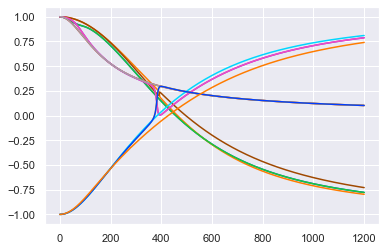

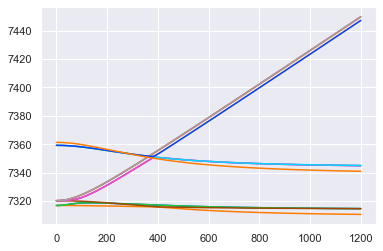

In [162]:
v = g.evecs_E.T[23]
parity_E = np.zeros((len(g.evals0),len(Ez)))
for i in range(len(g.evals0)):
    for j in range(len(Ez)):
        v=g.evecs_E[j,i]
        parity_E[i,j] = v@P@v
for pval in parity_E[8:20,:]:
    plt.plot(pval)
plt.figure()
for trace in g.evals_E.T[8:20]:
    plt.plot(trace);

In [132]:
parity_E.shape

(24, 1201)

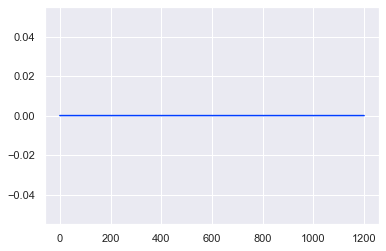

In [118]:
plt.plot(parity_E)

In [40]:
np.array(X010.parities)[X010.select_q({'N':1},parity='+')]

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [38]:
X010.evals0[X010.select_q({'N':1},parity='+')]

array([7316.81479, 7316.92707, 7317.04005, 7320.16263, 7320.23306,
       7320.30326, 7320.37321, 7320.44287, 7388.74287, 7388.78421,
       7388.82802, 7390.86796])

In [33]:
X010.evecs0[X010.select_q({'N':1},parity='+')].shape

(12, 24)

In [22]:
Bz = np.linspace(1e-3,50,1000)
Ez = np.linspace(0,1000,1000)

Text(0.5, 1.0, 'G=3 Stark Shifts')

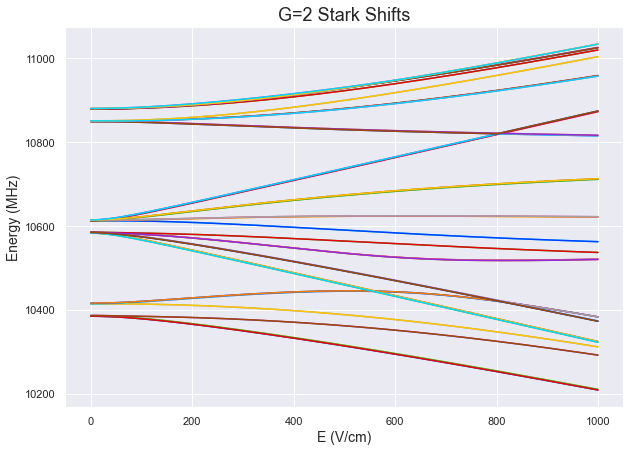

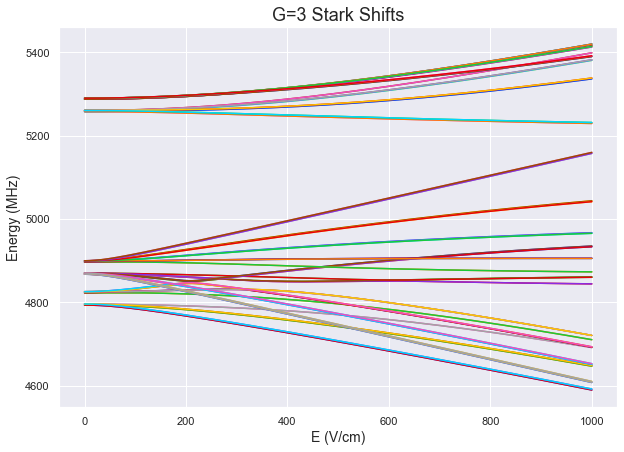

In [23]:
X010.StarkMap(Ez,1e-3,plot=True,idx = X010.select_q({'G':2}))
plt.title('G=2 Stark Shifts',fontsize=18)
X010.StarkMap(Ez,1e-3,plot=True,idx = X010.select_q({'G':3}))
plt.title('G=3 Stark Shifts',fontsize=18)

Text(0.5, 1.0, 'G=0 Zeeman Shifts')

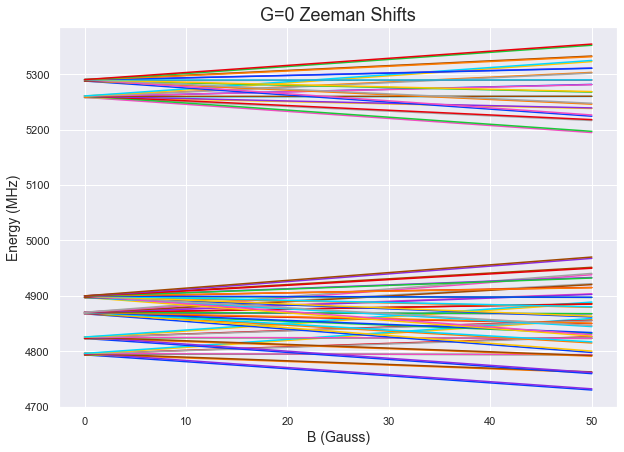

In [24]:
X010.ZeemanMap(Bz,0,plot=True,idx = X010.select_q({'G':3}))
plt.title('G=0 Zeeman Shifts',fontsize=18)

Text(0.5, 1.0, 'G=1 Zeeman Shifts')

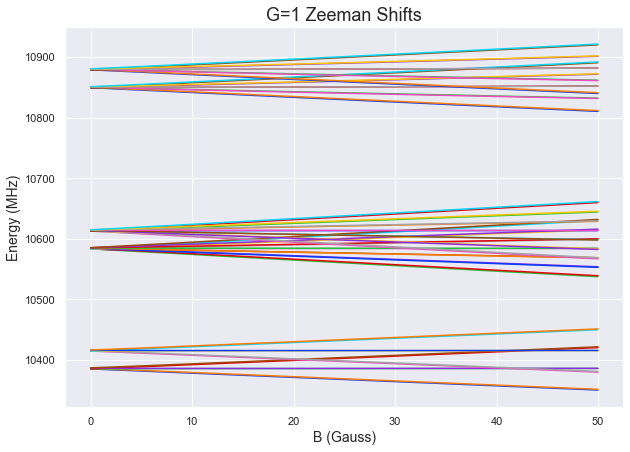

In [25]:
X010.ZeemanMap(Bz,0,plot=True,idx = X010.select_q({'G':2}))
plt.title('G=1 Zeeman Shifts',fontsize=18)

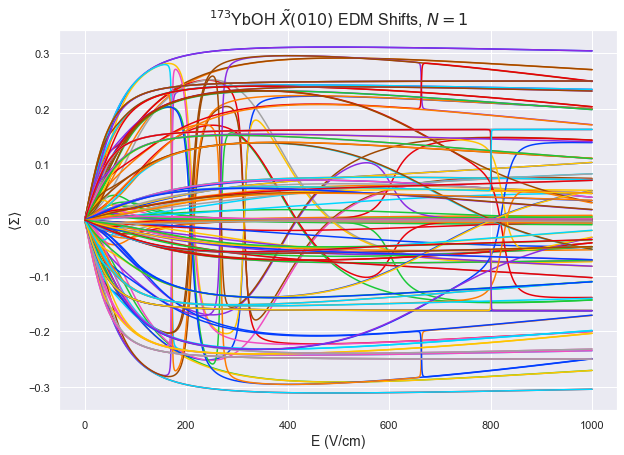

In [41]:
X010.PTV_Map('EDM',E_or_B='E',plot=True)

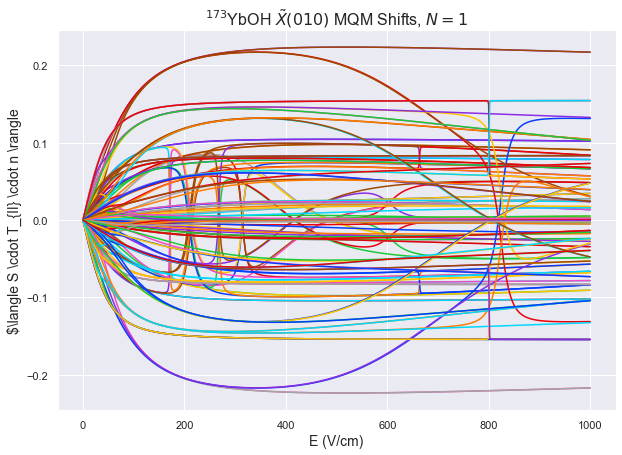

In [35]:
X010.PTV_Map('MQM',E_or_B='E',plot=True)

In [28]:
X010.g_eff_Map(step=1e-6);

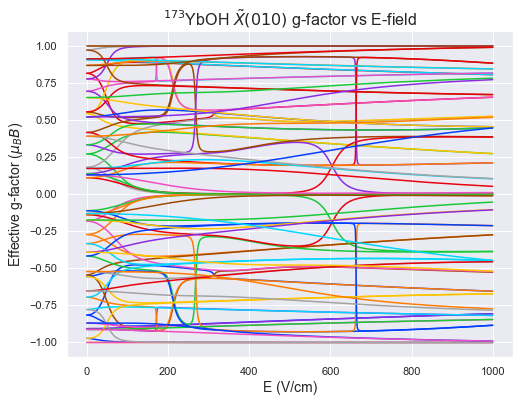

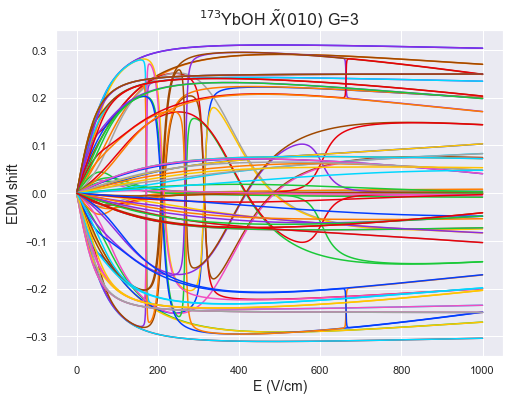

In [44]:
qd={'G':3}
plt.figure(figsize=(8,6))
for i in X010.select_q(qd):#range(len(X010_174.g_eff_E.T)):
#     if abs(X010.PTV_E.T[i]).mean()<0.05:
#         continue
    plt.plot(Ez,X010.g_eff_E.T[i])
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel(r'Effective g-factor ($\mu_B B$)',fontsize=14)
plt.title(X010.state_str + ' g-factor vs E-field',fontsize=16);
plt.figure(figsize=(8,6))
for i in X010.select_q(qd):#range(len(X010_174.PTV_E.T)):
#     if abs(X010.PTV_E.T[i]).mean()<0.05:
#         continue
    plt.plot(Ez,X010.PTV_E.T[i])
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('EDM shift',fontsize=14)
plt.title(X010.state_str+' G={}'.format(qd['G'][0]),fontsize=16);

Text(0.5, 1.0, '$^{173}$YbOH $\\tilde{X}(010)$ MQM Shifts, G=3, E=300 V/cm')

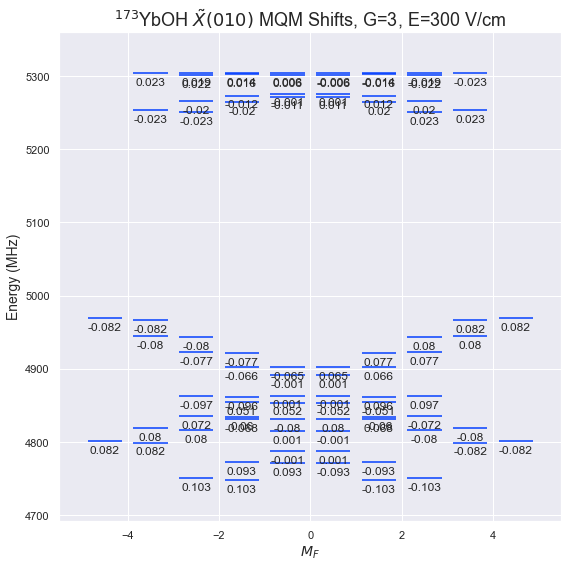

In [62]:
X010.display_PTV(300,1e-4,'MQM',idx=X010.select_q({'G':3}),round=3)
# plt.ylim(10300,10500)
plt.xlim(-5.5,5.5)
plt.title(X010.state_str + ' MQM Shifts, G=3, E=300 V/cm',fontsize=18)

(-2.5, 2.5)

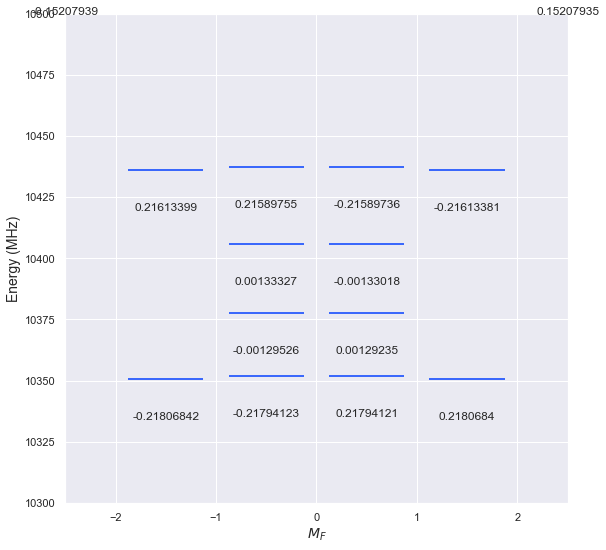

In [52]:
X010.display_PTV(300,1e-3,'MQM',idx=X010.select_q({'G':2}))
plt.ylim(10300,10500)
plt.xlim(-2.5,2.5)

Text(0.5, 1.0, 'CaOH X(010) N=2+,J=3/2 Zeeman Shifts')

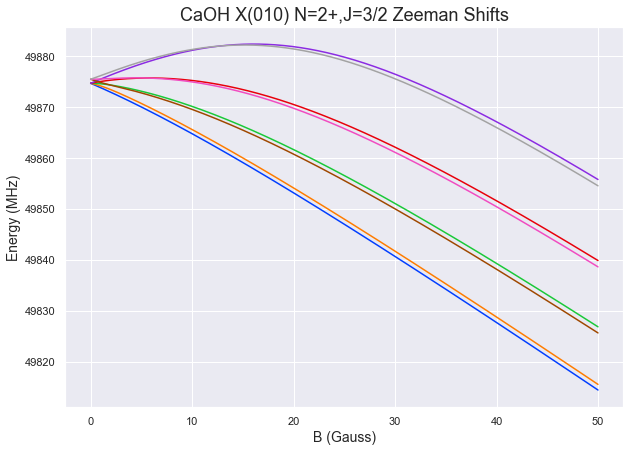

In [243]:
X010.ZeemanMap(Bz,0,plot=True,idx = X010.select_q({'N':2,'J':1.5},parity='+'))
plt.title('CaOH X(010) N=2+,J=3/2 Zeeman Shifts',fontsize=18)

In [56]:
B0 = 9
E0 = 150
evals, evecs = X010.eigensystem(E0,B0,order=True,method='torch')
M0_idx = X010.select_q({'N':1,})
print(M0_idx)
print('\n')
for i in M0_idx:
    display(Latex('$E = '+str(np.round(X010.evals0[i],4))+r'\:\mathrm{MHz}$'))
    print('Decoupled:')
    display(Latex(X010.gen_state_str(i,basis='decoupled',thresh=0.05,label_q=['K','M_N','M_S','M_I','M_F'],round=4)))
#     print('Case A:')
#     display(Latex(X010.gen_state_str(i,basis='aBJ',thresh=0.05,label_q=['K','J','F','Sigma','P','M'],round=4)))
    print('Case B:')
    print('Parity=',X010.parities[i])
    display(Latex(X010.gen_state_str(i,thresh=0.0005,round=4)))
    print('\n')

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]




<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

In [282]:
E0=50
B0=1e-4
TDM0 = 1.465*Calculate_TDMs(0,N1,N2,E0,B0,[0])
# TDMp = 1.465*Calculate_TDMs(1,X010,X010,E0,B0)
# TDMm = 1.465*Calculate_TDMs(-1,X010,X010,E0,B0)
# TDMx = -1/np.sqrt(2)*(TDMp - TDMm)

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ


In [283]:
def l2s(inputlist):
      """
      Convert a flatten list to a list of slices:
      test = [0,2,3,4,5,6,12,99,100,101,102,13,14,18,19,20,25]
      list_to_slices(test)
      -> [(0, 0), (2, 6), (12, 14), (18, 20), (25, 25), (99, 102)]
      """
      inputlist.sort()
      pointers = np.where(np.diff(inputlist) > 1)[0]
      pointers = zip(np.r_[0, pointers+1], np.r_[pointers, len(inputlist)-1])
      slices = [(inputlist[i], inputlist[j]+1) for i, j in pointers]
      return slices

In [286]:
N1_all = N1.select_q({'N':1,'F':0},parity='-')
N2_all = N2.select_q({'N':2,'M':0},parity='+')

In [289]:
N2s

(4, 5)

C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_20532/4255074159.py:40: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = fig.colorbar(mat, ax=ax,fraction=0.015, pad=0.05)


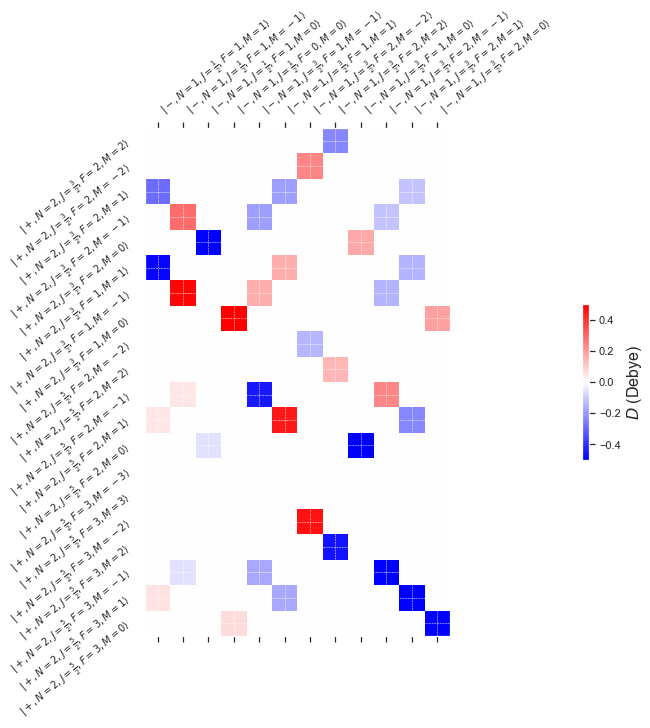

In [290]:
fig,ax = plt.subplots(figsize=(10,10),constrained_layout=True)
# ax.set_aspect('equal')
N1_all = N1.select_q({'N':1},parity='-')
N2_all = N2.select_q({'N':2},parity='+')
N1s = l2s(N1_all)[0]
N2s = l2s(N2_all)[0]
N1l = np.arange(*N1s)
N2l = np.arange(*N2s)
log=False
BR_plot = TDM0 #convert MHz/V/cm to Debye
if log:
    BR_plot=np.log10(BR_plot)
    vmin = -10
    vmax = 0
else:
    vmin=None
    vmax = None
#     log_BR = np.copy(BR0)
#     for i,val1 in enumerate(log_BR):
#         for j,val2 in enumerate(val1):
#             if val2 !=0:
#                 log_BR[i,j] = np.log10(val2)
#     BR_plot = log_BR
mat = ax.matshow(BR_plot[slice(*N2s),slice(*N1s)],cmap=plt.get_cmap('bwr'),vmax = 0.5, vmin = -0.5)
y = np.arange(0,len(N2l))
x = np.arange(0,len(N1l))
ax.set_yticks(y)
ax.set_xticks(x)
y_labels = [N2.gen_state_str(i,thresh=0.2,single=True,parity=True,show_coeff=False, label_q=['N','J','F','M']) for i in N2l]
x_labels = [N1.gen_state_str(i,thresh=0.2,single=True,parity=True,show_coeff=False, label_q=['N','J','F','M']) for i in N1l]
# x_labels = [X010.gen_state_str(i,thresh=0.3,single=True,parity=False,show_coeff=True, basis='decoupled',label_q=['K','M_N','M_S','M_F'],round=2) for i in N2]
# y_labels = [X010.gen_state_str(i,thresh=0.3,single=True,parity=False,show_coeff=True, basis='decoupled',label_q=['K','M_N','M_S','M_F'],round=2) for i in N1]
ax.set_yticklabels(y_labels, rotation='40', fontsize=12, ha='right')
ax.set_xticklabels(x_labels, rotation='40', fontsize=12,ha='left')
ax.tick_params(axis='both',labelsize=10,direction='out')
ax.grid(True,which='major',color='white',ls='--',linewidth=0.5)
ax.grid(False,which='minor')
(bot,top) = ax.get_ylim()
# ax.set_ylim(bot+0.5, top-0.5)
cbar = fig.colorbar(mat, ax=ax,fraction=0.015, pad=0.05)
cbar.set_label(label=r'$D$ (Debye)',size=16)
#ax.set_xlim(-0.5,x.size+0.5);

C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_3440/1571935017.py:41: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = fig.colorbar(mat, ax=ax,fraction=0.03, pad=0.0,extend='min')


Text(0.5, 1.0, '$|D|$ (Debye)')

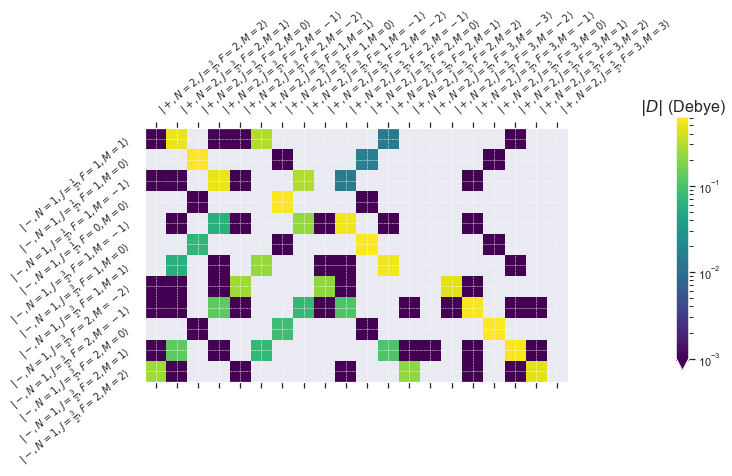

In [18]:
fig,ax = plt.subplots(figsize=(10,10),constrained_layout=True)
# ax.set_aspect('equal')
N1_all = X010.select_q({'N':1},parity='-')
N2_all = X010.select_q({'N':2},parity='+')
N1s = l2s(N1_all)[0]
N2s = l2s(N2_all)[0]
N1 = np.arange(*N1s)
N2 = np.arange(*N2s)
log=False
BR_plot = abs(TDM0)
BR_plot[BR_plot<1e-8]=0
if log:
    BR_plot=np.log10(BR_plot)
    vmin = -10
    vmax = 0
else:
    vmin=None
    vmax = None
#     log_BR = np.copy(BR0)
#     for i,val1 in enumerate(log_BR):
#         for j,val2 in enumerate(val1):
#             if val2 !=0:
#                 log_BR[i,j] = np.log10(val2)
#     BR_plot = log_BR
mat = ax.matshow(BR_plot[slice(*N1s),slice(*N2s)],cmap=sns.color_palette("viridis", as_cmap=True),norm=colors.LogNorm(vmin=1e-3))#vmax = vmax, vmin = -3)
x = np.arange(0,len(N2))
y = np.arange(0,len(N1))
ax.set_yticks(y)
ax.set_xticks(x)
x_labels = [X010.gen_state_str(i,thresh=0.2,single=True,parity=True,show_coeff=False, label_q=['N','J','F','M']) for i in N2]
y_labels = [X010.gen_state_str(i,thresh=0.2,single=True,parity=True,show_coeff=False, label_q=['N','J','F','M']) for i in N1]
# x_labels = [X010.gen_state_str(i,thresh=0.3,single=True,parity=False,show_coeff=True, basis='decoupled',label_q=['K','M_N','M_S','M_F'],round=2) for i in N2]
# y_labels = [X010.gen_state_str(i,thresh=0.3,single=True,parity=False,show_coeff=True, basis='decoupled',label_q=['K','M_N','M_S','M_F'],round=2) for i in N1]
ax.set_yticklabels(y_labels, rotation='40', fontsize=12, ha='right')
ax.set_xticklabels(x_labels, rotation='40', fontsize=12,ha='left')
ax.tick_params(axis='both',labelsize=10,direction='out')
ax.grid(True,which='major',color='white',ls='--',linewidth=0.5)
ax.grid(False,which='minor')
(bot,top) = ax.get_ylim()
# ax.set_ylim(bot+0.5, top)
cbar = fig.colorbar(mat, ax=ax,fraction=0.03, pad=0.0,extend='min')
cbar.ax.set_title(label=r'$|D|$ (Debye)',size=16,rotation=0)
#ax.set_xlim(-0.5,x.size+0.5);

In [13]:
from tabulate import tabulate

In [135]:
plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_B.T[N2]):
    plt.plot(Bz,trace)
plt.xlabel('B (G)',fontsize=14)
plt.ylabel('Energy (MHz)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Zeeman Shifts, $N=2-$',fontsize=16);
plt.ylim(49865,49885)

plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T[N1]):
    grad = np.gradient(trace)/(Ez[1]-Ez[0])
    plt.plot(Bz,grad)
plt.xlabel('B (G)',fontsize=14)
plt.ylabel('Polarization (MHz/Volts)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Magnetization, $N=2-$',fontsize=16);

AttributeError: 'NoneType' object has no attribute 'T'

<Figure size 720x504 with 0 Axes>

(9900.0, 10090.0)

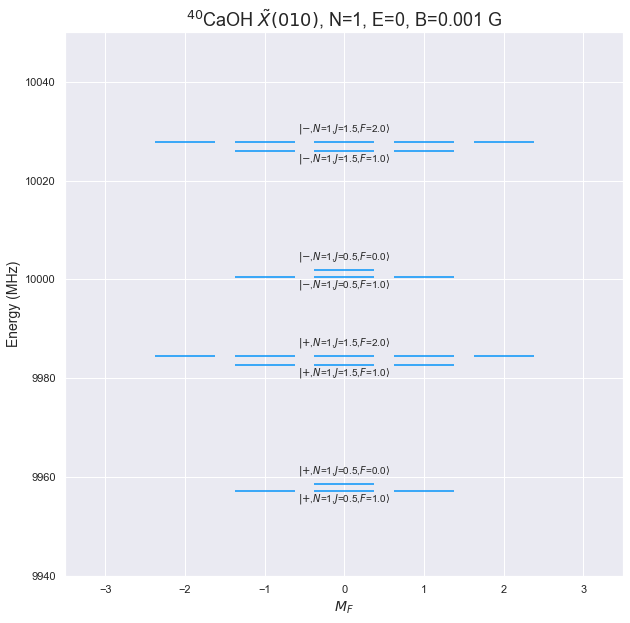

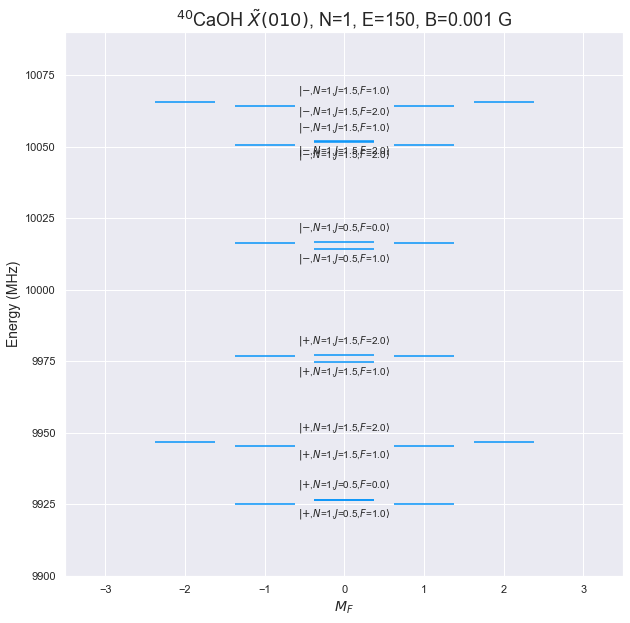

In [57]:
E0=0
B0=1e-3
N=1
X010.display_levels(E0,B0,'F',idx=N_idx[N-1],parity=True,label_q=[q for q in X010.q_str if q!='K'],figsize=(10,10),alt_label=True)
plt.title(X010.state_str+', N={}, E={}, B={} G'.format(N,E0,B0),fontsize=18)
plt.xlim(-3.5,3.5)
plt.ylim(9940,10050)

E0=150
B0=1e-3
N=1
X010.display_levels(E0,B0,'F',idx=N_idx[N-1],parity=True,label_q=[q for q in X010.q_str if q!='K'],figsize=(10,10),alt_label=True)
plt.title(X010.state_str+', N={}, E={}, B={} G'.format(N,E0,B0),fontsize=18)
plt.xlim(-3.5,3.5)
plt.ylim(9900,10090)

# N=2
# X010.display_levels(E0,B0,'F',idx=N_idx[N-1],parity=True,label_q=[q for q in X010.q_str if q!='K'],figsize=(10,10),alt_label=True)
# plt.title(X010.state_str+', N={}, E={} V/cm, B={} G'.format(N,E0,B0),fontsize=18)
# plt.xlim(-3.5,3.5)

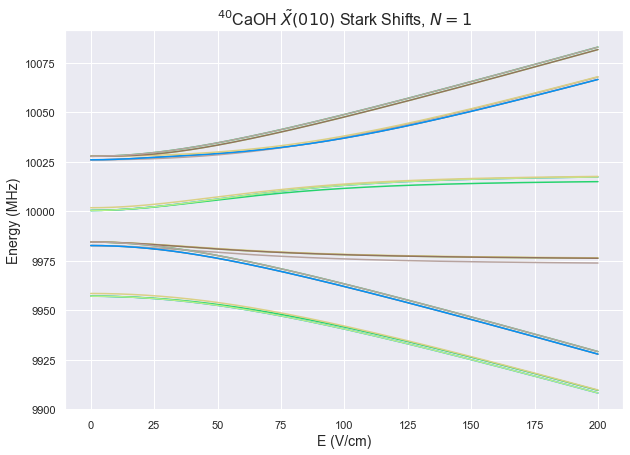

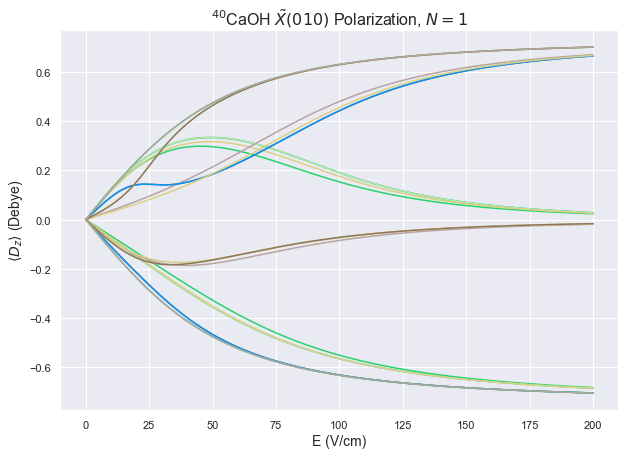

In [133]:
plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T[N_idx[0]]):
    plt.plot(Ez,trace)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('Energy (MHz)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Stark Shifts, $N=1$',fontsize=16);

plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T[N_idx[0]]):
    grad = np.gradient(trace)/(Ez[1]-Ez[0])
    plt.plot(Ez,grad*1.986)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel(r'$\langle D_z \rangle$ (Debye)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Polarization, $N=1$',fontsize=16);

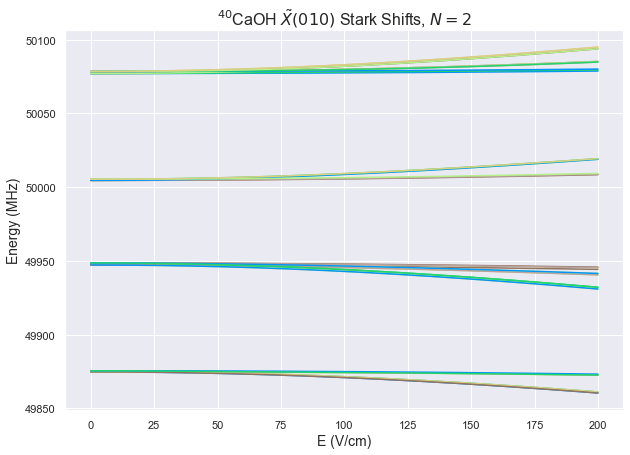

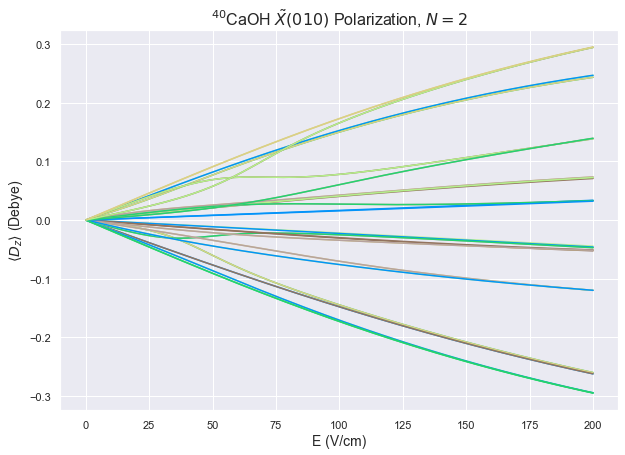

In [134]:
plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T[N_idx[1]]):
    plt.plot(Ez,trace)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('Energy (MHz)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Stark Shifts, $N=2$',fontsize=16);

plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T[N_idx[1]]):
    grad = np.gradient(trace)/(Ez[1]-Ez[0])
    plt.plot(Ez,grad*1.986)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel(r'$\langle D_z \rangle$ (Debye)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Polarization, $N=2$',fontsize=16);

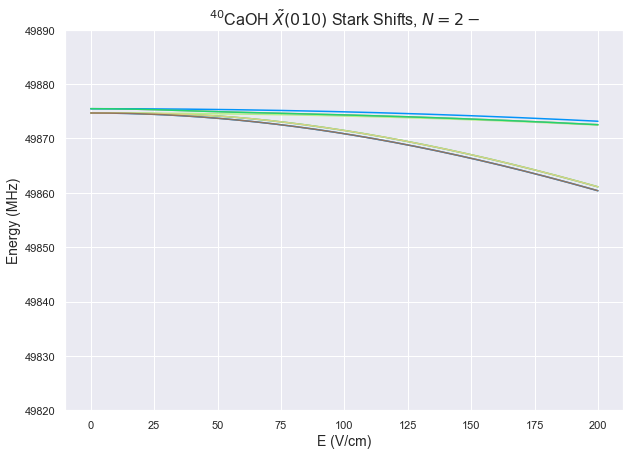

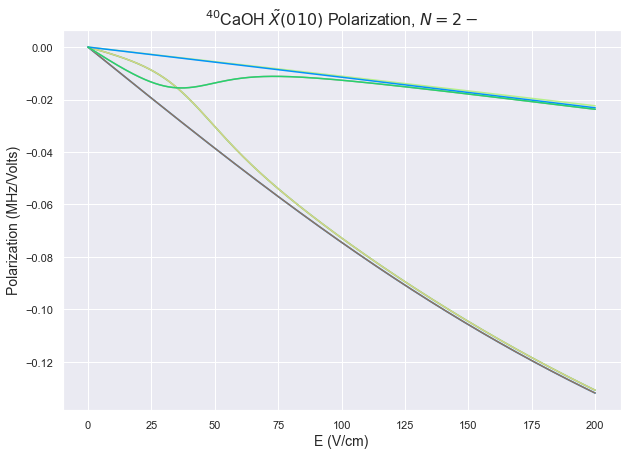

In [135]:
plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T[N2_all]):
    plt.plot(Ez,trace)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('Energy (MHz)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Stark Shifts, $N=2-$',fontsize=16);
plt.ylim(49820,49890)

plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T[N2_all]):
    grad = np.gradient(trace)/(Ez[1]-Ez[0])
    plt.plot(Ez,grad)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('Polarization (MHz/Volts)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Polarization, $N=2-$',fontsize=16);

In [36]:
X010.display_levels(0,1e-6,'F',idx=N1_all,label_q=[q for q in X010.q_str if q!='K'],alt_label=True)
plt.title(X010.state_str+', N=1d',fontsize=18)

Text(0.5, 1.0, '$^{40}$CaOH $\\tilde{X}(010)$, N=1,2, Free Field')

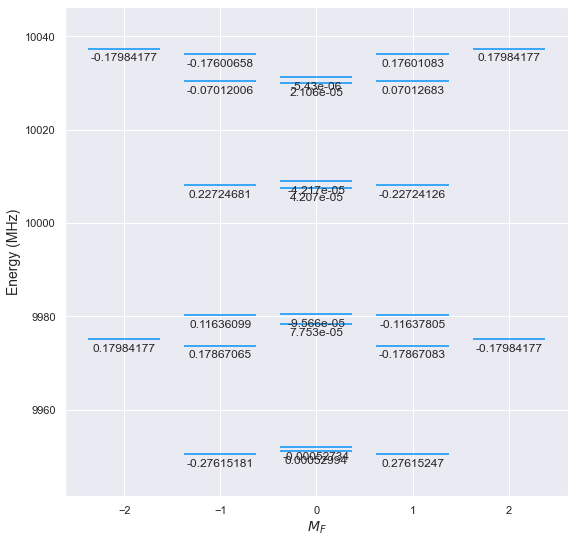

In [130]:
# X010 = MoleculeLevels.initialize_state('CaOH','40','X010',N_list,M_values = 'custom',I=[0,1/2],S=1/2,round=16,M_range=[1])
X010 = MoleculeLevels.initialize_state('CaOH','40','X010',[1],M_values = 'all',I=[0,1/2],S=1/2,round=8)
X010.display_PTV(60.8,1e-3,'EDM')

Text(0.5, 1.0, '$^{40}$CaOH $\\tilde{X}(010)$, N=1,2 60 V/cm, 1e-06 G')

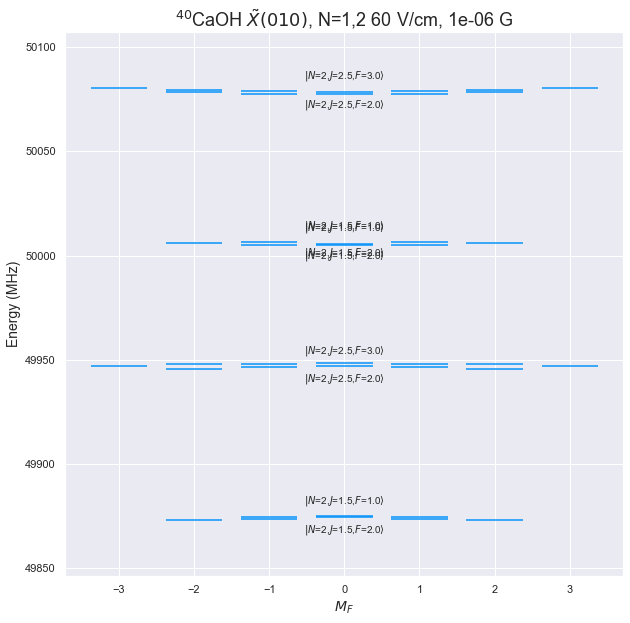

In [14]:
Efield = 60
Bfield = 1e-6
X010.display_levels(Efield,Bfield,'F',idx=N2,label_q=[q for q in X010.q_str if q!='K'],alt_label=True)
plt.title(X010.state_str+', N=1,2 {} V/cm, {} G'.format(Efield,Bfield),fontsize=18)

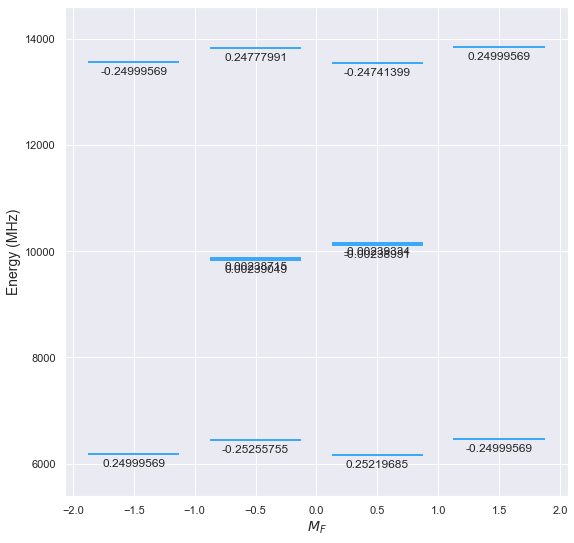

In [41]:
X010.display_PTV(,'EDM')

In [34]:
evals, evecs = X010.eigensystem(Efield,Bfield,order=True,method='torch')
M0_idx = X010.select_q({'M':[-3/2,-1/2,1/2,3/2]})
print(M0_idx)
print('\n')
for i in M0_idx:
    display(Latex('$E = '+str(np.round(X010.evals0[i],4))+r'\:\mathrm{MHz}$'))
    print('Decoupled:')
    display(Latex(X010.gen_state_str(i,basis='decoupled',thresh=0.05,label_q=['K','M_N','M_S','M_I','M_F'],round=4)))
    print('Case A:')
    display(Latex(X010.gen_state_str(i,basis='aBJ',thresh=0.05,label_q=['K','J','F','Sigma','P','M'],round=4)))
    print('Case B:')
    display(Latex(X010.gen_state_str(i,thresh=0.05,round=4)))
    print('\n')

[ 0  1  2  3  4  5  6  7  8  9 10 11]




<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

In [117]:
evals, evecs = X010.eigensystem(1000,1e-8,order=True,method='torch')
M0_idx = X010.select_q({'M':[0]})
print(M0_idx)
print('\n')
for i in M0_idx:
    display(Latex('$E = '+str(np.round(X010.evals0[i],4))+r'\:\mathrm{MHz}$'))
    print('Decoupled:')
    display(Latex(X010.gen_state_str(i,basis='decoupled',thresh=0.01,label_q=['K','M_N','M_S','M_I','M_F'],round=4)))
    print('Case A:')
    display(Latex(X010.gen_state_str(i,basis='aBJ',thresh=0.01,label_q=['J','K','Sigma','P','M'],round=4)))
    print('Case B:')
    display(Latex(X010.gen_state_str(i,thresh=0.01,round=4)))
    print('\n')

[ 2  3  8 11 12 15 18 19]




<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

In [42]:
Bz = np.linspace(1e-6,40,1000)
Ez = np.linspace(0,500,1000)

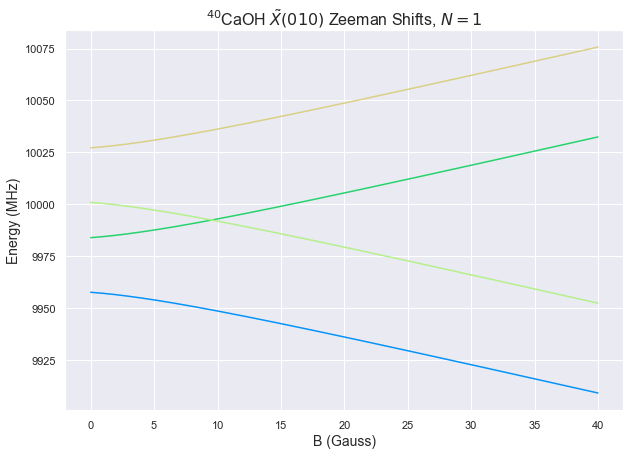

In [75]:
X010.ZeemanMap(Bz,0,plot=True)

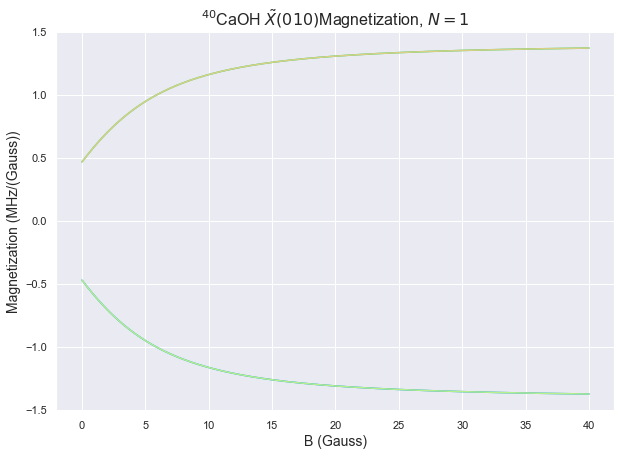

In [76]:
plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_B.T):
    grad = np.gradient(trace)/(Bz[1]-Bz[0])
    plt.plot(Bz,grad)
plt.xlabel('B (Gauss)',fontsize=14)
plt.ylabel('Magnetization (MHz/(Gauss))',fontsize=14)
plt.title(X010.state_str + r'Magnetization, $N={}$'.format(*X010.N_range),fontsize=16);

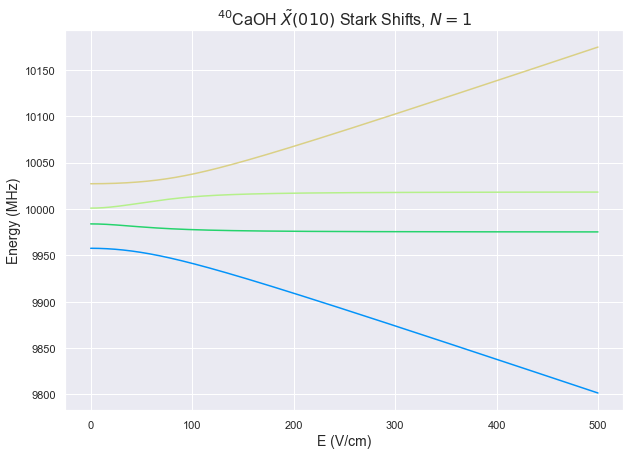

In [78]:
X010.StarkMap(Ez,1e-6,plot=True)
# X010.plot_evals_EB('E',kV_kG=True,GHz=True)

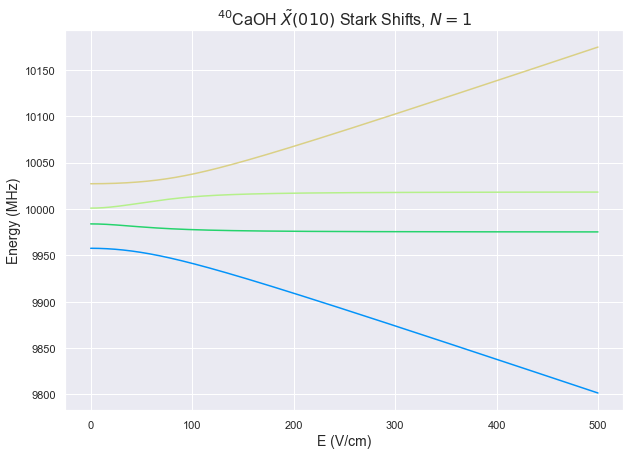

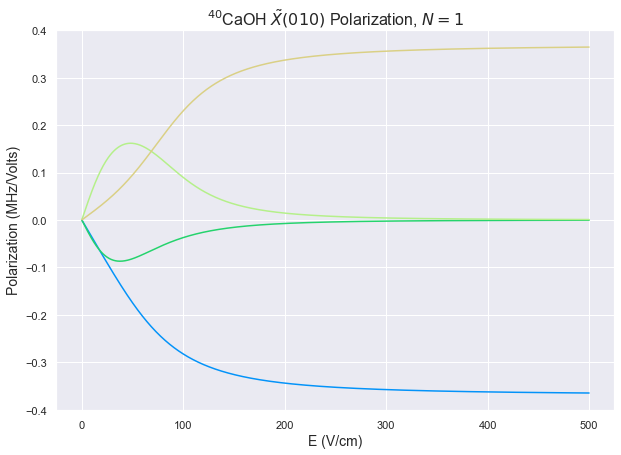

In [98]:
plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T):
    plt.plot(Ez,trace)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('Energy (MHz)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Stark Shifts, $N=1$',fontsize=16);

plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T):
    grad = np.gradient(trace)/(Ez[1]-Ez[0])
    plt.plot(Ez,grad)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('Polarization (MHz/Volts)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Polarization, $N=1$',fontsize=16);

We can display a plot of the energy levels at arbitray field. (The code does not handle parity labeling well, so I am leaving out L for zero field.)

Text(0.5, 1.0, '$^{40}$CaOH $\\tilde{X}(010)$, N=1, 0.5 kV/cm')

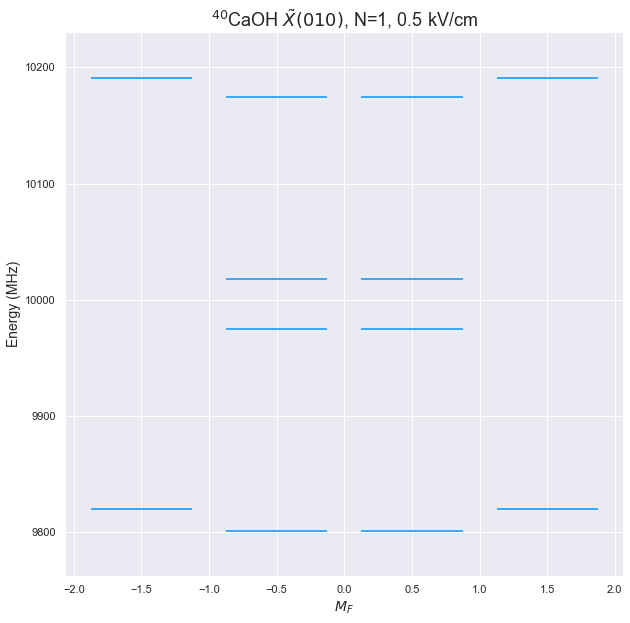

In [47]:
X010.display_levels(500,1e-7,'F',label=None,alt_label=True)
plt.title(X010.state_str+', N=1, 0.5 kV/cm',fontsize=18)

We can also look at PT violating shifts. Here, we consider the EDM shifts as a function of E field. 

In [48]:
X010.eigensystem(0,1e-8);

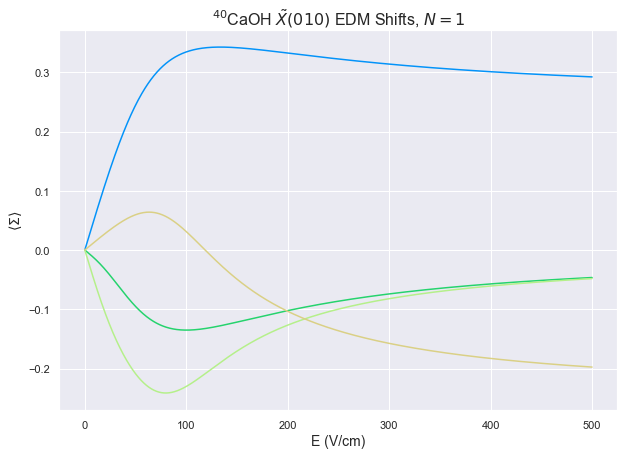

In [85]:
X010.PTV_Map('EDM',E_or_B='E',plot=True)

We can look specifically at the upper and lower Stark manifolds at a given field value too.

Text(0.5, 1.0, '$^{40}$CaOH $\\tilde{X}(010)$, EDM shifts at 60.8 V/cm')

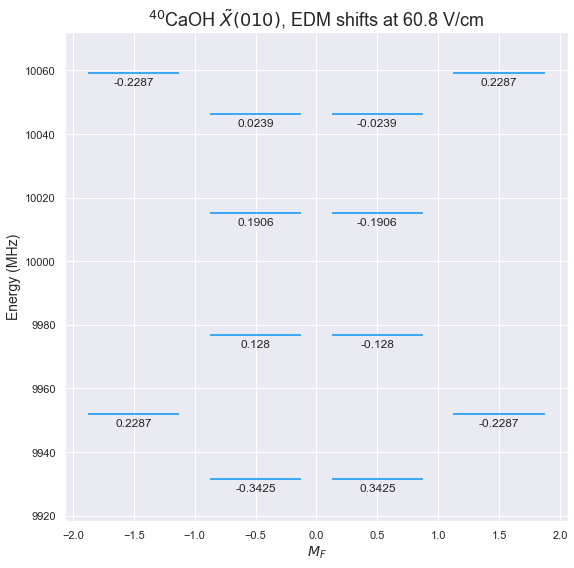

In [51]:
X010.display_PTV(133,1e-7,'EDM',round=4)
plt.title(X010.state_str+', EDM shifts at 60.8 V/cm',fontsize=18)

In [60]:
X010.eigensystem(1000,0)
M0_idx = X010.select_q({'M':[1]})
print(M0_idx)
print('\n')
for i in M0_idx:
    display(Latex('$E = '+str(np.round(X010.evals0[i],4))+r'\:\mathrm{MHz}$'))
    print('Decoupled:')
    display(Latex(X010.gen_state_str(i,basis='decoupled',thresh=0.01,label_q=['K','M_N','M_S','M_I','M_F'],round=4)))
    print('Case A:')
    display(Latex(X010.gen_state_str(i,basis='aBJ',thresh=0.01,label_q=['K','Sigma','P','M'],round=4)))
    print('Case B:')
    display(Latex(X010.gen_state_str(i,thresh=0.01,round=4)))
    print('\n')

[0 1 2 3 4 5]




<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

In [50]:
X010.eigensystem(100,1e-2)
(sy.Matrix(X010.evecs0[0]).T*X010.H_symbolic*sy.Matrix(X010.evecs0[0]))[0]

-0.048487643331535*Bz - 0.277154404334809*Ez + 9969.35364112334

In [43]:
(sy.Matrix(X010.evecs0[1]).T*X010.H_symbolic*sy.Matrix(X010.evecs0[1]))[0]

1.28069264538709*Bz - 0.368490639112473*Ez + 9987.63731699745

In [257]:
import matrix_elements_sym as me
from functools import partial
from matrix_elements_sym import decouple_b_even

def H_even_X(q_numbers,params,matrix_elements,symbolic=True,E=0,B=0,M_values='all',precision=5):
    q_str = list(q_numbers)     # Get keys for quantum number dict
    if symbolic:
        Ez,Bz = sy.symbols('E_z B_z')
        size = len(q_numbers[q_str[0]])
        # Need to construct empty matrices to fill with matrix elements
        # Sympy does not like numpy arrays, so convert to list
        H0 = np.zeros((size,size)).tolist()
        V_B = np.zeros((size,size)).tolist()
        V_E = np.zeros((size,size)).tolist()
        #Iz = np.zeros((size,size)).tolist()
        #Sz = np.zeros((size,size)).tolist()
        for i in range(size):
            for j in range(size):
                # State out is LHS of bra ket, state in is RHS
                state_out = {q+'0':q_numbers[q][i] for q in q_str}
                state_in = {q+'1':q_numbers[q][j] for q in q_str}
                q_args = {**state_out,**state_in}
                elements = {term: sy.nsimplify(element(**q_args)) for term, element in matrix_elements.items()}
                # The Hamiltonian
                H0[i][j] = params['Be']*elements['N^2'] + params['Gamma_SR']*elements['N.S'] + \
                    params['bF']*elements['I.S'] + params['c']/3*sy.sqrt(6)*elements['T2_0(I,S)']
                if params.get('q_lD') is not None:
                    H0[i][j] += params['p_lD']*elements['l doubling p'] - params['q_lD']*elements['l doubling q'] -params['Gamma_SR']*elements['NzSz']+params['Gamma_Prime']*elements['NzSz'] #old: params['q_lD']/2*elements['l-doubling']
                if M_values!='none':
                    V_B[i][j]+=params['g_S']*params['mu_B']*elements['ZeemanZ']
                    V_E[i][j]+=-params['muE']*elements['StarkZ']
                # H[i][j] = round(H[i][j],precision)
                #Iz[i][j] = params['c']*elements['Iz']
                #Sz[i][j] = elements['Sz']
        # Need to construct IzSz term and add to Hamiltonian
        #H=matadd(H,matmult(Iz,Sz))
        # Create symbolic object
        H_symbolic = sy.Matrix(H0)+Ez*sy.Matrix(V_E)+Bz*sy.Matrix(V_B)
#         H0_num = np.array(H0).astype(np.float64)
#         V_E_num = np.array(V_E).astype(np.float64)
#         V_B_num = np.array(V_B).astype(np.float64)
        # Use symbolic object to create function that given E and B values, returns a numpy array
#         H_func = lambda E,B: H0_num + V_E_num*E + V_B_num*B
        # H_func = sy.lambdify((Ez,Bz), H_symbolic, modules='numpy')
        return H_symbolic

def decouple_b(input_qnumbers,output_qnumbers,S=1/2,I=1/2):
    input_keys = list(input_qnumbers)
    output_keys = list(output_qnumbers)
    input_size = len(input_qnumbers[input_keys[0]])
    output_size = len(output_qnumbers[output_keys[0]])
    basis_matrix = np.zeros((output_size,input_size)).tolist()
    for i in range(output_size):
        for j in range(input_size):
            decoupled_qnumbers = {q:output_qnumbers[q][i] for q in output_keys}
            b_qnumbers = {q:input_qnumbers[q][j] for q in input_keys}
            basis_matrix[i][j] = sy.nsimplify(decouple_b_even(decoupled_qnumbers,b_qnumbers,S=S,I=I))
    return basis_matrix
   
    

bBJ_even_X_matrix_elements={
        # Fine Structure
        'N^2': me.Rot_bBJ,                 # N^2 Rotation
        'N.S': me.SR_bBJ,                  # N.S Spin Rotation
        'l-doubling': me.lD_bBJ,           # Effective l doubling
        'l doubling p':me.p_lD_bBJ,
        'l doubling q':me.q_lD_bBJ,
        'NzSz': me.NzSz_bBJ,               # NzSz for bending mode

        # Hydrogen Hyperfine
        'I.S': me.IS_bBJ,                  # I.S Fermi Contact Interaction
        'T2_0(I,S)': me.T2IS_bBJ,          # I S dipolar interaction
        'Iz': me.Iz_bBJ,                   # I.n projection of I on internuclear axis n
        'Sz': me.Sz_bBJ,                   # S.n projection of S on internuclear axis n
        }

ext_fields = {
# External Fields
'ZeemanZ': me.ZeemanZ_bBJ,         # Zeeman interaction with lab z magnetic field
'StarkZ': me.StarkZ_bBJ            # Stark interaction with lab z electric field
}
bBJ_even_X_matrix_elements.update(ext_fields)
for term,element in bBJ_even_X_matrix_elements.items():       #iterate through, substitute hydrogen proton value
            bBJ_even_X_matrix_elements[term] = partial(element,I=1/2)

        

B,gamma,gammap, bF,c,b,q_lD,p_lD,muE,muB,g_S,g_L = sy.symbols('B_{rot} gamma gamma^\' b_F c b q_{lD} p_{lD} D mu_B g_S g_L')
params_40X010 = {
'Be': B,
'Gamma_SR': gamma,
'Gamma_Prime': gammap,
'bF': 0,
'c': 0,
'b': b,
'q_lD': q_lD,
'p_lD': p_lD,
'muE': muE,
'mu_B': muB, #MHz/Gauss
'g_S': g_S,
'g_L': g_L,
}

def build_operator(q_numbers,parameter,operator_element,M_values='all',precision=5):
    q_str = list(q_numbers)     # Get keys for quantum number dict
    size = len(q_numbers[q_str[0]])
    # Need to construct empty matrices to fill with matrix elements
    # Sympy does not like numpy arrays, so convert to list
    H0 = np.zeros((size,size)).tolist()
    #Iz = np.zeros((size,size)).tolist()
    #Sz = np.zeros((size,size)).tolist()
    for i in range(size):
        for j in range(size):
            # State out is LHS of bra ket, state in is RHS
            state_out = {q+'0':q_numbers[q][i] for q in q_str}
            state_in = {q+'1':q_numbers[q][j] for q in q_str}
            q_args = {**state_out,**state_in}
            operator = sy.nsimplify(operator_element(**q_args))
            H0[i][j]+= parameter*operator
    H_symbolic = sy.Matrix(H0)
    return H_symbolic

In [258]:
X010 = MoleculeLevels.initialize_state('YbOH','174','X010',[1],M_values = 'all',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2])
H_sym = H_even_X(X010.q_numbers,params_40X010,bBJ_even_X_matrix_elements,symbolic=True,E=0,B=0,M_values='all',precision=8)

In [259]:
(H_sym)

Matrix([
[            B_{rot} - gamma/2 - gamma^'/2,                        -p_{lD}/2 - q_{lD},                                                        0,                                                        0,                 -B_z*g_S*mu_B/6 + D*E_z/3,                                         0,                                                         0,                                                         0,                                                               0,                                                               0, -sqrt(2)*B_z*g_S*mu_B/3 + sqrt(2)*D*E_z/6,                                         0,                                                              0,                                                              0,                                                         0,                                                         0,                                                         0,                                                         0,     

In [23]:
NzSz = build_operator(X010.q_numbers,params_40X010['Gamma_Prime'],bBJ_even_X_matrix_elements['NzSz'],precision=8)
NS = build_operator(X010.q_numbers,params_40X010['Gamma_SR'],bBJ_even_X_matrix_elements['N.S'],precision=8)

In [24]:
NS-NzSz

Matrix([
[-gamma + gamma^'/2,                  0,                  0,                  0,                  0,                  0,                  0,                  0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0],
[                 0, -gamma + gamma^'/2,                  0,                  0,                  0,                  0,                  0,                  0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                  

In [25]:
inputt = X010.q_numbers
output = X010.alt_q_numbers['decoupled']
basis_matrix = sy.Matrix(decouple_b(inputt,output,I=1/2))

In [26]:
H_dcpl = basis_matrix*H_sym*basis_matrix.T

In [27]:
NzSz_dcpl = basis_matrix*NzSz*basis_matrix.T
NS_dcpl = basis_matrix*NS*basis_matrix.T

In [28]:
SR_dcpl = NS_dcpl-NzSz_dcpl

In [29]:
SR_dcpl

Matrix([
[gamma/2 - gamma^'/4,                   0,                   0,                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                   0,                   0,                   0,                   0],
[                  0, gamma/2 - gamma^'/4,                   0,                   0,                                   0,                                   0,                                   0,                                  

In [24]:
ilist = range(0,24)
for i in ilist:
    print(i)
    for k,v in X010.alt_q_numbers['decoupled'].items():
        print('{} = {}'.format(k,v[i]))

0
K = -1
N = 1
M_N = -1
M_S = -0.5
M_I = 0
M_F = -1.5
1
K = 1
N = 1
M_N = -1
M_S = -0.5
M_I = 0
M_F = -1.5
2
K = -1
N = 1
M_N = -1
M_S = 0.5
M_I = 0
M_F = -0.5
3
K = 1
N = 1
M_N = -1
M_S = 0.5
M_I = 0
M_F = -0.5
4
K = -1
N = 1
M_N = 0
M_S = -0.5
M_I = 0
M_F = -0.5
5
K = 1
N = 1
M_N = 0
M_S = -0.5
M_I = 0
M_F = -0.5
6
K = -1
N = 1
M_N = 0
M_S = 0.5
M_I = 0
M_F = 0.5
7
K = 1
N = 1
M_N = 0
M_S = 0.5
M_I = 0
M_F = 0.5
8
K = -1
N = 1
M_N = 1
M_S = -0.5
M_I = 0
M_F = 0.5
9
K = 1
N = 1
M_N = 1
M_S = -0.5
M_I = 0
M_F = 0.5
10
K = -1
N = 1
M_N = 1
M_S = 0.5
M_I = 0
M_F = 1.5
11
K = 1
N = 1
M_N = 1
M_S = 0.5
M_I = 0
M_F = 1.5
12


IndexError: list index out of range

In [25]:
vec = np.zeros(24)
vec[6] = 1/sy.sqrt(2) #
vec[17] = 1/sy.sqrt(2)

In [26]:
NS_dcpl-NzSz_dcpl

Matrix([
[gamma/4,       0,               0,               0,               0,               0,               0,               0,               0,               0,       0,       0],
[      0, gamma/4,               0,               0,               0,               0,               0,               0,               0,               0,       0,       0],
[      0,       0,        -gamma/4,               0, sqrt(2)*gamma/4,               0,               0,               0,               0,               0,       0,       0],
[      0,       0,               0,        -gamma/4,               0, sqrt(2)*gamma/4,               0,               0,               0,               0,       0,       0],
[      0,       0, sqrt(2)*gamma/4,               0,               0,               0,               0,               0,               0,               0,       0,       0],
[      0,       0,               0, sqrt(2)*gamma/4,               0,               0,               0,               0, 

In [27]:
H_dcpl=sy.simplify(H_dcpl)
H_dcpl

Matrix([
[-B_z*g_S*mu_B/2 + B_{rot} - D*E_z/2 + gamma/4,                                       -q_{lD},                                            0,                                            0,                         0,                         0,                        0,                        0,                                             0,                                             0,                                            0,                                            0],
[                                      -q_{lD}, -B_z*g_S*mu_B/2 + B_{rot} + D*E_z/2 + gamma/4,                                            0,                                            0,                         0,                         0,                        0,                        0,                                             0,                                             0,                                            0,                                            0],
[                              

In [135]:
X010.eigensystem(1000,0)
even = sy.Matrix([0,1/sy.sqrt(2),0,0,0,0,1/sy.sqrt(2),0])
odd = sy.Matrix([1/sy.sqrt(2),0,0,0,0,0,0,-1/sy.sqrt(2)])
x = sy.simplify(even.T*H_dcpl*even)
y = sy.simplify(odd.T*H_dcpl*odd)
x[0]

B_{rot} + D*E_z/2 + b_F/4 + c/60 - gamma/4

B_{rot} - D*E_z/2 + b_F/4 + c/60 - gamma/4

In [142]:
X010.eigensystem(1000,)
x = sy.Matrix(X010.evecs0[0]).T*H_sym*sy.Matrix(X010.evecs0[0])
y = sy.Matrix(X010.evecs0[1]).T*H_sym*sy.Matrix(X010.evecs0[1])
sy.N(x-y)[0]

-1.09823410572936e-11*B_z*g_S*mu_B + 3.74903172901661e-5*D*E_z - 0.00019018948895402*b_F - 0.0122648086400407*c - 5.8647193332706e-5*gamma + 0.00118230125639449*q_{lD}

In [42]:
X010.H_symbolic

Matrix([
[                           9980.21896666667,                                      21.649,         -0.4670780207227*Bz + 0.24583286*Ez,                                           0, -1.32109614318485*Bz + 0.173830082344483*Ez,                                           0,                                           0,                                           0],
[                                     21.649,                            9980.21896666667,                                           0,         -0.4670780207227*Bz - 0.24583286*Ez,                                           0, -1.32109614318485*Bz - 0.173830082344483*Ez,                                           0,                                           0],
[        -0.4670780207227*Bz + 0.24583286*Ez,                                           0,                            9978.89541111111,                                      21.649,                            1.14594510633293,                                          

In [17]:
X010.eigensystem(100000,0)
M0_idx = X010.select_q({'M':[0]})
print(M0_idx)
for i in M0_idx:
    print('E =',X010.evals0[i])
    display(Latex(X010.gen_state_str(i,basis='decoupled',thresh=0.001,label_q=['K','M_N','M_S','M_I','M_F'])))
#     display(Latex(X010.gen_state_str(i,basis='aBJ',thresh=0.05,label_q=['K','Sigma','P','M'])))
#     display(Latex(X010.gen_state_str(i,thresh=0.05)))

[0 1 2 3 4 5 6 7]
E = -26869.87053477218


<IPython.core.display.Latex object>

E = -26869.753213628093


<IPython.core.display.Latex object>

E = 9973.151313958582


<IPython.core.display.Latex object>

E = 10016.449292801037


<IPython.core.display.Latex object>

E = 10042.423225935365


<IPython.core.display.Latex object>

E = 10085.720997939427


<IPython.core.display.Latex object>

E = 46880.36769489169


<IPython.core.display.Latex object>

E = 46880.485222874166


<IPython.core.display.Latex object>

In [83]:
X010.eigensystem(0,1e-6)
X010.g_eff_Map(step=1e-6);

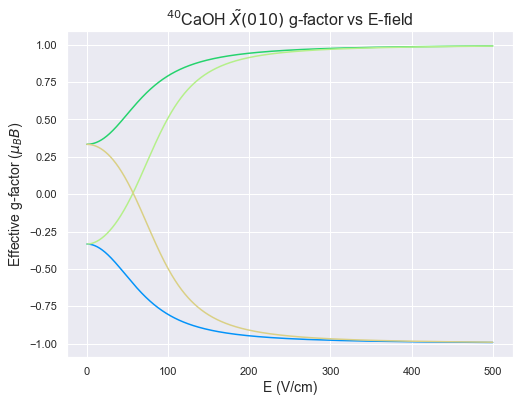

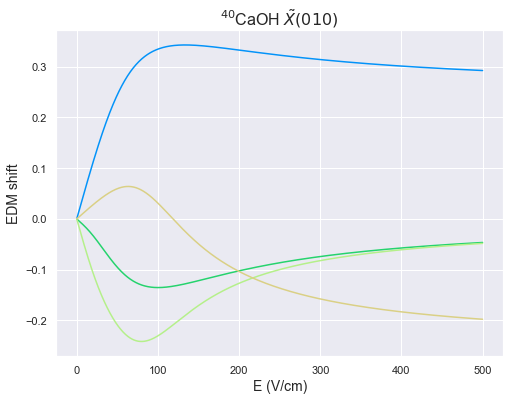

In [86]:
j = range(len(X010.evals0))
plt.figure(figsize=(8,6))
for i in range(len(X010.g_eff_E.T)):#range(len(X010_174.g_eff_E.T)):
    plt.plot(Ez,X010.g_eff_E.T[i])
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel(r'Effective g-factor ($\mu_B B$)',fontsize=14)
plt.title(X010.state_str + ' g-factor vs E-field',fontsize=16);
plt.figure(figsize=(8,6))
for i in range(len(X010.g_eff_E.T)):#range(len(X010_174.PTV_E.T)):
    plt.plot(Ez,X010.PTV_E.T[i])
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('EDM shift',fontsize=14)
plt.title(X010.state_str,fontsize=16);

In [81]:
X010.eigensystem(0,1e-6)
M_idx = X010.select_q({'M':[1/2]})
print(M_idx)

[0 1 2 3]


IndexError: index 4 is out of bounds for axis 0 with size 4

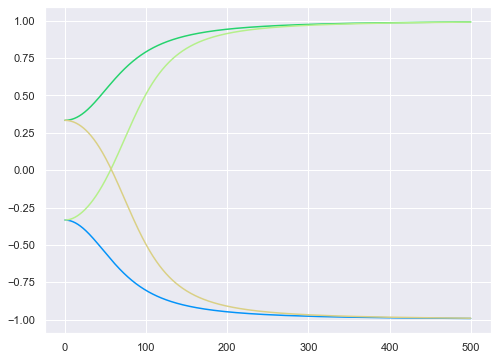

In [87]:
j = range(len(X010.evals0))
plt.figure(figsize=(8,6))
for i in range(10):#range(len(X010_174.g_eff_E.T)):
    plt.plot(Ez,X010.g_eff_E.T[i])
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel(r'Effective g-factor ($\mu_B B$)',fontsize=14)
plt.title(X010.state_str + ' g-factor vs E-field',fontsize=16);
plt.xlim(53,73)
plt.figure(figsize=(8,6))
for i in range(12):#range(len(X010_174.PTV_E.T)):
    plt.plot(Ez,X010.PTV_E.T[i])
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('EDM shift',fontsize=14)
plt.title(X010.state_str,fontsize=16);
plt.xlim(53,73);

In [175]:
for j in [12,18]:
    g_eff = X010.g_eff_E.T[j]
    for i in range(1,len(g_eff)):
        if (g_eff[i]>0 and g_eff[i-1]<0) or g_eff[i]<0 and g_eff[i-1]>0:
            print('idx =',j)
            print('E field =',(Ez[i]+Ez[i-1])/2)
            print('PTV =,',(X010.PTV_E.T[j][i]+X010.PTV_E.T[j][i-1])/2)
            print('Energy =',(X010.evals_E.T[j][i]+X010.evals_E.T[j][i-1])/2)

idx = 12
E field = 60.83108310831083
PTV =, -0.22727988
Energy = 10008.053070099853
idx = 18
E field = 65.28152815281528
PTV =, 0.070567485
Energy = 10030.921999206803
